# Real-Time Road Scene Semantic Segmentation for Autonomous Driving Using Lightweight Deep Learning

## Final UREC1-aligned Kaggle notebook

**Primary models:** BiSeNetV2, DDRNet-23-Slim and STDC-Seg  
**Dataset:** Kaggle Lyft–Udacity Challenge / synthetic CARLA road scenes  
**Licence:** CC0 1.0 Public Domain  
**Human participants:** None  
**Dataset size:** 5,000 paired RGB images and semantic masks

This notebook implements the submitted UREC1 research design from data discovery through deployment. The supplied reference U-Net notebook is used to confirm the original five-folder dataset structure and useful semantic-segmentation evaluation ideas, while the final experiment corrects the reference workflow by using filename-safe pairing, 13 consistent classes, a folder-aware split and class-sensitive metrics.

### Final research split

- **Training:** dataA + dataB + dataC = 3,000 paired samples
- **Validation:** dataD = 1,000 paired samples
- **Locked test:** dataE = 1,000 paired samples

### UREC1 workflow

1. audit and visualise the public synthetic dataset;
2. preserve image/mask alignment during preprocessing and augmentation;
3. address class imbalance using class-weighted cross-entropy plus multiclass Dice loss;
4. train BiSeNetV2, DDRNet-23-Slim and STDC-Seg under controlled settings;
5. select checkpoints using validation foreground mIoU;
6. report pixel accuracy, class-wise IoU, mIoU, Dice/F1, precision, recall, specificity and confusion matrices;
7. benchmark parameters, model size, MACs/FLOPs, GPU memory, latency and FPS;
8. evaluate the selected model on the locked test set;
9. export the final model to ONNX;
10. create a local Flask academic prototype.

> This is an academic prototype trained on synthetic simulator imagery. It is not a safety-certified autonomous-driving component.


## 1. Safe Kaggle dependency setup

The core experiment uses Kaggle's preinstalled NumPy, pandas, OpenCV, Matplotlib, Pillow and PyTorch packages.

The notebook deliberately does **not** downgrade or reinstall NumPy, SciPy or scikit-learn. Only optional profiling/deployment packages are installed if missing, using `--no-deps` so Kaggle's numerical stack remains intact.


In [12]:
# Safe dependency setup for modern Kaggle runtimes.
# IMPORTANT: this cell does not reinstall NumPy, SciPy, pandas,
# scikit-learn, OpenCV or PyTorch.

import importlib.util
import subprocess
import sys

print("Python version:", sys.version)

OPTIONAL_PACKAGES = {
    "thop": "thop",
    "onnx": "onnx",
    "onnxruntime": "onnxruntime",
}

missing_packages = [
    pip_name
    for import_name, pip_name in OPTIONAL_PACKAGES.items()
    if importlib.util.find_spec(import_name) is None
]

if missing_packages:
    print("Installing missing optional packages:", missing_packages)
    subprocess.check_call([
        sys.executable,
        "-m",
        "pip",
        "install",
        "-q",
        "--no-deps",
        *missing_packages,
    ])
    print("Optional package installation completed.")
else:
    print("All optional packages are already available.")

print(
    "Core numerical packages were left untouched "
    "(NumPy/SciPy/scikit-learn/PyTorch were not reinstalled)."
)


Python version: 3.12.13 (main, Mar  4 2026, 09:23:07) [GCC 11.4.0]
All optional packages are already available.
Core numerical packages were left untouched (NumPy/SciPy/scikit-learn/PyTorch were not reinstalled).


In [13]:
# Environment smoke test.
# This verifies only packages actually required by the notebook.

import sys
import cv2
import numpy as np
import pandas as pd
import torch
import PIL
import matplotlib
import onnx
import onnxruntime as ort

print({
    "python": sys.version.split()[0],
    "torch": torch.__version__,
    "numpy": np.__version__,
    "pandas": pd.__version__,
    "opencv": cv2.__version__,
    "matplotlib": matplotlib.__version__,
    "pillow": PIL.__version__,
    "onnx": onnx.__version__,
    "onnxruntime": ort.__version__,
})

# Basic NumPy sanity check catches a damaged in-process NumPy install.
test_array = np.arange(6, dtype=np.float32).reshape(2, 3)
assert test_array.shape == (2, 3)
assert np.isfinite(test_array).all()

print("Core dependency imports passed.")
print("No scikit-learn, SciPy, Albumentations, MMCV or MMSEG dependency is required.")


{'python': '3.12.13', 'torch': '2.10.0+cu128', 'numpy': '2.0.2', 'pandas': '2.3.3', 'opencv': '4.13.0', 'matplotlib': '3.10.0', 'pillow': '11.3.0', 'onnx': '1.22.0', 'onnxruntime': '1.29.0'}
Core dependency imports passed.
No scikit-learn, SciPy, Albumentations, MMCV or MMSEG dependency is required.


## 2. Imports, reproducibility and experiment configuration

The default settings are designed for a Kaggle T4/P100 GPU. Set `DEBUG_RUN=True` to verify the complete pipeline quickly before running the full experiment.

In [14]:
from __future__ import annotations

import gc
import json
import math
import os
import random
import shutil
import time
import warnings
from collections import Counter, defaultdict
from dataclasses import asdict, dataclass
from pathlib import Path
from typing import Dict, Iterable, List, Optional, Sequence, Tuple

import cv2
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap, PowerNorm
from matplotlib.patches import Patch
from matplotlib.ticker import MaxNLocator
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import torch.nn.functional as F
from PIL import Image
from torch.utils.data import DataLoader, Dataset
# Use the standard text progress bar instead of ipywidgets.
# This avoids Kaggle's HBoxModel/widget-version conflict.
from tqdm.std import tqdm

warnings.filterwarnings("ignore")
pd.set_option("display.max_columns", 100)
pd.set_option("display.max_rows", 100)

@dataclass
class Config:
    dataset_root: str = "../input/lyft-udacity-challenge"
    output_dir: str = "/kaggle/working/road_segmentation_outputs"
    image_height: int = 192
    image_width: int = 256
    num_classes: int = 13
    batch_size: int = 16
    num_workers: int = 2
    max_epochs: int = 25
    learning_rate: float = 3e-4
    weight_decay: float = 1e-4
    early_stopping_patience: int = 3
    aux_loss_weight: float = 0.0
    dice_loss_weight: float = 0.25
    grad_clip_norm: float = 1.0
    seed: int = 42
    use_amp: bool = True
    debug_run: bool = False
    debug_items_per_split: int = 120
    eda_images_per_folder: int = 180
    benchmark_warmup: int = 15
    benchmark_runs: int = 60
    model_names: Tuple[str, ...] = ("BiSeNetV2", "DDRNet23Slim", "STDCSeg")
    use_auxiliary_heads: bool = False
    dice_downsample_factor: int = 2
    progress_update_interval: int = 25

CFG = Config()
if CFG.debug_run:
    CFG.max_epochs = 2
    CFG.batch_size = 8
    CFG.benchmark_warmup = 3
    CFG.benchmark_runs = 10

OUTPUT_DIR = Path(CFG.output_dir)
CHECKPOINT_DIR = OUTPUT_DIR / "checkpoints"
FIGURE_DIR = OUTPUT_DIR / "figures"
TABLE_DIR = OUTPUT_DIR / "tables"
DEPLOY_DIR = OUTPUT_DIR / "deployment"
for directory in (OUTPUT_DIR, CHECKPOINT_DIR, FIGURE_DIR, TABLE_DIR, DEPLOY_DIR):
    directory.mkdir(parents=True, exist_ok=True)

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
AMP_ENABLED = bool(CFG.use_amp and DEVICE.type == "cuda")


def safe_torch_load(path, map_location=None):
    """Load full training checkpoints across old and new PyTorch versions."""
    try:
        return torch.load(
            path,
            map_location=map_location,
            weights_only=False,
        )
    except TypeError:
        return torch.load(
            path,
            map_location=map_location,
        )


def seed_everything(seed: int = 42) -> None:
    os.environ["PYTHONHASHSEED"] = str(seed)
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = False
    torch.backends.cudnn.benchmark = True

seed_everything(CFG.seed)
torch.set_num_threads(min(4, os.cpu_count() or 1))
print("Device:", DEVICE)
print("Python:", os.sys.version.split()[0])
print("PyTorch:", torch.__version__)
if DEVICE.type == "cuda":
    print("GPU:", torch.cuda.get_device_name(0))
    print("CUDA capability:", torch.cuda.get_device_capability(0))
    print("AMP enabled:", AMP_ENABLED)
else:
    print("WARNING: GPU is not enabled. Select a Kaggle GPU accelerator before training.")
print(json.dumps(asdict(CFG), indent=2))


# Publication-quality visual theme (compatible with older Kaggle Matplotlib)

THEME = {
    "page": "#F4F7FB",
    "panel": "#FFFFFF",
    "ink": "#122033",
    "muted": "#607086",
    "grid": "#D9E2EC",
    "border": "#CBD5E1",
    "accent": "#2563EB",
    "accent_dark": "#173B75",
    "success": "#0F9D7A",
    "warning": "#D97706",
    "danger": "#DC4858",
}

MODEL_COLORS = {
    "BiSeNetV2": "#2563EB",
    "DDRNet23Slim": "#0F9D7A",
    "STDCSeg": "#D97706",
}

SPLIT_COLORS = {
    "train": "#2563EB",
    "validation": "#0F9D7A",
    "test": "#D97706",
}

FOLDER_COLORS = {
    "dataA": "#315C9B",
    "dataB": "#4D79B8",
    "dataC": "#7599CC",
    "dataD": "#0F9D7A",
    "dataE": "#D97706",
}

HEATMAP_CMAP = LinearSegmentedColormap.from_list(
    "research_heatmap",
    ["#F8FAFC", "#D9EAFD", "#94BFF2", "#4B83CC", "#244F8F", "#102A56"],
)

ERROR_CMAP = LinearSegmentedColormap.from_list(
    "error_map",
    ["#FFFFFF", "#F7C4C9", "#DC4858", "#7F1D2D"],
)

plt.rcParams.update({
    "figure.facecolor": THEME["page"],
    "axes.facecolor": THEME["panel"],
    "savefig.facecolor": THEME["page"],
    "axes.edgecolor": THEME["border"],
    "axes.labelcolor": THEME["ink"],
    "axes.titlecolor": THEME["ink"],
    "axes.titlesize": 15,
    "axes.titleweight": "bold",
    "axes.labelsize": 11,
    "xtick.color": THEME["muted"],
    "ytick.color": THEME["muted"],
    "font.size": 10,
    "legend.frameon": False,
    "figure.dpi": 115,
})


def style_axis(ax, grid_axis: Optional[str] = "y") -> None:
    """Apply a consistent clean research-report style to a Matplotlib axis."""
    ax.set_facecolor(THEME["panel"])
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    ax.spines["left"].set_color(THEME["border"])
    ax.spines["bottom"].set_color(THEME["border"])
    ax.tick_params(length=0)
    if grid_axis:
        ax.grid(
            axis=grid_axis,
            color=THEME["grid"],
            linestyle="--",
            linewidth=0.8,
            alpha=0.65,
            zorder=0,
        )
        ax.set_axisbelow(True)


def add_chart_heading(ax, title: str, subtitle: str = "") -> None:
    ax.set_title(title, loc="left", pad=24, fontsize=17, fontweight="bold")
    if subtitle:
        ax.text(
            0,
            1.025,
            subtitle,
            transform=ax.transAxes,
            fontsize=10.2,
            color=THEME["muted"],
            va="bottom",
        )


def add_vertical_labels(ax, values, formatter=lambda value: f"{value:,.0f}") -> None:
    values = np.asarray(values, dtype=float)
    maximum = max(float(np.nanmax(values)) if values.size else 0.0, 1.0)
    for patch, value in zip(ax.patches, values):
        ax.text(
            patch.get_x() + patch.get_width() / 2,
            patch.get_height() + maximum * 0.018,
            formatter(value),
            ha="center",
            va="bottom",
            fontsize=9,
            color=THEME["ink"],
            fontweight="semibold",
        )


def add_horizontal_labels(ax, values, formatter=lambda value: f"{value:,.1f}") -> None:
    values = np.asarray(values, dtype=float)
    maximum = max(float(np.nanmax(values)) if values.size else 0.0, 1.0)
    for patch, value in zip(ax.patches, values):
        ax.text(
            patch.get_width() + maximum * 0.012,
            patch.get_y() + patch.get_height() / 2,
            formatter(value),
            ha="left",
            va="center",
            fontsize=8.7,
            color=THEME["ink"],
            fontweight="semibold",
        )


def smooth_density(values: Sequence[float], bins: int = 45, window: int = 5):
    values = np.asarray(values, dtype=float)
    values = values[np.isfinite(values)]
    histogram, edges = np.histogram(values, bins=bins, density=True)
    centres = (edges[:-1] + edges[1:]) / 2
    if window > 1:
        kernel = np.ones(window, dtype=float) / window
        histogram = np.convolve(histogram, kernel, mode="same")
    return centres, histogram


def save_research_figure(fig, filename: str, dpi: int = 220) -> None:
    path = FIGURE_DIR / filename
    fig.savefig(path, dpi=dpi, bbox_inches="tight", facecolor=fig.get_facecolor())
    plt.show()
    plt.close(fig)
    print(f"Saved figure: {path}")


Device: cuda
Python: 3.12.13
PyTorch: 2.10.0+cu128
GPU: Tesla T4
CUDA capability: (7, 5)
AMP enabled: True
{
  "dataset_root": "../input/lyft-udacity-challenge",
  "output_dir": "/kaggle/working/road_segmentation_outputs",
  "image_height": 192,
  "image_width": 256,
  "num_classes": 13,
  "batch_size": 16,
  "num_workers": 2,
  "max_epochs": 25,
  "learning_rate": 0.0003,
  "weight_decay": 0.0001,
  "early_stopping_patience": 3,
  "aux_loss_weight": 0.0,
  "dice_loss_weight": 0.25,
  "grad_clip_norm": 1.0,
  "seed": 42,
  "use_amp": true,
  "debug_run": false,
  "debug_items_per_split": 120,
  "eda_images_per_folder": 180,
  "benchmark_warmup": 15,
  "benchmark_runs": 60,
  "model_names": [
    "BiSeNetV2",
    "DDRNet23Slim",
    "STDCSeg"
  ],
  "use_auxiliary_heads": false,
  "dice_downsample_factor": 2,
  "progress_update_interval": 25
}


In [15]:
# Text progress-bar smoke test.
# This must render as an ordinary text bar, not as a Jupyter widget.

for _ in tqdm(
    range(5),
    desc="Progress test",
    leave=False,
    dynamic_ncols=False,
):
    pass

print("Text progress-bar smoke test passed.")


Text progress-bar smoke test passed.


## 3. Dataset classes, colours and mask decoding

The dataset normally stores CARLA semantic class IDs in the segmentation PNG files. The decoder also supports CARLA's standard RGB palette. Unknown labels are mapped to `Unlabelled` and counted so that silent annotation errors are avoided.

In [16]:
CLASS_NAMES = [
    "Unlabelled", "Building", "Fence", "Other", "Pedestrian", "Pole",
    "Road line", "Road", "Sidewalk", "Vegetation", "Vehicle", "Wall",
    "Traffic sign",
]

# Standard CARLA/Cityscapes-style colours for visualisation.
CLASS_COLORS = np.array([
    [0, 0, 0],        # Unlabelled
    [70, 70, 70],     # Building
    [190, 153, 153],  # Fence
    [250, 170, 160],  # Other
    [220, 20, 60],    # Pedestrian
    [153, 153, 153],  # Pole
    [157, 234, 50],   # Road line
    [128, 64, 128],   # Road
    [244, 35, 232],   # Sidewalk
    [107, 142, 35],   # Vegetation
    [0, 0, 142],      # Vehicle
    [102, 102, 156],  # Wall
    [220, 220, 0],    # Traffic sign
], dtype=np.uint8)

RGB_TO_CLASS = {tuple(color.tolist()): idx for idx, color in enumerate(CLASS_COLORS)}


def decode_mask(mask: np.ndarray, return_unknown_count: bool = False):
    """Convert a raw CARLA mask to contiguous class IDs 0..12.

    Supported forms:
    - single-channel integer IDs;
    - three identical channels containing IDs;
    - standard CARLA RGB colours.
    """
    unknown_count = 0
    if mask.ndim == 2:
        labels = mask.astype(np.int64)
    elif mask.ndim == 3 and mask.shape[2] >= 3:
        rgb = mask[..., :3]
        channels_identical = np.array_equal(rgb[..., 0], rgb[..., 1]) and np.array_equal(rgb[..., 1], rgb[..., 2])
        if channels_identical and int(rgb[..., 0].max()) < CFG.num_classes:
            labels = rgb[..., 0].astype(np.int64)
        elif int(rgb.max()) < CFG.num_classes:
            # Some exports put the raw class value in one channel only.
            labels = rgb.max(axis=2).astype(np.int64)
        else:
            labels = np.zeros(rgb.shape[:2], dtype=np.int64)
            matched = np.zeros(rgb.shape[:2], dtype=bool)
            for color, class_id in RGB_TO_CLASS.items():
                current = np.all(rgb == np.asarray(color, dtype=np.uint8), axis=2)
                labels[current] = class_id
                matched |= current
            unknown_count = int((~matched).sum())
    else:
        raise ValueError(f"Unsupported mask shape: {mask.shape}")

    invalid = (labels < 0) | (labels >= CFG.num_classes)
    unknown_count += int(invalid.sum())
    labels[invalid] = 0
    if return_unknown_count:
        return labels, unknown_count
    return labels


def colorize_mask(mask_ids: np.ndarray) -> np.ndarray:
    mask_ids = np.clip(mask_ids.astype(np.int64), 0, len(CLASS_COLORS) - 1)
    return CLASS_COLORS[mask_ids]

print(pd.DataFrame({"class_id": range(CFG.num_classes), "class_name": CLASS_NAMES}))

    class_id    class_name
0          0    Unlabelled
1          1      Building
2          2         Fence
3          3         Other
4          4    Pedestrian
5          5          Pole
6          6     Road line
7          7          Road
8          8      Sidewalk
9          9    Vegetation
10        10       Vehicle
11        11          Wall
12        12  Traffic sign


## 4. Discover and pair the 5,000 CARLA images and masks

The Kaggle dataset uses the following fixed structure:

- `dataA/dataA/CameraRGB` and `CameraSeg`
- `dataB/dataB/CameraRGB` and `CameraSeg`
- `dataC/dataC/CameraRGB` and `CameraSeg`
- `dataD/dataD/CameraRGB` and `CameraSeg`
- `dataE/dataE/CameraRGB` and `CameraSeg`

Each folder contains 1,000 RGB images and 1,000 corresponding segmentation masks, giving **5,000 paired samples** in total.

Files are paired by **identical filename** rather than by independent `os.listdir()` ordering. The research split is folder-aware:

- `dataA`, `dataB`, `dataC` → training: 3,000 samples;
- `dataD` → validation: 1,000 samples;
- `dataE` → locked test: 1,000 samples.

The code deliberately avoids recursive directory discovery so duplicate/copy directories cannot inflate the dataset count.

The dataset-root detector also supports Kaggle sessions that mount the dataset under nested paths such as `/kaggle/input/datasets/...`. Only root detection is recursive; actual image/mask discovery remains restricted to the explicit `dataA`–`dataE` folders, so duplicate copies are not counted twice.


In [17]:

# CORRECT LYFT-UDACITY / CARLA DATASET DISCOVERY
# Expected: 5,000 image-mask pairs


EXPECTED_FOLDERS = (
    "dataA",
    "dataB",
    "dataC",
    "dataD",
    "dataE",
)

EXPECTED_SAMPLES_PER_FOLDER = 1000

SPLIT_MAPPING = {
    "dataA": "train",
    "dataB": "train",
    "dataC": "train",
    "dataD": "validation",
    "dataE": "test",
}


def is_valid_dataset_root(candidate: Path) -> bool:
    """Return True when candidate contains the expected dataA-E structure."""
    return all(
        (
            candidate
            / folder
            / folder
            / "CameraRGB"
        ).is_dir()
        and (
            candidate
            / folder
            / folder
            / "CameraSeg"
        ).is_dir()
        for folder in EXPECTED_FOLDERS
    )


def find_dataset_root() -> Path:
    """
    Locate the Lyft-Udacity dataset across common Kaggle mount layouts.

    Supported examples include:
        /kaggle/input/lyft-udacity-challenge
        ../input/lyft-udacity-challenge
        /kaggle/input/datasets/lyft-udacity-challenge
        /kaggle/input/datasets/<owner>/<dataset>
        /kaggle/input/datasets/<any nested folder containing dataA-dataE>

    The search identifies candidate ROOT directories only. The actual RGB/mask
    discovery later remains explicit and non-recursive inside dataA-dataE.
    """

    preferred_candidates = [
        Path(CFG.dataset_root),
        Path("../input/lyft-udacity-challenge"),
        Path("/kaggle/input/lyft-udacity-challenge"),
        Path("/kaggle/input/datasets/lyft-udacity-challenge"),
    ]

    checked = set()

    def check_candidate(candidate: Path):
        try:
            resolved = candidate.resolve()
        except Exception:
            resolved = candidate

        key = str(resolved)

        if key in checked:
            return None

        checked.add(key)

        if is_valid_dataset_root(resolved):
            return resolved

        return None

    # 1. Fast-path checks for known locations.
    for candidate in preferred_candidates:
        found = check_candidate(candidate)

        if found is not None:
            print(
                "Dataset detected at:",
                found,
            )
            return found

    kaggle_input = Path("/kaggle/input")

    # 2. Search one level under /kaggle/input first.
    if kaggle_input.is_dir():
        for candidate in sorted(kaggle_input.iterdir()):
            if not candidate.is_dir():
                continue

            found = check_candidate(candidate)

            if found is not None:
                print(
                    "Dataset automatically detected at:",
                    found,
                )
                return found

    # 3. Kaggle may mount imported datasets under /kaggle/input/datasets
    #    with one or more extra nesting levels.
    nested_root = kaggle_input / "datasets"

    if nested_root.is_dir():
        print(
            "Searching nested Kaggle dataset mount:",
            nested_root,
        )

        # Search for directories named dataA. For each one, infer a possible
        # dataset root as its parent and validate the complete A-E structure.
        #
        # Example:
        # /kaggle/input/datasets/<dataset>/dataA/dataA/CameraRGB
        #                               ^ root
        #
        # This recursive step searches only for ROOT candidates. After the root
        # is selected, sample discovery remains fixed to dataA-dataE and cannot
        # double-count duplicate folders.
        for data_a_dir in nested_root.rglob("dataA"):
            if not data_a_dir.is_dir():
                continue

            candidate_root = data_a_dir.parent

            found = check_candidate(candidate_root)

            if found is not None:
                print(
                    "Nested dataset automatically detected at:",
                    found,
                )
                return found

    # 4. Helpful diagnostics.
    print("\nAvailable Kaggle input directories:")

    if kaggle_input.is_dir():
        entries = [
            path
            for path in sorted(kaggle_input.iterdir())
            if path.is_dir()
        ]

        if entries:
            for path in entries:
                print(" -", path)
        else:
            print(" - No input datasets are currently attached.")
    else:
        print(" - /kaggle/input is not available.")

    if nested_root.is_dir():
        print(
            "\nA few nested directories under /kaggle/input/datasets:"
        )

        shown = 0

        for path in nested_root.rglob("*"):
            if path.is_dir():
                print(" -", path)
                shown += 1

                if shown >= 25:
                    break

    raise FileNotFoundError(
        "\nLyft-Udacity Challenge dataset structure was not found.\n\n"
        "The notebook searched standard Kaggle mounts and nested "
        "/kaggle/input/datasets folders.\n\n"
        "Required internal structure:\n"
        "<dataset_root>/dataA/dataA/CameraRGB/\n"
        "<dataset_root>/dataA/dataA/CameraSeg/\n"
        "... through dataE."
    )


DATASET_ROOT = find_dataset_root()
CFG.dataset_root = str(DATASET_ROOT)

print("Dataset root:", DATASET_ROOT)



# Explicit A-E directory paths


IMAGE_DIRECTORIES = {
    folder: (
        DATASET_ROOT
        / folder
        / folder
        / "CameraRGB"
    )
    for folder in EXPECTED_FOLDERS
}

MASK_DIRECTORIES = {
    folder: (
        DATASET_ROOT
        / folder
        / folder
        / "CameraSeg"
    )
    for folder in EXPECTED_FOLDERS
}


def discover_pairs(root: Path) -> pd.DataFrame:
    """
    Build a one-to-one image/mask manifest from the five known folders.

    Pairing is performed by filename, preventing the unsafe assumption
    that independent directory listings have identical ordering.
    """
    rows = []
    folder_counts = {}

    for folder in EXPECTED_FOLDERS:
        rgb_dir = (
            root
            / folder
            / folder
            / "CameraRGB"
        )

        mask_dir = (
            root
            / folder
            / folder
            / "CameraSeg"
        )

        if not rgb_dir.is_dir():
            raise FileNotFoundError(
                f"RGB directory not found: {rgb_dir}"
            )

        if not mask_dir.is_dir():
            raise FileNotFoundError(
                f"Mask directory not found: {mask_dir}"
            )

        rgb_files = {
            path.name: path
            for path in rgb_dir.glob("*.png")
            if path.is_file()
        }

        mask_files = {
            path.name: path
            for path in mask_dir.glob("*.png")
            if path.is_file()
        }

        rgb_names = set(rgb_files)
        mask_names = set(mask_files)

        common_names = sorted(
            rgb_names & mask_names
        )

        missing_masks = sorted(
            rgb_names - mask_names
        )

        missing_images = sorted(
            mask_names - rgb_names
        )

        folder_counts[folder] = {
            "images": len(rgb_files),
            "masks": len(mask_files),
            "pairs": len(common_names),
        }

        print(
            f"{folder}: "
            f"{len(rgb_files):,} images | "
            f"{len(mask_files):,} masks | "
            f"{len(common_names):,} valid pairs"
        )

        if missing_masks:
            print(
                f"  WARNING: {len(missing_masks)} RGB images "
                "do not have a matching mask."
            )

        if missing_images:
            print(
                f"  WARNING: {len(missing_images)} masks "
                "do not have a matching RGB image."
            )

        for filename in common_names:
            rows.append({
                "folder": folder,
                "filename": filename,
                "image_path": str(
                    rgb_files[filename]
                ),
                "mask_path": str(
                    mask_files[filename]
                ),
                "split": SPLIT_MAPPING[folder],
            })

    frame = pd.DataFrame(rows)

    if frame.empty:
        raise RuntimeError(
            "No paired CameraRGB/CameraSeg PNG files were found."
        )

    frame = (
        frame
        .sort_values(
            ["folder", "filename"]
        )
        .reset_index(drop=True)
    )

    # Exact path-level duplicate checks.
    if frame["image_path"].duplicated().any():
        duplicate_count = int(
            frame["image_path"]
            .duplicated()
            .sum()
        )

        raise RuntimeError(
            f"{duplicate_count} duplicate RGB image paths were discovered."
        )

    if frame["mask_path"].duplicated().any():
        duplicate_count = int(
            frame["mask_path"]
            .duplicated()
            .sum()
        )

        raise RuntimeError(
            f"{duplicate_count} duplicate mask paths were discovered."
        )

    # Validate the known public dataset count for a full experiment.
    if not CFG.debug_run:
        for folder in EXPECTED_FOLDERS:
            observed = int(
                (
                    frame["folder"]
                    == folder
                ).sum()
            )

            if (
                observed
                != EXPECTED_SAMPLES_PER_FOLDER
            ):
                raise RuntimeError(
                    f"{folder} contains {observed:,} valid pairs; "
                    f"expected {EXPECTED_SAMPLES_PER_FOLDER:,}. "
                    "Check that the correct Kaggle dataset is attached "
                    "and that no files are missing."
                )

        expected_total = (
            EXPECTED_SAMPLES_PER_FOLDER
            * len(EXPECTED_FOLDERS)
        )

        if len(frame) != expected_total:
            raise RuntimeError(
                f"Found {len(frame):,} paired samples; "
                f"expected {expected_total:,}."
            )

    return frame


pairs_df = discover_pairs(
    DATASET_ROOT
)



# Optional short debug subset


if CFG.debug_run:
    pairs_df = (
        pairs_df
        .groupby(
            "split",
            group_keys=False,
        )
        .head(
            CFG.debug_items_per_split
        )
        .reset_index(drop=True)
    )



# Final manifest checks and research split


print("\n" + "=" * 72)
print("FINAL DATASET MANIFEST")
print("=" * 72)

folder_summary = (
    pairs_df
    .groupby(
        ["folder", "split"]
    )
    .size()
    .reset_index(
        name="paired_samples"
    )
)

split_summary = (
    pairs_df
    .groupby("split")
    .size()
    .reset_index(
        name="paired_samples"
    )
)

display(folder_summary)
display(split_summary)

print(
    "Total paired samples:",
    f"{len(pairs_df):,}",
)

print(
    "Duplicate image paths:",
    int(
        pairs_df[
            "image_path"
        ]
        .duplicated()
        .sum()
    ),
)

print(
    "Duplicate mask paths:",
    int(
        pairs_df[
            "mask_path"
        ]
        .duplicated()
        .sum()
    ),
)

# Verify the folder-aware experimental design.
assert set(
    pairs_df.loc[
        pairs_df["split"] == "train",
        "folder",
    ].unique()
) == {
    "dataA",
    "dataB",
    "dataC",
}

assert set(
    pairs_df.loc[
        pairs_df["split"] == "validation",
        "folder",
    ].unique()
) == {
    "dataD",
}

assert set(
    pairs_df.loc[
        pairs_df["split"] == "test",
        "folder",
    ].unique()
) == {
    "dataE",
}

pairs_df.to_csv(
    TABLE_DIR
    / "paired_file_manifest.csv",
    index=False,
)

print(
    "\nExample image path:\n",
    pairs_df.iloc[0][
        "image_path"
    ],
)

print(
    "\nExample mask path:\n",
    pairs_df.iloc[0][
        "mask_path"
    ],
)

print(
    "\nManifest saved to:",
    TABLE_DIR
    / "paired_file_manifest.csv",
)


Searching nested Kaggle dataset mount: /kaggle/input/datasets
Nested dataset automatically detected at: /kaggle/input/datasets/kumaresanmanickavelu/lyft-udacity-challenge
Dataset root: /kaggle/input/datasets/kumaresanmanickavelu/lyft-udacity-challenge
dataA: 1,000 images | 1,000 masks | 1,000 valid pairs
dataB: 1,000 images | 1,000 masks | 1,000 valid pairs
dataC: 1,000 images | 1,000 masks | 1,000 valid pairs
dataD: 1,000 images | 1,000 masks | 1,000 valid pairs
dataE: 1,000 images | 1,000 masks | 1,000 valid pairs

FINAL DATASET MANIFEST


,folder,split,paired_samples
0,dataA,train,1000
1,dataB,train,1000
2,dataC,train,1000
3,dataD,validation,1000
4,dataE,test,1000


,split,paired_samples
0,test,1000
1,train,3000
2,validation,1000


Total paired samples: 5,000
Duplicate image paths: 0
Duplicate mask paths: 0

Example image path:
 /kaggle/input/datasets/kumaresanmanickavelu/lyft-udacity-challenge/dataA/dataA/CameraRGB/02_00_000.png

Example mask path:
 /kaggle/input/datasets/kumaresanmanickavelu/lyft-udacity-challenge/dataA/dataA/CameraSeg/02_00_000.png

Manifest saved to: /kaggle/working/road_segmentation_outputs/tables/paired_file_manifest.csv


## 5. Data-quality audit and exploratory data analysis

The audit checks dimensions, file integrity, label validity, image brightness, class pixel frequency, class presence and class co-occurrence. Pixel-frequency estimates are calculated on nearest-neighbour downscaled masks to reduce EDA runtime without changing label identities.

In [18]:
def inspect_file(row: pd.Series) -> Dict:
    result = {
        "folder": row.folder,
        "filename": row.filename,
        "image_ok": False,
        "mask_ok": False,
        "image_width": np.nan,
        "image_height": np.nan,
        "mask_width": np.nan,
        "mask_height": np.nan,
        "same_size": False,
    }
    try:
        with Image.open(row.image_path) as image:
            image.verify()
        with Image.open(row.image_path) as image:
            result["image_width"], result["image_height"] = image.size
        result["image_ok"] = True
    except Exception as exc:
        result["image_error"] = str(exc)

    try:
        with Image.open(row.mask_path) as mask:
            mask.verify()
        with Image.open(row.mask_path) as mask:
            result["mask_width"], result["mask_height"] = mask.size
        result["mask_ok"] = True
    except Exception as exc:
        result["mask_error"] = str(exc)

    result["same_size"] = (
        result["image_ok"] and result["mask_ok"] and
        result["image_width"] == result["mask_width"] and
        result["image_height"] == result["mask_height"]
    )
    return result

quality_rows = [inspect_file(row) for row in tqdm(pairs_df.itertuples(index=False), total=len(pairs_df), desc="File audit")]
quality_df = pd.DataFrame(quality_rows)
quality_df.to_csv(TABLE_DIR / "file_quality_audit.csv", index=False)

quality_summary = pd.Series({
    "paired_files": len(quality_df),
    "valid_images": int(quality_df.image_ok.sum()),
    "valid_masks": int(quality_df.mask_ok.sum()),
    "matching_dimensions": int(quality_df.same_size.sum()),
    "corrupt_images": int((~quality_df.image_ok).sum()),
    "corrupt_masks": int((~quality_df.mask_ok).sum()),
    "dimension_mismatches": int((~quality_df.same_size).sum()),
})
display(quality_summary.to_frame("count"))

if not quality_df[["image_ok", "mask_ok", "same_size"]].all(axis=None):
    bad_keys = quality_df.loc[~quality_df[["image_ok", "mask_ok", "same_size"]].all(axis=1), ["folder", "filename"]]
    pairs_df = pairs_df.merge(bad_keys.assign(drop=True), on=["folder", "filename"], how="left")
    pairs_df = pairs_df[pairs_df["drop"].isna()].drop(columns="drop").reset_index(drop=True)
    print(f"Removed {len(bad_keys)} invalid pairs.")

resolution_df = (
    quality_df.groupby(["image_width", "image_height"], dropna=False)
    .size().reset_index(name="count").sort_values("count", ascending=False)
)
display(resolution_df)

File audit: 100%|██████████| 5000/5000 [00:14<00:00, 345.80it/s]


,count
paired_files,5000
valid_images,5000
valid_masks,5000
matching_dimensions,5000
corrupt_images,0
corrupt_masks,0
dimension_mismatches,0


,image_width,image_height,count
0,800,600,5000


In [19]:
def stratified_sample(frame: pd.DataFrame, per_folder: int, seed: int) -> pd.DataFrame:
    sampled = []
    for _, group in frame.groupby("folder"):
        sampled.append(group.sample(min(per_folder, len(group)), random_state=seed))
    return pd.concat(sampled, ignore_index=True)

eda_df = stratified_sample(pairs_df, CFG.eda_images_per_folder, CFG.seed)

pixel_counts = np.zeros(CFG.num_classes, dtype=np.int64)
presence_counts = np.zeros(CFG.num_classes, dtype=np.int64)
cooccurrence = np.zeros((CFG.num_classes, CFG.num_classes), dtype=np.int64)
brightness_rows = []
unknown_pixels = 0

for row in tqdm(
    eda_df.itertuples(index=False),
    total=len(eda_df),
    desc="EDA scan",
    dynamic_ncols=False,
    mininterval=0.5,
):
    image = np.asarray(Image.open(row.image_path).convert("RGB"))
    raw_mask = np.asarray(Image.open(row.mask_path))
    labels, unknown = decode_mask(raw_mask, return_unknown_count=True)
    unknown_pixels += unknown

    # A fixed EDA size keeps the estimate fast and comparable.
    labels_small = cv2.resize(labels.astype(np.uint8), (192, 144), interpolation=cv2.INTER_NEAREST)
    counts = np.bincount(labels_small.ravel(), minlength=CFG.num_classes)
    pixel_counts += counts
    present = np.flatnonzero(counts > 0)
    presence_counts[present] += 1
    cooccurrence[np.ix_(present, present)] += 1

    image_small = cv2.resize(image, (192, 144), interpolation=cv2.INTER_AREA)
    brightness = cv2.cvtColor(image_small, cv2.COLOR_RGB2GRAY)
    brightness_rows.append({
        "folder": row.folder,
        "filename": row.filename,
        "mean_brightness": float(brightness.mean()),
        "std_brightness": float(brightness.std()),
        "mean_red": float(image_small[..., 0].mean()),
        "mean_green": float(image_small[..., 1].mean()),
        "mean_blue": float(image_small[..., 2].mean()),
    })

brightness_df = pd.DataFrame(brightness_rows)
class_eda_df = pd.DataFrame({
    "class_id": np.arange(CFG.num_classes),
    "class_name": CLASS_NAMES,
    "sampled_pixels": pixel_counts,
    "pixel_percentage": pixel_counts / max(pixel_counts.sum(), 1) * 100,
    "images_present": presence_counts,
    "image_presence_percentage": presence_counts / max(len(eda_df), 1) * 100,
}).sort_values("pixel_percentage", ascending=False)

brightness_df.to_csv(TABLE_DIR / "brightness_statistics.csv", index=False)
class_eda_df.to_csv(TABLE_DIR / "class_distribution_eda.csv", index=False)
np.save(TABLE_DIR / "class_cooccurrence.npy", cooccurrence)

print(f"EDA images examined: {len(eda_df)}")
print(f"Unknown/unmapped pixels found: {unknown_pixels:,}")
display(class_eda_df)

EDA scan: 100%|██████████| 900/900 [00:36<00:00, 24.97it/s]

EDA images examined: 900
Unknown/unmapped pixels found: 0


,class_id,class_name,sampled_pixels,pixel_percentage,images_present,image_presence_percentage
0,0,Unlabelled,7713663,30.999482,900,100.000000
7,7,Road,4870603,19.573861,900,100.000000
10,10,Vehicle,4064456,16.334137,900,100.000000
9,9,Vegetation,2924270,11.751985,900,100.000000
1,1,Building,2343124,9.416490,808,89.777778
8,8,Sidewalk,2017555,8.108101,900,100.000000
3,3,Other,252462,1.014588,823,91.444444
2,2,Fence,228371,0.917772,843,93.666667
6,6,Road line,191155,0.768209,888,98.666667
11,11,Wall,141147,0.567238,628,69.777778


### 5.1 Dataset composition, image properties, and class imbalance charts

All figures use a consistent research-report visual system and Matplotlib syntax compatible with Kaggle environments that do not support passing labels directly to `set_xticks()`. Figures are exported at high resolution to the notebook output directory.

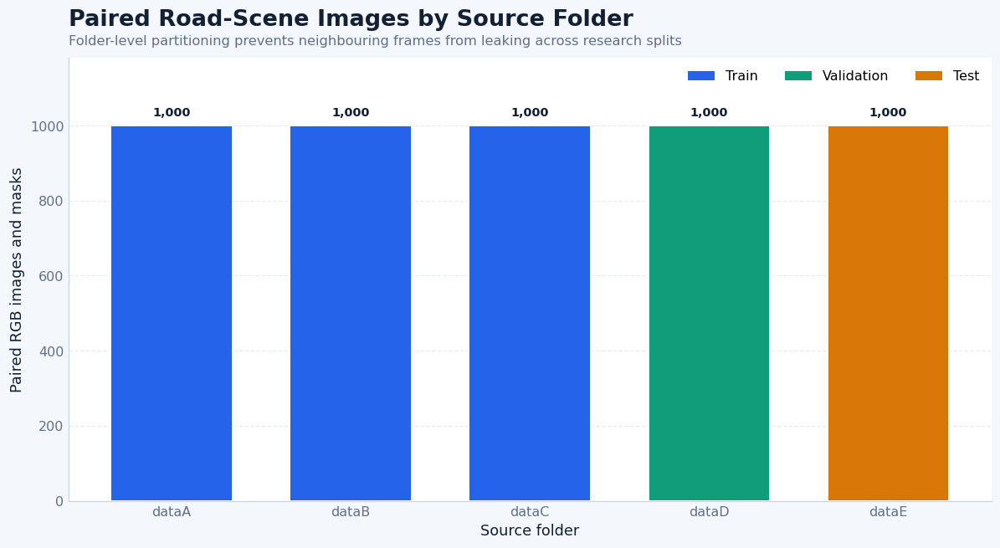

Saved figure: /kaggle/working/road_segmentation_outputs/figures/01_folder_counts.png


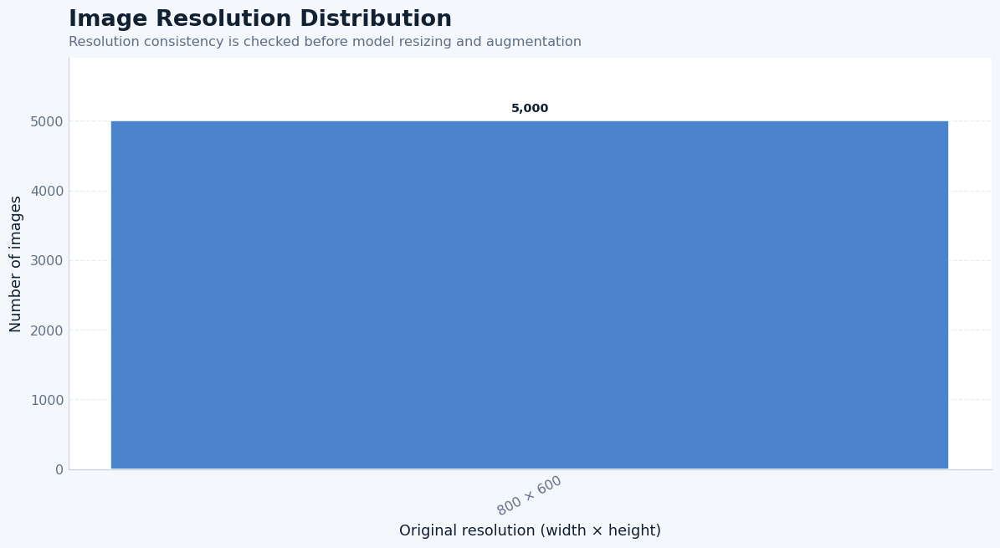

Saved figure: /kaggle/working/road_segmentation_outputs/figures/02_resolution_distribution.png


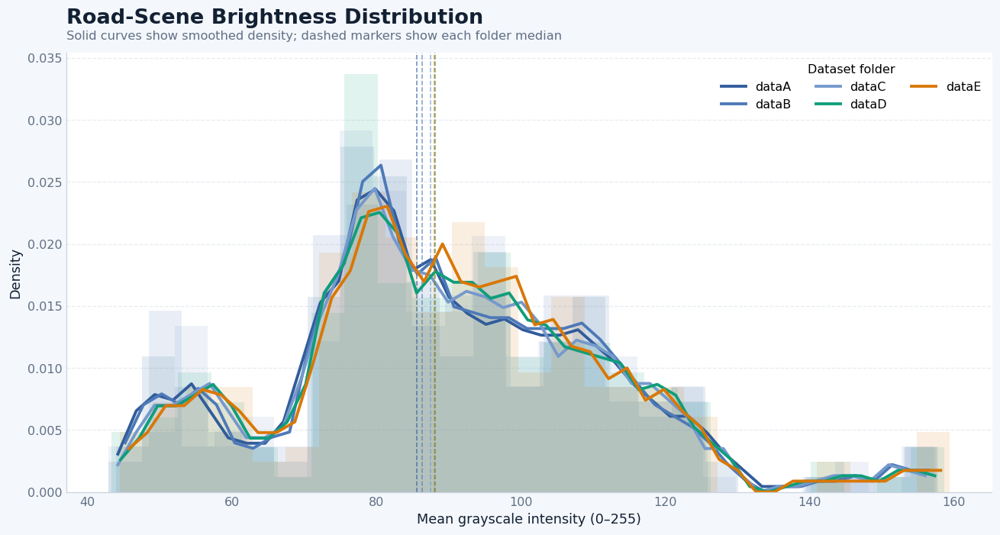

Saved figure: /kaggle/working/road_segmentation_outputs/figures/03_brightness_distribution.png


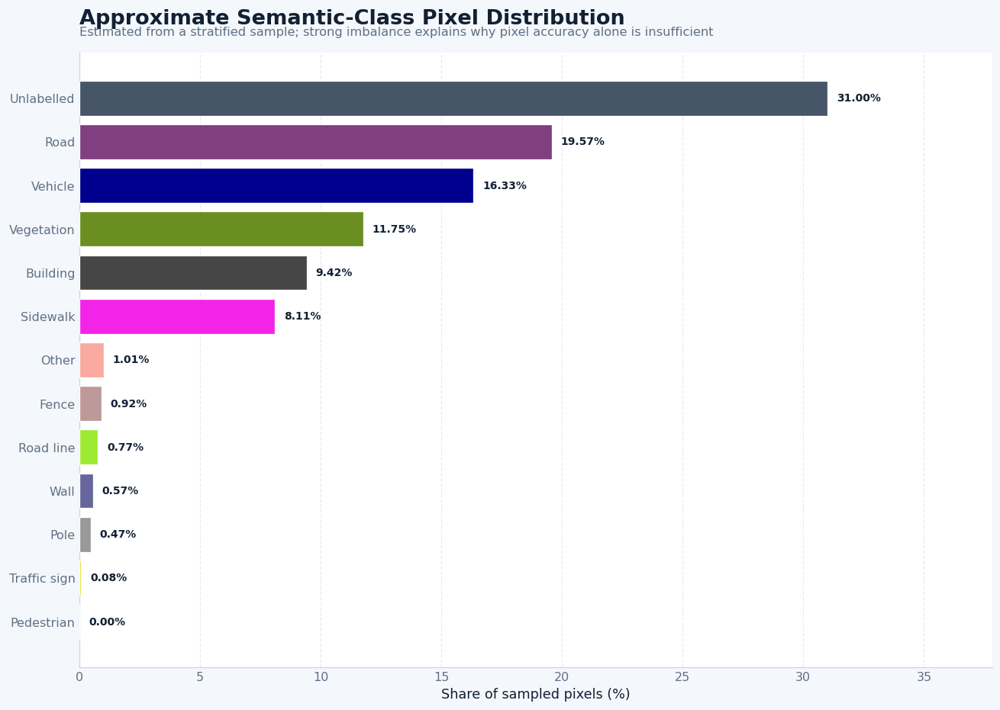

Saved figure: /kaggle/working/road_segmentation_outputs/figures/04_class_pixel_distribution.png


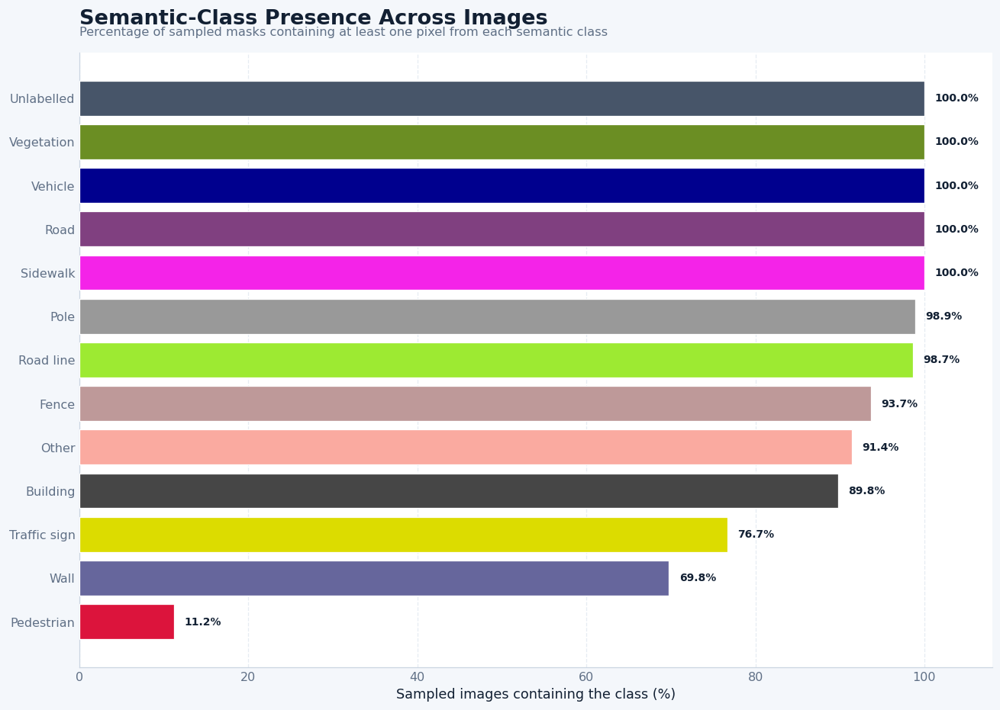

Saved figure: /kaggle/working/road_segmentation_outputs/figures/05_class_presence.png


In [20]:
# Charts 1–5: dataset composition, image properties and class imbalance


# Chart 1: paired images by source folder and research split

folder_counts = (
    pairs_df.groupby(["folder", "split"])
    .size()
    .reset_index(name="images")
    .sort_values("folder")
)

fig, ax = plt.subplots(figsize=(10.5, 5.8))
bar_colours = [SPLIT_COLORS.get(split, THEME["accent"]) for split in folder_counts["split"]]
bars = ax.bar(
    folder_counts["folder"],
    folder_counts["images"],
    color=bar_colours,
    width=0.68,
    edgecolor="white",
    linewidth=1.2,
    zorder=3,
)
add_chart_heading(
    ax,
    "Paired Road-Scene Images by Source Folder",
    "Folder-level partitioning prevents neighbouring frames from leaking across research splits",
)
ax.set_xlabel("Source folder")
ax.set_ylabel("Paired RGB images and masks")
ax.set_ylim(0, folder_counts["images"].max() * 1.18)
style_axis(ax)
add_vertical_labels(ax, folder_counts["images"].to_numpy(), lambda value: f"{int(value):,}")
legend_handles = [
    Patch(facecolor=colour, label=split.title())
    for split, colour in SPLIT_COLORS.items()
    if split in set(folder_counts["split"])
]
ax.legend(handles=legend_handles, loc="upper right", ncol=len(legend_handles))
fig.tight_layout()
save_research_figure(fig, "01_folder_counts.png")



# Chart 2: image-resolution distribution

resolution_plot = resolution_df.copy().sort_values("count", ascending=False)
resolution_labels = [
    f"{int(width)} × {int(height)}"
    for width, height in zip(resolution_plot.image_width, resolution_plot.image_height)
]

fig, ax = plt.subplots(figsize=(10.5, 5.8))
bars = ax.bar(
    resolution_labels,
    resolution_plot["count"],
    color="#4B83CC",
    width=0.65,
    edgecolor="white",
    linewidth=1.0,
    zorder=3,
)
add_chart_heading(
    ax,
    "Image Resolution Distribution",
    "Resolution consistency is checked before model resizing and augmentation",
)
ax.set_xlabel("Original resolution (width × height)")
ax.set_ylabel("Number of images")
ax.tick_params(axis="x", rotation=28)
ax.set_ylim(0, resolution_plot["count"].max() * 1.18)
style_axis(ax)
add_vertical_labels(ax, resolution_plot["count"].to_numpy(), lambda value: f"{int(value):,}")
fig.tight_layout()
save_research_figure(fig, "02_resolution_distribution.png")



# Chart 3: mean-brightness distribution by folder

fig, ax = plt.subplots(figsize=(11.5, 6.2))
for folder, group in brightness_df.groupby("folder"):
    colour = FOLDER_COLORS.get(folder, THEME["accent"])
    values = group["mean_brightness"].dropna().astype(float)
    ax.hist(
        values,
        bins=25,
        density=True,
        alpha=0.12,
        color=colour,
        edgecolor="none",
    )
    centres, density = smooth_density(values, bins=45, window=5)
    ax.plot(centres, density, color=colour, linewidth=2.4, label=folder)
    ax.axvline(values.median(), color=colour, linewidth=1.0, linestyle="--", alpha=0.7)

add_chart_heading(
    ax,
    "Road-Scene Brightness Distribution",
    "Solid curves show smoothed density; dashed markers show each folder median",
)
ax.set_xlabel("Mean grayscale intensity (0–255)")
ax.set_ylabel("Density")
style_axis(ax)
ax.legend(title="Dataset folder", loc="upper right", ncol=3)
fig.tight_layout()
save_research_figure(fig, "03_brightness_distribution.png")



# Chart 4: approximate class pixel distribution

ordered = class_eda_df.sort_values("pixel_percentage", ascending=True).copy()
class_bar_colours = [
    tuple((CLASS_COLORS[int(class_id)] / 255.0).tolist())
    for class_id in ordered["class_id"]
]
# Improve visibility of the black unlabelled class on a light panel.
class_bar_colours = ["#475569" if int(class_id) == 0 else colour
                     for class_id, colour in zip(ordered["class_id"], class_bar_colours)]

fig, ax = plt.subplots(figsize=(11.5, 8.2))
ax.barh(
    ordered["class_name"],
    ordered["pixel_percentage"],
    color=class_bar_colours,
    edgecolor="white",
    linewidth=0.8,
    zorder=3,
)
add_chart_heading(
    ax,
    "Approximate Semantic-Class Pixel Distribution",
    "Estimated from a stratified sample; strong imbalance explains why pixel accuracy alone is insufficient",
)
ax.set_xlabel("Share of sampled pixels (%)")
ax.set_ylabel("")
ax.set_xlim(0, max(ordered["pixel_percentage"].max() * 1.22, 1))
style_axis(ax, grid_axis="x")
add_horizontal_labels(ax, ordered["pixel_percentage"].to_numpy(), lambda value: f"{value:.2f}%")
fig.tight_layout()
save_research_figure(fig, "04_class_pixel_distribution.png")



# Chart 5: class presence across sampled images

ordered_presence = class_eda_df.sort_values("image_presence_percentage", ascending=True).copy()
presence_colours = [
    tuple((CLASS_COLORS[int(class_id)] / 255.0).tolist())
    for class_id in ordered_presence["class_id"]
]
presence_colours = ["#475569" if int(class_id) == 0 else colour
                    for class_id, colour in zip(ordered_presence["class_id"], presence_colours)]

fig, ax = plt.subplots(figsize=(11.5, 8.2))
ax.barh(
    ordered_presence["class_name"],
    ordered_presence["image_presence_percentage"],
    color=presence_colours,
    edgecolor="white",
    linewidth=0.8,
    zorder=3,
)
add_chart_heading(
    ax,
    "Semantic-Class Presence Across Images",
    "Percentage of sampled masks containing at least one pixel from each semantic class",
)
ax.set_xlabel("Sampled images containing the class (%)")
ax.set_ylabel("")
ax.set_xlim(0, 108)
style_axis(ax, grid_axis="x")
add_horizontal_labels(
    ax,
    ordered_presence["image_presence_percentage"].to_numpy(),
    lambda value: f"{value:.1f}%",
)
fig.tight_layout()
save_research_figure(fig, "05_class_presence.png")

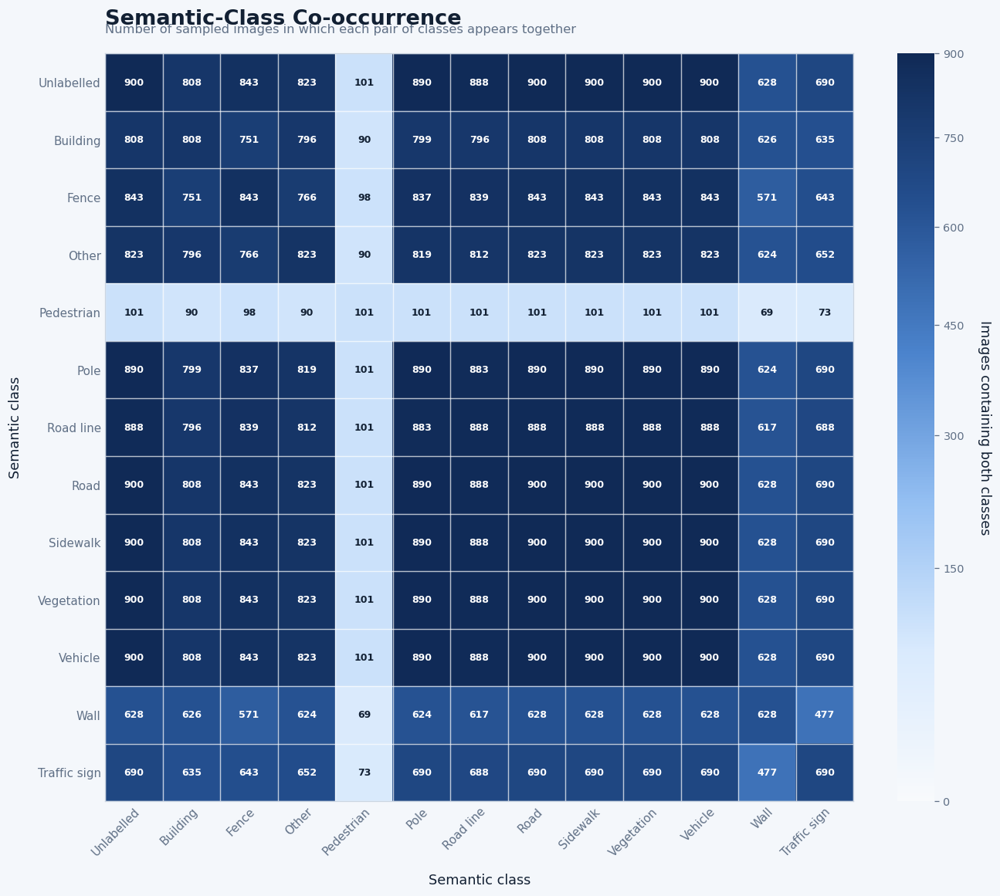

Saved figure: /kaggle/working/road_segmentation_outputs/figures/06_class_cooccurrence.png


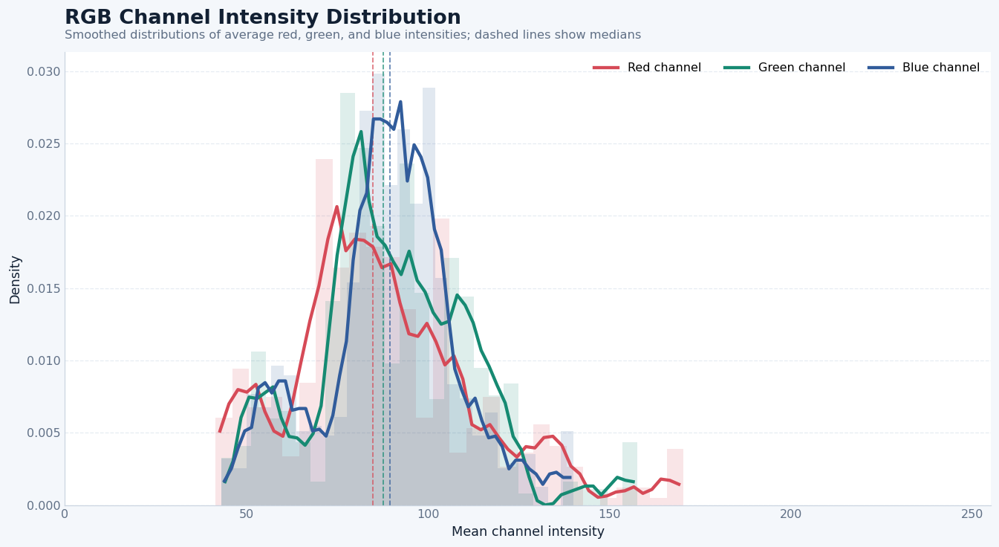

Saved figure: /kaggle/working/road_segmentation_outputs/figures/07_rgb_channel_distribution.png


,Mean,Median,Standard deviation,Minimum,Maximum
mean_red,88.428,84.773,26.488,41.478,170.337
mean_green,90.297,87.732,21.933,43.029,157.635
mean_blue,88.978,89.540,18.965,43.033,140.028


In [21]:
# Charts 6–7: class relationships and colour-channel properties


# Chart 6: semantic-class co-occurrence heatmap
# Matplotlib compatibility fix: tick locations and labels are set separately.

fig, ax = plt.subplots(figsize=(13.2, 10.2))
max_value = max(float(np.max(cooccurrence)), 1.0)
im = ax.imshow(
    cooccurrence,
    cmap=HEATMAP_CMAP,
    aspect="equal",
    interpolation="nearest",
    norm=PowerNorm(gamma=0.65, vmin=0, vmax=max_value),
)

ax.set_xticks(np.arange(CFG.num_classes))
ax.set_xticklabels(
    CLASS_NAMES,
    rotation=45,
    ha="right",
    rotation_mode="anchor",
    fontsize=9.5,
)
ax.set_yticks(np.arange(CFG.num_classes))
ax.set_yticklabels(CLASS_NAMES, fontsize=9.5)
ax.set_xlabel("Semantic class", labelpad=12)
ax.set_ylabel("Semantic class", labelpad=12)
add_chart_heading(
    ax,
    "Semantic-Class Co-occurrence",
    "Number of sampled images in which each pair of classes appears together",
)

# Cell boundaries improve readability without relying on seaborn.
ax.set_xticks(np.arange(-0.5, CFG.num_classes, 1), minor=True)
ax.set_yticks(np.arange(-0.5, CFG.num_classes, 1), minor=True)
ax.grid(which="minor", color="white", linestyle="-", linewidth=0.9, alpha=0.70)
ax.tick_params(which="minor", bottom=False, left=False)
ax.tick_params(which="major", length=0)

threshold = max_value * 0.48
for row_index in range(CFG.num_classes):
    for column_index in range(CFG.num_classes):
        value = int(cooccurrence[row_index, column_index])
        ax.text(
            column_index,
            row_index,
            f"{value:,}",
            ha="center",
            va="center",
            fontsize=7.8,
            color="#FFFFFF" if value > threshold else THEME["ink"],
            fontweight="semibold",
        )

colour_bar = fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
colour_bar.set_label("Images containing both classes", rotation=270, labelpad=22)
colour_bar.ax.tick_params(colors=THEME["muted"], labelsize=9)
colour_bar.outline.set_visible(False)
colour_bar.ax.yaxis.set_major_locator(MaxNLocator(nbins=6))
fig.tight_layout()
save_research_figure(fig, "06_class_cooccurrence.png")


# Chart 7: RGB channel intensity distributions

fig, ax = plt.subplots(figsize=(11.8, 6.5))
channel_settings = [
    ("mean_red", "Red channel", "#D64A57"),
    ("mean_green", "Green channel", "#168A72"),
    ("mean_blue", "Blue channel", "#315C9B"),
]

for column, label, colour in channel_settings:
    values = brightness_df[column].dropna().astype(float)
    ax.hist(
        values,
        bins=28,
        density=True,
        alpha=0.14,
        color=colour,
        edgecolor="none",
    )
    centres, density = smooth_density(values, bins=52, window=5)
    ax.plot(centres, density, color=colour, linewidth=2.7, label=label)
    ax.axvline(values.median(), color=colour, linestyle="--", linewidth=1.1, alpha=0.75)

add_chart_heading(
    ax,
    "RGB Channel Intensity Distribution",
    "Smoothed distributions of average red, green, and blue intensities; dashed lines show medians",
)
ax.set_xlabel("Mean channel intensity")
ax.set_ylabel("Density")
style_axis(ax)
rgb_maximum = brightness_df[["mean_red", "mean_green", "mean_blue"]].max().max()
ax.set_xlim(0, 1 if rgb_maximum <= 1.5 else 255)
ax.legend(loc="upper right", ncol=3)
fig.tight_layout()
save_research_figure(fig, "07_rgb_channel_distribution.png")

rgb_summary = (
    brightness_df[["mean_red", "mean_green", "mean_blue"]]
    .agg(["mean", "median", "std", "min", "max"])
    .T
)
rgb_summary.columns = ["Mean", "Median", "Standard deviation", "Minimum", "Maximum"]
display(rgb_summary.round(3))

### 5.2 Image, ground-truth mask and overlay examples

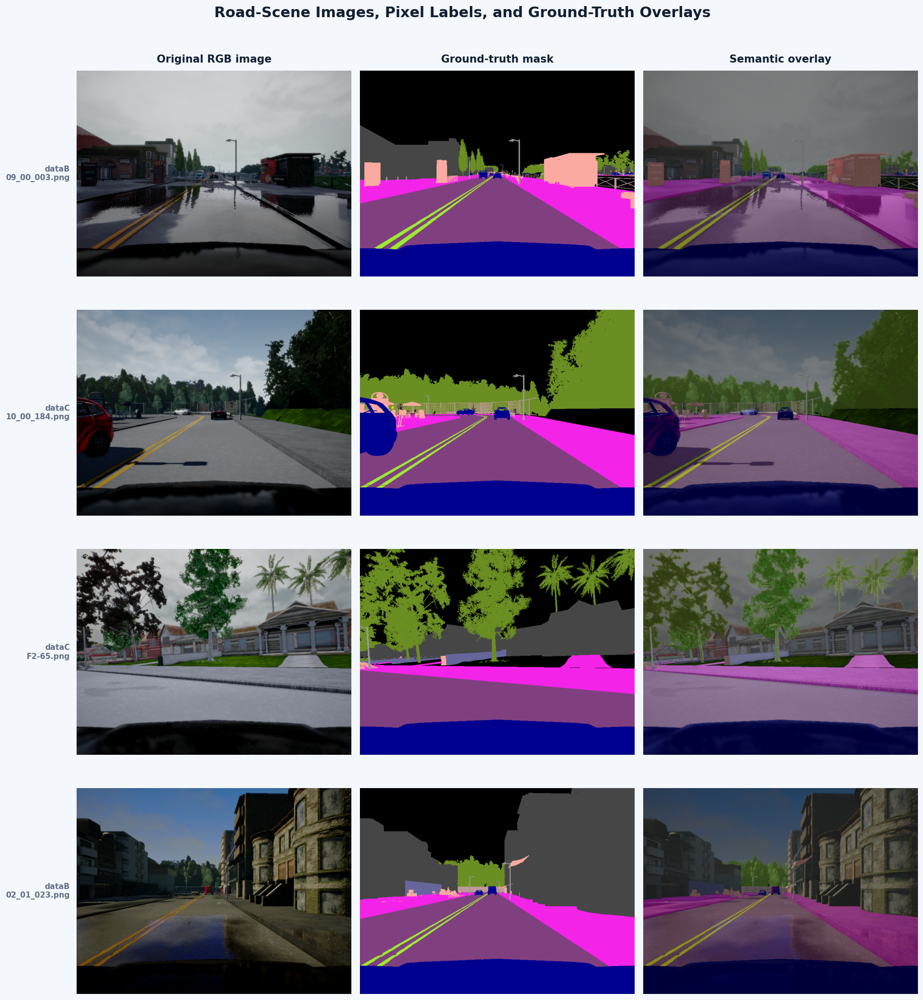

Saved figure: /kaggle/working/road_segmentation_outputs/figures/08_image_mask_overlay_examples.png


In [22]:
def show_dataset_examples(frame: pd.DataFrame, n: int = 4, seed: int = 42) -> None:
    sample = frame.sample(min(n, len(frame)), random_state=seed)
    fig, axes = plt.subplots(len(sample), 3, figsize=(16, 4.35 * len(sample)))
    axes = np.atleast_2d(axes)
    fig.patch.set_facecolor(THEME["page"])

    column_titles = ["Original RGB image", "Ground-truth mask", "Semantic overlay"]
    for column_index, title in enumerate(column_titles):
        axes[0, column_index].set_title(title, fontsize=13, fontweight="bold", pad=10)

    for row_index, row in enumerate(sample.itertuples(index=False)):
        image = np.asarray(Image.open(row.image_path).convert("RGB"))
        labels = decode_mask(np.asarray(Image.open(row.mask_path)))
        coloured = colorize_mask(labels)
        overlay = cv2.addWeighted(image, 0.60, coloured, 0.40, 0)
        views = [image, coloured, overlay]

        for column_index, view in enumerate(views):
            axes[row_index, column_index].imshow(view)
            axes[row_index, column_index].axis("off")
            for spine in axes[row_index, column_index].spines.values():
                spine.set_visible(True)
                spine.set_color("#E2E8F0")
                spine.set_linewidth(1.2)

        axes[row_index, 0].text(
            -0.025,
            0.5,
            f"{row.folder}\n{row.filename}",
            transform=axes[row_index, 0].transAxes,
            ha="right",
            va="center",
            fontsize=9.5,
            color=THEME["muted"],
            fontweight="semibold",
        )

    fig.suptitle(
        "Road-Scene Images, Pixel Labels, and Ground-Truth Overlays",
        fontsize=18,
        fontweight="bold",
        color=THEME["ink"],
        y=1.005,
    )
    fig.tight_layout()
    save_research_figure(fig, "08_image_mask_overlay_examples.png")

show_dataset_examples(pairs_df, n=4, seed=CFG.seed)

## 6. Reproducible PyTorch data pipeline

Masks are always resized with nearest-neighbour interpolation. Random augmentation is restricted to training. Validation and test images use deterministic preprocessing.

In [23]:

# SELF-CONTAINED JOINT IMAGE/MASK AUGMENTATION
# Compatible with Python 3.7 and PyTorch 1.7.1


MEAN = np.asarray(
    (0.485, 0.456, 0.406),
    dtype=np.float32,
)
STD = np.asarray(
    (0.229, 0.224, 0.225),
    dtype=np.float32,
)


class RoadSceneTransform:
    """
    Jointly transforms an RGB image and its segmentation mask.

    Images use bilinear resizing. Masks use nearest-neighbour
    resizing so integer class labels remain unchanged.
    """

    def __init__(
        self,
        height: int,
        width: int,
        training: bool,
    ):
        self.height = int(height)
        self.width = int(width)
        self.training = bool(training)

    def _brightness_contrast(
        self,
        image: np.ndarray,
    ) -> np.ndarray:
        contrast = random.uniform(0.82, 1.18)
        brightness = random.uniform(-0.18, 0.18) * 255.0

        image = (
            image.astype(np.float32) * contrast
            + brightness
        )

        return np.clip(
            image,
            0,
            255,
        ).astype(np.uint8)

    def _hsv_jitter(
        self,
        image: np.ndarray,
    ) -> np.ndarray:
        hsv = cv2.cvtColor(
            image,
            cv2.COLOR_RGB2HSV,
        ).astype(np.int16)

        hsv[..., 0] = (
            hsv[..., 0]
            + random.randint(-8, 8)
        ) % 180

        hsv[..., 1] = np.clip(
            hsv[..., 1]
            + random.randint(-12, 12),
            0,
            255,
        )

        hsv[..., 2] = np.clip(
            hsv[..., 2]
            + random.randint(-10, 10),
            0,
            255,
        )

        return cv2.cvtColor(
            hsv.astype(np.uint8),
            cv2.COLOR_HSV2RGB,
        )

    def _motion_blur(
        self,
        image: np.ndarray,
    ) -> np.ndarray:
        kernel_size = 5
        kernel = np.zeros(
            (kernel_size, kernel_size),
            dtype=np.float32,
        )

        if random.random() < 0.5:
            kernel[kernel_size // 2, :] = 1.0
        else:
            kernel[:, kernel_size // 2] = 1.0

        kernel /= float(kernel_size)

        return cv2.filter2D(
            image,
            ddepth=-1,
            kernel=kernel,
        )

    def __call__(
        self,
        image: np.ndarray,
        mask: np.ndarray,
    ) -> Dict[str, torch.Tensor]:
        image = cv2.resize(
            image,
            (self.width, self.height),
            interpolation=cv2.INTER_LINEAR,
        )

        mask = cv2.resize(
            mask.astype(np.int32),
            (self.width, self.height),
            interpolation=cv2.INTER_NEAREST,
        ).astype(np.int64)

        if self.training:
            if random.random() < 0.50:
                image = np.ascontiguousarray(
                    image[:, ::-1, :]
                )
                mask = np.ascontiguousarray(
                    mask[:, ::-1]
                )

            if random.random() < 0.45:
                image = self._brightness_contrast(
                    image
                )

            if random.random() < 0.25:
                image = self._hsv_jitter(
                    image
                )

            if random.random() < 0.12:
                if random.random() < 0.5:
                    image = cv2.GaussianBlur(
                        image,
                        (5, 5),
                        0,
                    )
                else:
                    image = self._motion_blur(
                        image
                    )

        image = image.astype(np.float32) / 255.0

        image = (
            image - MEAN.reshape(1, 1, 3)
        ) / STD.reshape(1, 1, 3)

        image = np.ascontiguousarray(
            image.transpose(2, 0, 1)
        )

        mask = np.ascontiguousarray(mask)

        return {
            "image": torch.from_numpy(image).float(),
            "mask": torch.from_numpy(mask).long(),
        }


train_transform = RoadSceneTransform(
    height=CFG.image_height,
    width=CFG.image_width,
    training=True,
)

validation_transform = RoadSceneTransform(
    height=CFG.image_height,
    width=CFG.image_width,
    training=False,
)


class RoadSceneDataset(Dataset):
    """Paired RGB road images and semantic masks."""

    def __init__(self, frame: pd.DataFrame, transform: RoadSceneTransform):
        required_columns = {
            "image_path", "mask_path", "filename", "folder", "split"
        }
        missing = required_columns.difference(frame.columns)
        if missing:
            raise ValueError(
                "Dataset dataframe is missing required columns: "
                + ", ".join(sorted(missing))
            )

        self.frame = frame.reset_index(drop=True).copy()
        self.transform = transform

    def __len__(self) -> int:
        return len(self.frame)

    def __getitem__(self, index: int):
        row = self.frame.iloc[index]

        image_path = str(row["image_path"])
        mask_path = str(row["mask_path"])

        image = np.asarray(
            Image.open(image_path).convert("RGB")
        )

        raw_mask = np.asarray(Image.open(mask_path))
        mask = decode_mask(raw_mask).astype(np.int64)

        if mask.ndim != 2:
            raise ValueError(
                f"Decoded mask must be 2D, received {mask.shape}: {mask_path}"
            )

        minimum_label = int(mask.min())
        maximum_label = int(mask.max())
        if minimum_label < 0 or maximum_label >= CFG.num_classes:
            raise ValueError(
                f"Invalid labels in {mask_path}. "
                f"Observed [{minimum_label}, {maximum_label}], "
                f"expected [0, {CFG.num_classes - 1}]."
            )

        augmented = self.transform(image=image, mask=mask)
        image_tensor = augmented["image"].float()
        mask_tensor = augmented["mask"].long()

        if mask_tensor.ndim == 3 and mask_tensor.shape[0] == 1:
            mask_tensor = mask_tensor.squeeze(0)

        return {
            "image": image_tensor,
            "mask": mask_tensor,
            "filename": str(row["filename"]),
            "folder": str(row["folder"]),
        }


# Folder-aware partitions prepared earlier in the notebook.
train_df = (
    pairs_df[pairs_df["split"] == "train"]
    .reset_index(drop=True)
)
validation_df = (
    pairs_df[pairs_df["split"] == "validation"]
    .reset_index(drop=True)
)
test_df = (
    pairs_df[pairs_df["split"] == "test"]
    .reset_index(drop=True)
)

assert len(train_df) > 0, "Training dataframe is empty."
assert len(validation_df) > 0, "Validation dataframe is empty."
assert len(test_df) > 0, "Test dataframe is empty."

print("Dataset split sizes")
print(f"Training:   {len(train_df):,}")
print(f"Validation: {len(validation_df):,}")
print(f"Test:       {len(test_df):,}")

# Verify there is no path overlap between partitions.
train_paths = set(train_df["image_path"].astype(str))
validation_paths = set(validation_df["image_path"].astype(str))
test_paths = set(test_df["image_path"].astype(str))

assert train_paths.isdisjoint(validation_paths)
assert train_paths.isdisjoint(test_paths)
assert validation_paths.isdisjoint(test_paths)
print("No image-path overlap was found between partitions.")

train_dataset = RoadSceneDataset(train_df, train_transform)
validation_dataset = RoadSceneDataset(validation_df, validation_transform)
test_dataset = RoadSceneDataset(test_df, validation_transform)

# Validate several samples before DataLoader creation.
for sample_index in range(min(5, len(train_dataset))):
    sample = train_dataset[sample_index]
    image_tensor = sample["image"]
    mask_tensor = sample["mask"]

    assert image_tensor.ndim == 3
    assert image_tensor.shape[0] == 3
    assert mask_tensor.ndim == 2
    assert image_tensor.shape[-2:] == mask_tensor.shape[-2:]
    assert torch.isfinite(image_tensor).all()
    assert int(mask_tensor.min()) >= 0
    assert int(mask_tensor.max()) < CFG.num_classes

print("Individual dataset samples passed validation.")


# Stable Kaggle loader configuration
#
# Two worker processes decode and augment images in parallel.
# Pinned memory remains disabled, which avoids the earlier Kaggle
# "Pin memory thread exited unexpectedly" failure.

SAFE_NUM_WORKERS = max(0, int(CFG.num_workers))
SAFE_PIN_MEMORY = False

loader_generator = torch.Generator()
loader_generator.manual_seed(CFG.seed)


def seed_worker(worker_id: int) -> None:
    worker_seed = CFG.seed + worker_id
    random.seed(worker_seed)
    np.random.seed(worker_seed)


def create_dataloader(
    dataset: Dataset,
    shuffle: bool,
    drop_last: bool,
) -> DataLoader:
    loader_arguments = dict(
        dataset=dataset,
        batch_size=CFG.batch_size,
        shuffle=shuffle,
        drop_last=drop_last,
        num_workers=SAFE_NUM_WORKERS,
        pin_memory=SAFE_PIN_MEMORY,
        generator=loader_generator if shuffle else None,
        worker_init_fn=seed_worker if SAFE_NUM_WORKERS > 0 else None,
    )

    # PyTorch 1.7 supports prefetch_factor only when workers are enabled.
    if SAFE_NUM_WORKERS > 0:
        loader_arguments["prefetch_factor"] = 2

    return DataLoader(**loader_arguments)


train_loader = create_dataloader(
    train_dataset,
    shuffle=True,
    drop_last=True,
)
validation_loader = create_dataloader(
    validation_dataset,
    shuffle=False,
    drop_last=False,
)
test_loader = create_dataloader(
    test_dataset,
    shuffle=False,
    drop_last=False,
)

# Validate one complete batch.
first_batch = next(iter(train_loader))
assert first_batch["image"].ndim == 4
assert first_batch["mask"].ndim == 3
assert first_batch["image"].shape[0] == first_batch["mask"].shape[0]
assert first_batch["image"].shape[-2:] == first_batch["mask"].shape[-2:]
assert int(first_batch["mask"].min()) >= 0
assert int(first_batch["mask"].max()) < CFG.num_classes

print({
    "training_images": len(train_dataset),
    "validation_images": len(validation_dataset),
    "test_images": len(test_dataset),
    "training_batches": len(train_loader),
    "validation_batches": len(validation_loader),
    "test_batches": len(test_loader),
    "batch_size": CFG.batch_size,
    "num_workers": SAFE_NUM_WORKERS,
    "pin_memory": SAFE_PIN_MEMORY,
})


Dataset split sizes
Training:   3,000
Validation: 1,000
Test:       1,000
No image-path overlap was found between partitions.
Individual dataset samples passed validation.
{'training_images': 3000, 'validation_images': 1000, 'test_images': 1000, 'training_batches': 187, 'validation_batches': 63, 'test_batches': 63, 'batch_size': 16, 'num_workers': 2, 'pin_memory': False}


Image tensor: (16, 3, 192, 256) torch.float32
Mask tensor: (16, 192, 256) torch.int64
Mask labels: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12]


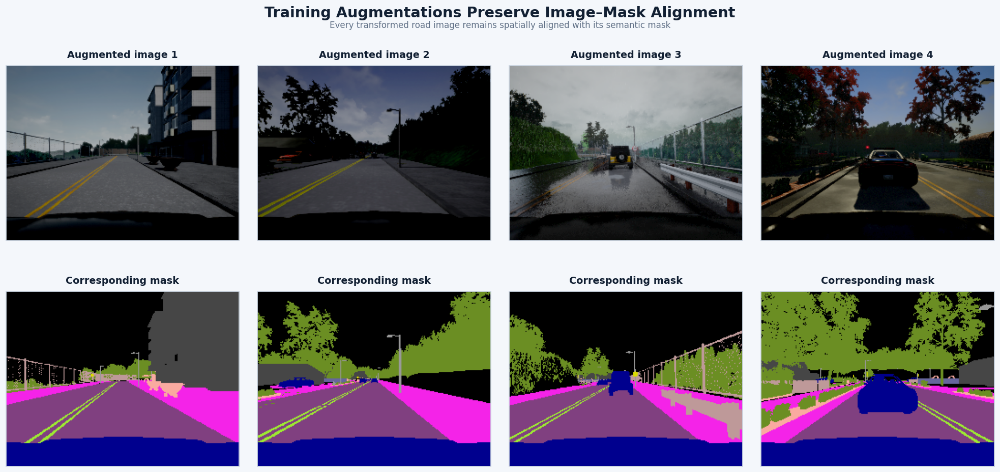

Saved figure: /kaggle/working/road_segmentation_outputs/figures/09_training_augmentations.png


In [24]:
# Verify one transformed batch and visualise paired augmentations.

batch = next(iter(train_loader))
images = batch["image"]
masks = batch["mask"]

print("Image tensor:", tuple(images.shape), images.dtype)
print("Mask tensor:", tuple(masks.shape), masks.dtype)
print("Mask labels:", torch.unique(masks).cpu().tolist())

assert images.ndim == 4
assert masks.ndim == 3
assert images.shape[0] == masks.shape[0]
assert images.shape[-2:] == masks.shape[-2:]
assert int(masks.min()) >= 0
assert int(masks.max()) < CFG.num_classes

sample_count = min(4, images.shape[0])

fig, axes = plt.subplots(
    2,
    sample_count,
    figsize=(4.4 * sample_count, 8.4),
    squeeze=False,
)
fig.patch.set_facecolor(THEME["page"])

mean_array = np.asarray(MEAN, dtype=np.float32).reshape(1, 1, 3)
std_array = np.asarray(STD, dtype=np.float32).reshape(1, 1, 3)

for sample_index in range(sample_count):
    image = (
        images[sample_index]
        .detach()
        .cpu()
        .permute(1, 2, 0)
        .numpy()
    )
    image = np.clip(image * std_array + mean_array, 0.0, 1.0)

    mask = (
        masks[sample_index]
        .detach()
        .cpu()
        .numpy()
        .astype(np.int64)
    )

    axes[0, sample_index].imshow(image)
    axes[1, sample_index].imshow(colorize_mask(mask))

    axes[0, sample_index].set_title(
        f"Augmented image {sample_index + 1}",
        fontsize=12,
        fontweight="bold",
        color=THEME["ink"],
        pad=10,
    )
    axes[1, sample_index].set_title(
        "Corresponding mask",
        fontsize=12,
        fontweight="bold",
        color=THEME["ink"],
        pad=10,
    )

    for row_index in range(2):
        axis = axes[row_index, sample_index]
        axis.set_xticks([])
        axis.set_yticks([])
        for spine in axis.spines.values():
            spine.set_visible(True)
            spine.set_color(THEME["border"])
            spine.set_linewidth(1.1)

fig.suptitle(
    "Training Augmentations Preserve Image–Mask Alignment",
    fontsize=18,
    fontweight="bold",
    color=THEME["ink"],
    y=0.995,
)
fig.text(
    0.5,
    0.955,
    "Every transformed road image remains spatially aligned with its semantic mask",
    ha="center",
    va="center",
    fontsize=10.5,
    color=THEME["muted"],
)
fig.subplots_adjust(
    left=0.02,
    right=0.98,
    top=0.90,
    bottom=0.03,
    wspace=0.08,
    hspace=0.12,
)

save_research_figure(fig, "09_training_augmentations.png")


## 7. Training class weights

Weights are estimated from all training masks at a reduced resolution and transformed with the logarithmic ENet weighting formula. This reduces domination by common classes without giving unstable extreme weights to very rare pixels.

In [25]:
def estimate_training_class_weights(frame: pd.DataFrame, resize_to=(192, 144)):
    counts = np.zeros(CFG.num_classes, dtype=np.int64)
    for row in tqdm(
        frame.itertuples(index=False),
        total=len(frame),
        desc="Class-weight scan",
        dynamic_ncols=False,
        mininterval=0.5,
    ):
        labels = decode_mask(np.asarray(Image.open(row.mask_path)))
        labels = cv2.resize(labels.astype(np.uint8), resize_to, interpolation=cv2.INTER_NEAREST)
        counts += np.bincount(labels.ravel(), minlength=CFG.num_classes)
    frequencies = counts / max(counts.sum(), 1)
    weights = 1.0 / np.log(1.02 + frequencies)
    weights = weights / weights.mean()
    return counts, frequencies, weights

train_pixel_counts, train_frequencies, class_weights_np = estimate_training_class_weights(train_df)
class_weights = torch.tensor(class_weights_np, dtype=torch.float32, device=DEVICE)
weight_table = pd.DataFrame({
    "class_id": range(CFG.num_classes),
    "class_name": CLASS_NAMES,
    "estimated_training_pixels": train_pixel_counts,
    "frequency": train_frequencies,
    "loss_weight": class_weights_np,
})
weight_table.to_csv(TABLE_DIR / "training_class_weights.csv", index=False)
display(weight_table)

Class-weight scan: 100%|██████████| 3000/3000 [01:09<00:00, 43.12it/s]


,class_id,class_name,estimated_training_pixels,frequency,loss_weight
0,0,Unlabelled,26031737,0.313847,0.139349
1,1,Building,7021767,0.084657,0.403295
2,2,Fence,834445,0.010060,1.355346
3,3,Other,857259,0.010335,1.343237
4,4,Pedestrian,5328,0.000064,2.020668
5,5,Pole,404179,0.004873,1.633864
6,6,Road line,624849,0.007533,1.477912
7,7,Road,16162773,0.194864,0.206245
8,8,Sidewalk,6517139,0.078573,0.426987
9,9,Vegetation,10299664,0.124176,0.298042


## 8. Self-contained UREC1 model implementations

The three architectures are implemented directly in PyTorch to avoid fragile compiled MMCV/OpenMMLab dependencies in Kaggle.

- **BiSeNetV2:** detail and semantic branches with bilateral guided aggregation.
- **DDRNet-23-Slim:** parallel high-/low-resolution processing with bilateral exchanges and DAPPM-style context.
- **STDC-Seg:** short-term dense concatenation, attention refinement and feature fusion.

All models produce 13-class logits and use the same research split, optimiser, loss family, early-stopping rule and evaluation protocol.


In [26]:

# SELF-CONTAINED PYTORCH REAL-TIME SEGMENTATION MODELS
# No MMSegmentation or compiled MMCV operators are required.
# Compatible with modern Kaggle PyTorch runtimes.


class ConvBNReLU(nn.Sequential):
    def __init__(
        self,
        in_channels,
        out_channels,
        kernel_size=3,
        stride=1,
        padding=None,
        groups=1,
    ):
        if padding is None:
            padding = kernel_size // 2

        super().__init__(
            nn.Conv2d(
                in_channels,
                out_channels,
                kernel_size,
                stride=stride,
                padding=padding,
                groups=groups,
                bias=False,
            ),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
        )


class DepthwiseSeparableConv(nn.Module):
    def __init__(self, in_channels, out_channels, stride=1):
        super().__init__()

        self.depthwise = ConvBNReLU(
            in_channels,
            in_channels,
            kernel_size=3,
            stride=stride,
            groups=in_channels,
        )

        self.pointwise = ConvBNReLU(
            in_channels,
            out_channels,
            kernel_size=1,
            padding=0,
        )

    def forward(self, x):
        return self.pointwise(self.depthwise(x))


class SegmentationHead(nn.Module):
    def __init__(
        self,
        in_channels,
        mid_channels,
        num_classes,
        dropout=0.1,
    ):
        super().__init__()

        self.block = nn.Sequential(
            ConvBNReLU(
                in_channels,
                mid_channels,
                kernel_size=3,
            ),
            nn.Dropout2d(dropout),
            nn.Conv2d(
                mid_channels,
                num_classes,
                kernel_size=1,
            ),
        )

    def forward(self, x, output_size):
        logits = self.block(x)

        return F.interpolate(
            logits,
            size=output_size,
            mode="bilinear",
            align_corners=False,
        )



# BiSeNetV2-style bilateral network


class GEBlock(nn.Module):
    def __init__(
        self,
        in_channels,
        out_channels,
        stride=1,
        expansion=6,
    ):
        super().__init__()

        hidden_channels = in_channels * expansion

        self.conv1 = ConvBNReLU(
            in_channels,
            in_channels,
            kernel_size=3,
        )

        self.depthwise = ConvBNReLU(
            in_channels,
            hidden_channels,
            kernel_size=3,
            stride=stride,
            groups=in_channels,
        )

        self.project = nn.Sequential(
            nn.Conv2d(
                hidden_channels,
                out_channels,
                kernel_size=1,
                bias=False,
            ),
            nn.BatchNorm2d(out_channels),
        )

        if stride != 1 or in_channels != out_channels:
            self.shortcut = nn.Sequential(
                nn.Conv2d(
                    in_channels,
                    in_channels,
                    kernel_size=3,
                    stride=stride,
                    padding=1,
                    groups=in_channels,
                    bias=False,
                ),
                nn.BatchNorm2d(in_channels),
                nn.Conv2d(
                    in_channels,
                    out_channels,
                    kernel_size=1,
                    bias=False,
                ),
                nn.BatchNorm2d(out_channels),
            )
        else:
            self.shortcut = nn.Identity()

        self.relu = nn.ReLU(inplace=True)

    def forward(self, x):
        residual = self.shortcut(x)

        x = self.conv1(x)
        x = self.depthwise(x)
        x = self.project(x)

        return self.relu(x + residual)


class DetailBranch(nn.Module):
    def __init__(self):
        super().__init__()

        self.stage1 = nn.Sequential(
            ConvBNReLU(3, 64, 3, stride=2),
            ConvBNReLU(64, 64, 3),
        )

        self.stage2 = nn.Sequential(
            ConvBNReLU(64, 64, 3, stride=2),
            ConvBNReLU(64, 64, 3),
            ConvBNReLU(64, 64, 3),
        )

        self.stage3 = nn.Sequential(
            ConvBNReLU(64, 128, 3, stride=2),
            ConvBNReLU(128, 128, 3),
            ConvBNReLU(128, 128, 3),
        )

    def forward(self, x):
        x = self.stage1(x)
        x = self.stage2(x)
        x = self.stage3(x)

        return x


class SemanticBranch(nn.Module):
    def __init__(self):
        super().__init__()

        self.stem = nn.Sequential(
            ConvBNReLU(3, 16, 3, stride=2),
            ConvBNReLU(16, 16, 3),
            ConvBNReLU(16, 16, 3, stride=2),
        )

        self.stage3 = nn.Sequential(
            GEBlock(16, 32, stride=2),
            GEBlock(32, 32),
        )

        self.stage4 = nn.Sequential(
            GEBlock(32, 64, stride=2),
            GEBlock(64, 64),
        )

        self.stage5 = nn.Sequential(
            GEBlock(64, 128, stride=2),
            GEBlock(128, 128),
            GEBlock(128, 128),
        )

        self.context_conv = ConvBNReLU(
            128,
            128,
            kernel_size=1,
            padding=0,
        )

    def forward(self, x):
        stage2 = self.stem(x)
        stage3 = self.stage3(stage2)
        stage4 = self.stage4(stage3)
        stage5 = self.stage5(stage4)

        context = F.adaptive_avg_pool2d(
            stage5,
            output_size=1,
        )
        context = self.context_conv(context)
        context = F.interpolate(
            context,
            size=stage5.shape[-2:],
            mode="bilinear",
            align_corners=False,
        )

        stage5 = stage5 + context

        return stage2, stage3, stage4, stage5


class BilateralGuidedAggregation(nn.Module):
    def __init__(
        self,
        detail_channels=128,
        semantic_channels=128,
        out_channels=128,
    ):
        super().__init__()

        self.detail_proj = ConvBNReLU(
            detail_channels,
            out_channels,
            kernel_size=3,
        )

        self.semantic_gate = nn.Sequential(
            nn.Conv2d(
                semantic_channels,
                out_channels,
                kernel_size=1,
                bias=False,
            ),
            nn.BatchNorm2d(out_channels),
        )

        self.semantic_proj = ConvBNReLU(
            semantic_channels,
            out_channels,
            kernel_size=3,
        )

        self.output = ConvBNReLU(
            out_channels,
            out_channels,
            kernel_size=3,
        )

    def forward(self, detail, semantic):
        semantic_up = F.interpolate(
            semantic,
            size=detail.shape[-2:],
            mode="bilinear",
            align_corners=False,
        )

        detail_feature = self.detail_proj(detail)
        semantic_feature = self.semantic_proj(semantic_up)
        gate = torch.sigmoid(
            self.semantic_gate(semantic_up)
        )

        return self.output(
            detail_feature * gate + semantic_feature
        )


class BiSeNetV2Standalone(nn.Module):
    def __init__(self, num_classes, use_auxiliary=True):
        super().__init__()

        self.use_auxiliary = use_auxiliary

        self.detail = DetailBranch()
        self.semantic = SemanticBranch()
        self.bga = BilateralGuidedAggregation()

        self.main_head = SegmentationHead(
            128,
            128,
            num_classes,
        )

        self.aux_heads = nn.ModuleList([
            SegmentationHead(16, 32, num_classes),
            SegmentationHead(32, 64, num_classes),
            SegmentationHead(64, 64, num_classes),
            SegmentationHead(128, 128, num_classes),
        ])

    def forward(self, x):
        output_size = x.shape[-2:]

        detail = self.detail(x)
        semantic_features = self.semantic(x)

        fused = self.bga(
            detail,
            semantic_features[-1],
        )

        main_logits = self.main_head(
            fused,
            output_size,
        )

        auxiliary_logits = []

        if self.training and self.use_auxiliary:
            for head, feature in zip(
                self.aux_heads,
                semantic_features,
            ):
                auxiliary_logits.append(
                    head(feature, output_size)
                )

        return {
            "out": main_logits,
            "aux": auxiliary_logits,
        }


# DDRNet-23-Slim-style dual-resolution network


class ResidualBlock(nn.Module):
    def __init__(
        self,
        in_channels,
        out_channels,
        stride=1,
    ):
        super().__init__()

        self.conv1 = ConvBNReLU(
            in_channels,
            out_channels,
            kernel_size=3,
            stride=stride,
        )

        self.conv2 = nn.Sequential(
            nn.Conv2d(
                out_channels,
                out_channels,
                kernel_size=3,
                padding=1,
                bias=False,
            ),
            nn.BatchNorm2d(out_channels),
        )

        if stride != 1 or in_channels != out_channels:
            self.shortcut = nn.Sequential(
                nn.Conv2d(
                    in_channels,
                    out_channels,
                    kernel_size=1,
                    stride=stride,
                    bias=False,
                ),
                nn.BatchNorm2d(out_channels),
            )
        else:
            self.shortcut = nn.Identity()

        self.relu = nn.ReLU(inplace=True)

    def forward(self, x):
        residual = self.shortcut(x)

        x = self.conv1(x)
        x = self.conv2(x)

        return self.relu(x + residual)


def make_residual_layer(
    in_channels,
    out_channels,
    blocks,
    stride=1,
):
    layers = [
        ResidualBlock(
            in_channels,
            out_channels,
            stride=stride,
        )
    ]

    for _ in range(1, blocks):
        layers.append(
            ResidualBlock(
                out_channels,
                out_channels,
            )
        )

    return nn.Sequential(*layers)


class DAPPM(nn.Module):
    def __init__(
        self,
        in_channels,
        branch_channels,
        out_channels,
    ):
        super().__init__()

        self.scales = (1, 2, 4, 8)

        self.scale_convs = nn.ModuleList([
            ConvBNReLU(
                in_channels,
                branch_channels,
                kernel_size=1,
                padding=0,
            )
            for _ in self.scales
        ])

        self.base = ConvBNReLU(
            in_channels,
            branch_channels,
            kernel_size=1,
            padding=0,
        )

        self.compression = ConvBNReLU(
            branch_channels * (len(self.scales) + 1),
            out_channels,
            kernel_size=1,
            padding=0,
        )

        self.shortcut = ConvBNReLU(
            in_channels,
            out_channels,
            kernel_size=1,
            padding=0,
        )

    def forward(self, x):
        height, width = x.shape[-2:]

        features = [self.base(x)]

        for scale, conv in zip(
            self.scales,
            self.scale_convs,
        ):
            pooled = F.adaptive_avg_pool2d(
                x,
                output_size=(
                    min(scale, height),
                    min(scale, width),
                ),
            )

            pooled = conv(pooled)

            pooled = F.interpolate(
                pooled,
                size=(height, width),
                mode="bilinear",
                align_corners=False,
            )

            features.append(pooled)

        return (
            self.compression(
                torch.cat(features, dim=1)
            )
            + self.shortcut(x)
        )


class DualResolutionExchange(nn.Module):
    def __init__(
        self,
        high_channels=32,
        low_channels=128,
    ):
        super().__init__()

        self.high_refine = make_residual_layer(
            high_channels,
            high_channels,
            blocks=2,
        )

        self.low_refine = make_residual_layer(
            low_channels,
            low_channels,
            blocks=2,
        )

        self.low_to_high = nn.Sequential(
            nn.Conv2d(
                low_channels,
                high_channels,
                kernel_size=1,
                bias=False,
            ),
            nn.BatchNorm2d(high_channels),
        )

        self.high_to_low = nn.Sequential(
            ConvBNReLU(
                high_channels,
                high_channels,
                kernel_size=3,
                stride=2,
            ),
            nn.Conv2d(
                high_channels,
                low_channels,
                kernel_size=3,
                padding=1,
                bias=False,
            ),
            nn.BatchNorm2d(low_channels),
        )

        self.relu = nn.ReLU(inplace=True)

    def forward(self, high, low):
        high_refined = self.high_refine(high)
        low_refined = self.low_refine(low)

        low_up = F.interpolate(
            self.low_to_high(low_refined),
            size=high_refined.shape[-2:],
            mode="bilinear",
            align_corners=False,
        )

        high_down = self.high_to_low(
            high_refined
        )

        high_out = self.relu(
            high_refined + low_up
        )

        low_out = self.relu(
            low_refined + high_down
        )

        return high_out, low_out


class DDRNet23SlimStandalone(nn.Module):
    def __init__(self, num_classes, use_auxiliary=True):
        super().__init__()

        self.use_auxiliary = use_auxiliary

        self.stem = nn.Sequential(
            ConvBNReLU(3, 32, 3, stride=2),
            ConvBNReLU(32, 32, 3, stride=2),
        )

        self.layer1 = make_residual_layer(
            32,
            32,
            blocks=2,
        )

        self.layer2 = make_residual_layer(
            32,
            64,
            blocks=2,
            stride=2,
        )

        self.high_transition = ConvBNReLU(
            64,
            32,
            kernel_size=1,
            padding=0,
        )

        self.low_transition = make_residual_layer(
            64,
            128,
            blocks=2,
            stride=2,
        )

        self.exchange1 = DualResolutionExchange(
            32,
            128,
        )

        self.exchange2 = DualResolutionExchange(
            32,
            128,
        )

        self.context = DAPPM(
            128,
            32,
            128,
        )

        self.context_to_high = nn.Sequential(
            nn.Conv2d(
                128,
                32,
                kernel_size=1,
                bias=False,
            ),
            nn.BatchNorm2d(32),
        )

        self.final_refine = make_residual_layer(
            32,
            64,
            blocks=2,
        )

        self.main_head = SegmentationHead(
            64,
            64,
            num_classes,
        )

        self.aux_head = SegmentationHead(
            32,
            32,
            num_classes,
        )

    def forward(self, x):
        output_size = x.shape[-2:]

        x = self.stem(x)
        x = self.layer1(x)
        x = self.layer2(x)

        high = self.high_transition(x)
        low = self.low_transition(x)

        high, low = self.exchange1(
            high,
            low,
        )

        high, low = self.exchange2(
            high,
            low,
        )

        auxiliary_logits = []

        if self.training and self.use_auxiliary:
            auxiliary_logits.append(
                self.aux_head(
                    high,
                    output_size,
                )
            )

        context = self.context(low)
        context = self.context_to_high(context)

        context = F.interpolate(
            context,
            size=high.shape[-2:],
            mode="bilinear",
            align_corners=False,
        )

        fused = self.final_refine(
            high + context
        )

        main_logits = self.main_head(
            fused,
            output_size,
        )

        return {
            "out": main_logits,
            "aux": auxiliary_logits,
        }



# STDC-Seg-style short-term dense concatenation network


class STDCBlock(nn.Module):
    def __init__(
        self,
        in_channels,
        out_channels,
        stride=1,
    ):
        super().__init__()

        channel1 = out_channels // 2
        channel2 = out_channels // 4
        channel3 = out_channels // 8
        channel4 = (
            out_channels
            - channel1
            - channel2
            - channel3
        )

        self.conv1 = ConvBNReLU(
            in_channels,
            channel1,
            kernel_size=1,
            stride=stride,
            padding=0,
        )

        self.conv2 = ConvBNReLU(
            channel1,
            channel2,
            kernel_size=3,
        )

        self.conv3 = ConvBNReLU(
            channel2,
            channel3,
            kernel_size=3,
        )

        self.conv4 = ConvBNReLU(
            channel3,
            channel4,
            kernel_size=3,
        )

    def forward(self, x):
        x1 = self.conv1(x)
        x2 = self.conv2(x1)
        x3 = self.conv3(x2)
        x4 = self.conv4(x3)

        return torch.cat(
            [x1, x2, x3, x4],
            dim=1,
        )


class AttentionRefinementModule(nn.Module):
    def __init__(
        self,
        in_channels,
        out_channels,
    ):
        super().__init__()

        self.feature = ConvBNReLU(
            in_channels,
            out_channels,
            kernel_size=3,
        )

        self.attention = nn.Sequential(
            nn.AdaptiveAvgPool2d(1),
            nn.Conv2d(
                out_channels,
                out_channels,
                kernel_size=1,
                bias=False,
            ),
            nn.BatchNorm2d(out_channels),
            nn.Sigmoid(),
        )

    def forward(self, x):
        feature = self.feature(x)

        return feature * self.attention(feature)


class FeatureFusionModule(nn.Module):
    def __init__(
        self,
        in_channels,
        out_channels,
    ):
        super().__init__()

        self.conv = ConvBNReLU(
            in_channels,
            out_channels,
            kernel_size=1,
            padding=0,
        )

        reduction = max(
            out_channels // 4,
            16,
        )

        self.attention = nn.Sequential(
            nn.AdaptiveAvgPool2d(1),
            nn.Conv2d(
                out_channels,
                reduction,
                kernel_size=1,
            ),
            nn.ReLU(inplace=True),
            nn.Conv2d(
                reduction,
                out_channels,
                kernel_size=1,
            ),
            nn.Sigmoid(),
        )

    def forward(self, x):
        feature = self.conv(x)
        attention = self.attention(feature)

        return feature + feature * attention


class STDCSegStandalone(nn.Module):
    def __init__(self, num_classes, use_auxiliary=True):
        super().__init__()

        self.use_auxiliary = use_auxiliary

        self.stem = nn.Sequential(
            ConvBNReLU(3, 32, 3, stride=2),
            ConvBNReLU(32, 64, 3, stride=2),
        )

        self.stage3 = nn.Sequential(
            STDCBlock(64, 256, stride=2),
            STDCBlock(256, 256),
        )

        self.stage4 = nn.Sequential(
            STDCBlock(256, 512, stride=2),
            STDCBlock(512, 512),
        )

        self.stage5 = nn.Sequential(
            STDCBlock(512, 1024, stride=2),
            STDCBlock(1024, 1024),
        )

        self.arm4 = AttentionRefinementModule(
            512,
            128,
        )

        self.arm5 = AttentionRefinementModule(
            1024,
            128,
        )

        self.global_context = ConvBNReLU(
            1024,
            128,
            kernel_size=1,
            padding=0,
        )

        self.context_refine = ConvBNReLU(
            128,
            128,
            kernel_size=3,
        )

        self.ffm = FeatureFusionModule(
            256 + 128,
            256,
        )

        self.main_head = SegmentationHead(
            256,
            128,
            num_classes,
        )

        self.aux_head3 = SegmentationHead(
            256,
            64,
            num_classes,
        )

        self.aux_head4 = SegmentationHead(
            512,
            64,
            num_classes,
        )

    def forward(self, x):
        output_size = x.shape[-2:]

        x = self.stem(x)
        feature3 = self.stage3(x)
        feature4 = self.stage4(feature3)
        feature5 = self.stage5(feature4)

        global_context = F.adaptive_avg_pool2d(
            feature5,
            output_size=1,
        )

        global_context = self.global_context(
            global_context
        )

        global_context = F.interpolate(
            global_context,
            size=feature5.shape[-2:],
            mode="bilinear",
            align_corners=False,
        )

        context5 = (
            self.arm5(feature5)
            + global_context
        )

        context5 = F.interpolate(
            context5,
            size=feature4.shape[-2:],
            mode="bilinear",
            align_corners=False,
        )

        context4 = (
            self.arm4(feature4)
            + context5
        )

        context4 = self.context_refine(
            context4
        )

        context4 = F.interpolate(
            context4,
            size=feature3.shape[-2:],
            mode="bilinear",
            align_corners=False,
        )

        fused = self.ffm(
            torch.cat(
                [feature3, context4],
                dim=1,
            )
        )

        main_logits = self.main_head(
            fused,
            output_size,
        )

        auxiliary_logits = []

        if self.training and self.use_auxiliary:
            auxiliary_logits = [
                self.aux_head3(
                    feature3,
                    output_size,
                ),
                self.aux_head4(
                    feature4,
                    output_size,
                ),
            ]

        return {
            "out": main_logits,
            "aux": auxiliary_logits,
        }


class RealTimeSegmentationModel(nn.Module):
    """Unified model interface for training, evaluation and export."""

    def __init__(
        self,
        model_name,
        num_classes,
        use_auxiliary=CFG.use_auxiliary_heads,
    ):
        super().__init__()

        self.model_name = model_name
        self.num_classes = num_classes

        if model_name == "BiSeNetV2":
            self.network = BiSeNetV2Standalone(
                num_classes,
                use_auxiliary=use_auxiliary,
            )

        elif model_name == "DDRNet23Slim":
            self.network = DDRNet23SlimStandalone(
                num_classes,
                use_auxiliary=use_auxiliary,
            )

        elif model_name == "STDCSeg":
            self.network = STDCSegStandalone(
                num_classes,
                use_auxiliary=use_auxiliary,
            )

        else:
            raise ValueError(
                "Unknown model: "
                + str(model_name)
            )

    def forward(self, x):
        return self.network(x)


def build_model(
    model_name,
    num_classes=None,
):
    if num_classes is None:
        num_classes = CFG.num_classes

    model = RealTimeSegmentationModel(
        model_name,
        num_classes,
        use_auxiliary=CFG.use_auxiliary_heads,
    ).to(DEVICE)

    # Validate output dimensions before optimiser construction.
    # A batch of two avoids BatchNorm errors in global-context blocks.
    model.train()

    dummy_batch = torch.zeros(
        2,
        3,
        CFG.image_height,
        CFG.image_width,
        device=DEVICE,
        dtype=torch.float32,
    )

    with torch.no_grad():
        output = model(dummy_batch)

    expected_shape = (
        2,
        num_classes,
        CFG.image_height,
        CFG.image_width,
    )

    assert tuple(output["out"].shape) == expected_shape, (
        model_name,
        output["out"].shape,
        expected_shape,
    )

    return model


def count_parameters(model):
    total = sum(
        parameter.numel()
        for parameter in model.parameters()
    )

    trainable = sum(
        parameter.numel()
        for parameter in model.parameters()
        if parameter.requires_grad
    )

    return total, trainable


for model_name in CFG.model_names:
    model = build_model(model_name)

    total, trainable = count_parameters(
        model
    )

    print(
        f"{model_name:16s} "
        f"total={total / 1e6:.3f}M "
        f"trainable={trainable / 1e6:.3f}M"
    )

    del model
    gc.collect()

    if DEVICE.type == "cuda":
        torch.cuda.empty_cache()


BiSeNetV2        total=2.088M trainable=2.088M
DDRNet23Slim     total=2.305M trainable=2.305M
STDCSeg          total=8.264M trainable=8.264M


## 9. Loss functions and segmentation metrics

The main objective combines weighted cross-entropy and soft multiclass Dice loss. Auxiliary heads use cross-entropy. Metrics are calculated from one accumulated multiclass confusion matrix, avoiding the incorrect practice of multiplying integer label maps to obtain Dice.

In [27]:
class MulticlassDiceLoss(nn.Module):
    def __init__(self, num_classes: int, ignore_class: Optional[int] = 0, smooth: float = 1.0):
        super().__init__()
        self.num_classes = num_classes
        self.ignore_class = ignore_class
        self.smooth = smooth

    def forward(self, logits: torch.Tensor, target: torch.Tensor) -> torch.Tensor:
        probabilities = torch.softmax(logits, dim=1)
        one_hot = F.one_hot(target.clamp(0, self.num_classes - 1), self.num_classes)
        one_hot = one_hot.permute(0, 3, 1, 2).float()
        dims = (0, 2, 3)
        intersection = (probabilities * one_hot).sum(dims)
        denominator = probabilities.sum(dims) + one_hot.sum(dims)
        dice = (2.0 * intersection + self.smooth) / (denominator + self.smooth)
        if self.ignore_class is not None and 0 <= self.ignore_class < self.num_classes:
            keep = torch.arange(self.num_classes, device=logits.device) != self.ignore_class
            dice = dice[keep]
        return 1.0 - dice.mean()

cross_entropy_loss = nn.CrossEntropyLoss(weight=class_weights)
dice_loss = MulticlassDiceLoss(CFG.num_classes, ignore_class=0)


def compute_total_loss(outputs: Dict[str, object], target: torch.Tensor):
    logits = outputs["out"]

    # Cross-entropy uses the complete output resolution.
    ce = cross_entropy_loss(logits, target)

    # Dice is calculated at a reduced resolution to avoid constructing a
    # large B x C x H x W one-hot tensor on every training step.
    dice_factor = max(1, int(CFG.dice_downsample_factor))

    if dice_factor > 1:
        reduced_height = max(1, logits.shape[-2] // dice_factor)
        reduced_width = max(1, logits.shape[-1] // dice_factor)

        dice_logits = F.interpolate(
            logits,
            size=(reduced_height, reduced_width),
            mode="bilinear",
            align_corners=False,
        )

        dice_target = F.interpolate(
            target.unsqueeze(1).float(),
            size=(reduced_height, reduced_width),
            mode="nearest",
        ).squeeze(1).long()
    else:
        dice_logits = logits
        dice_target = target

    dice = dice_loss(dice_logits, dice_target)

    main_loss = (
        (1.0 - CFG.dice_loss_weight) * ce
        + CFG.dice_loss_weight * dice
    )

    # Auxiliary heads are disabled in the fast controlled comparison.
    # The block remains compatible if they are enabled later.
    aux_losses = []

    if CFG.aux_loss_weight > 0:
        for aux_logits in outputs.get("aux", []):
            aux_losses.append(
                cross_entropy_loss(aux_logits, target)
            )

    aux_loss = (
        torch.stack(aux_losses).mean()
        if aux_losses
        else logits.new_tensor(0.0)
    )

    total = main_loss + CFG.aux_loss_weight * aux_loss

    return total, {
        "ce": ce.detach(),
        "dice_loss": dice.detach(),
        "aux": aux_loss.detach(),
    }


def update_confusion_matrix(confusion: torch.Tensor, target: torch.Tensor, prediction: torch.Tensor):
    target = target.view(-1)
    prediction = prediction.view(-1)
    valid = (target >= 0) & (target < CFG.num_classes)
    encoded = CFG.num_classes * target[valid] + prediction[valid]
    bincount = torch.bincount(encoded, minlength=CFG.num_classes ** 2)
    confusion += bincount.reshape(CFG.num_classes, CFG.num_classes).to(confusion.device)
    return confusion


def metrics_from_confusion(confusion: np.ndarray):
    confusion = confusion.astype(np.float64)
    tp = np.diag(confusion)
    support = confusion.sum(axis=1)
    predicted = confusion.sum(axis=0)
    total = confusion.sum()
    fn = support - tp
    fp = predicted - tp
    tn = total - tp - fp - fn
    eps = 1e-12

    recall = tp / (tp + fn + eps)
    precision = tp / (tp + fp + eps)
    specificity = tn / (tn + fp + eps)
    f1 = 2 * precision * recall / (precision + recall + eps)
    dice = 2 * tp / (2 * tp + fp + fn + eps)
    iou = tp / (tp + fp + fn + eps)
    class_accuracy = recall

    present = support > 0
    foreground_present = present.copy()
    foreground_present[0] = False
    macro_mask = foreground_present if foreground_present.any() else present

    overall = {
        "pixel_accuracy": float(tp.sum() / (total + eps)),
        "mean_class_accuracy": float(np.nanmean(class_accuracy[present])),
        "mIoU_all": float(np.nanmean(iou[present])),
        "mIoU_foreground": float(np.nanmean(iou[macro_mask])),
        "fwIoU": float(((support[present] / (total + eps)) * iou[present]).sum()),
        "macro_precision": float(np.nanmean(precision[macro_mask])),
        "macro_recall": float(np.nanmean(recall[macro_mask])),
        "macro_specificity": float(np.nanmean(specificity[macro_mask])),
        "macro_f1": float(np.nanmean(f1[macro_mask])),
        "macro_dice": float(np.nanmean(dice[macro_mask])),
    }
    per_class = pd.DataFrame({
        "class_id": np.arange(CFG.num_classes),
        "class_name": CLASS_NAMES,
        "support_pixels": support.astype(np.int64),
        "precision": precision,
        "recall": recall,
        "specificity": specificity,
        "f1": f1,
        "dice": dice,
        "iou": iou,
        "class_accuracy": class_accuracy,
    })
    return overall, per_class

## 10. Training, validation, early stopping and checkpointing

The model checkpoint is selected by **validation foreground mIoU**. The test split is not used for model selection or hyperparameter adjustment.

In [28]:

# ONE-BATCH GPU SPEED AND MEMORY DIAGNOSTIC
# Run this before the full three-model experiment.


def benchmark_training_step(model_name: str = "BiSeNetV2", steps: int = 5):
    if DEVICE.type != "cuda":
        print("GPU is not active. Enable a Kaggle GPU accelerator first.")
        return

    model = build_model(model_name)
    model.train()

    optimizer = torch.optim.AdamW(
        model.parameters(),
        lr=CFG.learning_rate,
        weight_decay=CFG.weight_decay,
    )

    scaler = torch.cuda.amp.GradScaler(
        enabled=AMP_ENABLED
    )

    iterator = iter(train_loader)
    timings = []

    torch.cuda.reset_peak_memory_stats()

    for step_index in range(steps):
        try:
            batch = next(iterator)
        except StopIteration:
            iterator = iter(train_loader)
            batch = next(iterator)

        images = batch["image"].to(DEVICE)
        targets = batch["mask"].to(DEVICE)

        optimizer.zero_grad(set_to_none=True)

        torch.cuda.synchronize()
        start = time.perf_counter()

        with torch.cuda.amp.autocast(
            enabled=AMP_ENABLED
        ):
            outputs = model(images)
            loss, _ = compute_total_loss(
                outputs,
                targets,
            )

        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()

        torch.cuda.synchronize()
        timings.append(
            time.perf_counter() - start
        )

    average_seconds = float(np.mean(timings[1:] or timings))
    peak_memory_gb = (
        torch.cuda.max_memory_allocated()
        / (1024 ** 3)
    )

    print({
        "model": model_name,
        "batch_size": CFG.batch_size,
        "resolution": (
            CFG.image_height,
            CFG.image_width,
        ),
        "average_training_step_seconds": round(
            average_seconds,
            3,
        ),
        "estimated_epoch_minutes": round(
            average_seconds
            * len(train_loader)
            / 60,
            2,
        ),
        "peak_gpu_memory_gb": round(
            peak_memory_gb,
            2,
        ),
        "amp_enabled": AMP_ENABLED,
        "training_batches": len(train_loader),
    })

    del model, optimizer, scaler
    gc.collect()
    torch.cuda.empty_cache()


benchmark_training_step("BiSeNetV2", steps=5)


{'model': 'BiSeNetV2', 'batch_size': 16, 'resolution': (192, 256), 'average_training_step_seconds': 0.049, 'estimated_epoch_minutes': 0.15, 'peak_gpu_memory_gb': 2.23, 'amp_enabled': True, 'training_batches': 187}


In [29]:
def run_epoch(
    model: nn.Module,
    loader: DataLoader,
    optimizer: Optional[torch.optim.Optimizer] = None,
    scaler: Optional[torch.cuda.amp.GradScaler] = None,
    training: bool = False,
):
    model.train(training)

    # Keep accumulators on the active device to avoid synchronising the GPU
    # after every batch.
    running_loss = torch.zeros((), device=DEVICE)
    running_ce = torch.zeros((), device=DEVICE)
    running_dice_loss = torch.zeros((), device=DEVICE)

    confusion = torch.zeros(
        (CFG.num_classes, CFG.num_classes),
        dtype=torch.int64,
        device=DEVICE,
    )

    processed_items = 0

    progress = tqdm(
        loader,
        leave=False,
        desc="Train" if training else "Validate",
        dynamic_ncols=False,
        mininterval=1.0,
    )

    for batch_index, batch in enumerate(progress, start=1):
        images = batch["image"].to(DEVICE)
        targets = batch["mask"].to(DEVICE)

        if training:
            optimizer.zero_grad(set_to_none=True)

        with torch.set_grad_enabled(training):
            with torch.cuda.amp.autocast(enabled=AMP_ENABLED):
                outputs = model(images)
                loss, parts = compute_total_loss(
                    outputs,
                    targets,
                )

            if training:
                scaler.scale(loss).backward()
                scaler.unscale_(optimizer)

                torch.nn.utils.clip_grad_norm_(
                    model.parameters(),
                    CFG.grad_clip_norm,
                )

                scaler.step(optimizer)
                scaler.update()

        with torch.no_grad():
            predictions = outputs["out"].argmax(dim=1)

            # Calculate the confusion matrix directly on the GPU.
            flat_target = targets.reshape(-1)
            flat_prediction = predictions.reshape(-1)

            valid = (
                (flat_target >= 0)
                & (flat_target < CFG.num_classes)
            )

            encoded = (
                CFG.num_classes * flat_target[valid]
                + flat_prediction[valid]
            )

            batch_confusion = torch.bincount(
                encoded,
                minlength=CFG.num_classes ** 2,
            ).reshape(
                CFG.num_classes,
                CFG.num_classes,
            )

            confusion += batch_confusion

            current_batch_size = images.shape[0]
            processed_items += current_batch_size

            running_loss += (
                loss.detach() * current_batch_size
            )
            running_ce += (
                parts["ce"] * current_batch_size
            )
            running_dice_loss += (
                parts["dice_loss"] * current_batch_size
            )

        # Calling .item() forces a GPU synchronisation. Update the visible
        # progress only occasionally rather than on all 188+ batches.
        if (
            batch_index == 1
            or batch_index % CFG.progress_update_interval == 0
            or batch_index == len(loader)
        ):
            progress.set_postfix(
                loss=f"{loss.detach().item():.4f}",
                batch=f"{batch_index}/{len(loader)}",
            )

    confusion_numpy = confusion.detach().cpu().numpy()

    overall, per_class = metrics_from_confusion(
        confusion_numpy
    )

    denominator = max(processed_items, 1)

    overall.update({
        "loss": float(
            (running_loss / denominator).detach().cpu()
        ),
        "cross_entropy": float(
            (running_ce / denominator).detach().cpu()
        ),
        "dice_loss": float(
            (running_dice_loss / denominator).detach().cpu()
        ),
    })

    return overall, per_class, confusion_numpy


def train_model(model_name: str):
    print("\n" + "=" * 90)
    print("Training", model_name)
    print("=" * 90)
    seed_everything(CFG.seed)
    model = build_model(model_name)
    optimizer = torch.optim.AdamW(
        model.parameters(), lr=CFG.learning_rate, weight_decay=CFG.weight_decay
    )
    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
        optimizer, mode="max", factor=0.5, patience=2, min_lr=1e-6
    )
    scaler = torch.cuda.amp.GradScaler(enabled=AMP_ENABLED)

    best_score = -np.inf
    epochs_without_improvement = 0
    history = []
    checkpoint_path = CHECKPOINT_DIR / f"{model_name}_best.pt"

    for epoch in range(1, CFG.max_epochs + 1):
        start = time.perf_counter()
        train_metrics, _, _ = run_epoch(
            model, train_loader, optimizer=optimizer, scaler=scaler, training=True
        )
        validation_metrics, validation_per_class, validation_confusion = run_epoch(
            model, validation_loader, training=False
        )
        score = validation_metrics["mIoU_foreground"]
        scheduler.step(score)
        elapsed = time.perf_counter() - start

        row = {
            "model": model_name,
            "epoch": epoch,
            "learning_rate": optimizer.param_groups[0]["lr"],
            "epoch_seconds": elapsed,
            **{f"train_{k}": v for k, v in train_metrics.items()},
            **{f"val_{k}": v for k, v in validation_metrics.items()},
        }
        history.append(row)
        print(
            f"Epoch {epoch:02d}/{CFG.max_epochs} | "
            f"train loss {train_metrics['loss']:.4f} | "
            f"val loss {validation_metrics['loss']:.4f} | "
            f"val mIoU(FG) {score:.4f} | "
            f"val Dice {validation_metrics['macro_dice']:.4f} | "
            f"{elapsed/60:.1f} min"
        )

        if score > best_score + 1e-5:
            best_score = score
            epochs_without_improvement = 0
            total_params, trainable_params = count_parameters(model)
            torch.save({
                "model_name": model_name,
                "model_state_dict": model.state_dict(),
                "num_classes": CFG.num_classes,
                "class_names": CLASS_NAMES,
                "class_colors": CLASS_COLORS.tolist(),
                "image_height": CFG.image_height,
                "image_width": CFG.image_width,
                "mean": MEAN,
                "std": STD,
                "best_validation_miou_foreground": best_score,
                "epoch": epoch,
                "config": asdict(CFG),
                "total_parameters": total_params,
                "trainable_parameters": trainable_params,
                "validation_metrics": validation_metrics,
                "validation_per_class": validation_per_class.to_dict(orient="records"),
                "validation_confusion": validation_confusion,
            }, checkpoint_path)
        else:
            epochs_without_improvement += 1
            if epochs_without_improvement >= CFG.early_stopping_patience:
                print("Early stopping triggered.")
                break

    history_df = pd.DataFrame(history)
    history_df.to_csv(TABLE_DIR / f"{model_name}_training_history.csv", index=False)
    return checkpoint_path, history_df

# Restart-safe three-model experiment.
# Keep True to reuse completed checkpoints after a Kaggle kernel restart.
REUSE_EXISTING_CHECKPOINTS = True

all_histories = []
checkpoint_paths = {}

for model_name in CFG.model_names:
    checkpoint_candidate = CHECKPOINT_DIR / f"{model_name}_best.pt"
    history_candidate = TABLE_DIR / f"{model_name}_training_history.csv"

    if (
        REUSE_EXISTING_CHECKPOINTS
        and checkpoint_candidate.exists()
        and history_candidate.exists()
    ):
        print(f"Reusing completed run: {model_name}")
        checkpoint_paths[model_name] = str(checkpoint_candidate)
        history_df = pd.read_csv(history_candidate)
    else:
        checkpoint_path, history_df = train_model(model_name)
        checkpoint_paths[model_name] = str(checkpoint_path)

    all_histories.append(history_df)

    gc.collect()
    if DEVICE.type == "cuda":
        torch.cuda.empty_cache()

if not all_histories:
    raise RuntimeError("No model training histories are available.")

combined_history = pd.concat(all_histories, ignore_index=True)
combined_history.to_csv(
    TABLE_DIR / "all_training_histories.csv",
    index=False,
)

print("\nBest checkpoint paths:")
for model_name, checkpoint_path in checkpoint_paths.items():
    print(f"  {model_name}: {checkpoint_path}")



Training BiSeNetV2


Epoch 01/25 | train loss 0.8892 | val loss 0.7806 | val mIoU(FG) 0.3373 | val Dice 0.4357 | 1.5 min


Epoch 02/25 | train loss 0.5532 | val loss 0.4811 | val mIoU(FG) 0.4791 | val Dice 0.5891 | 1.5 min


Epoch 03/25 | train loss 0.4615 | val loss 0.4465 | val mIoU(FG) 0.4931 | val Dice 0.6033 | 1.5 min


Epoch 04/25 | train loss 0.4159 | val loss 0.4417 | val mIoU(FG) 0.4984 | val Dice 0.6157 | 1.5 min


Epoch 05/25 | train loss 0.3844 | val loss 0.3803 | val mIoU(FG) 0.5324 | val Dice 0.6449 | 1.5 min


Epoch 06/25 | train loss 0.3611 | val loss 0.3637 | val mIoU(FG) 0.5442 | val Dice 0.6547 | 1.5 min


Epoch 07/25 | train loss 0.3457 | val loss 0.3404 | val mIoU(FG) 0.5516 | val Dice 0.6618 | 1.5 min


Epoch 08/25 | train loss 0.3276 | val loss 0.3219 | val mIoU(FG) 0.5635 | val Dice 0.6719 | 1.5 min


Epoch 09/25 | train loss 0.3131 | val loss 0.3124 | val mIoU(FG) 0.5717 | val Dice 0.6789 | 1.5 min


Epoch 10/25 | train loss 0.3049 | val loss 0.3170 | val mIoU(FG) 0.5677 | val Dice 0.6765 | 1.5 min


Epoch 11/25 | train loss 0.2986 | val loss 0.3000 | val mIoU(FG) 0.5921 | val Dice 0.7104 | 1.5 min


Epoch 12/25 | train loss 0.2917 | val loss 0.3035 | val mIoU(FG) 0.5943 | val Dice 0.7126 | 1.5 min


Epoch 13/25 | train loss 0.2850 | val loss 0.2981 | val mIoU(FG) 0.5995 | val Dice 0.7182 | 1.5 min


Epoch 14/25 | train loss 0.2797 | val loss 0.2909 | val mIoU(FG) 0.6009 | val Dice 0.7182 | 1.5 min


Epoch 15/25 | train loss 0.2762 | val loss 0.2900 | val mIoU(FG) 0.6026 | val Dice 0.7188 | 1.5 min


Epoch 16/25 | train loss 0.2713 | val loss 0.2837 | val mIoU(FG) 0.6042 | val Dice 0.7206 | 1.5 min


Epoch 17/25 | train loss 0.2694 | val loss 0.2803 | val mIoU(FG) 0.6184 | val Dice 0.7346 | 1.5 min


Epoch 18/25 | train loss 0.2671 | val loss 0.2814 | val mIoU(FG) 0.6095 | val Dice 0.7274 | 1.5 min


Epoch 19/25 | train loss 0.2619 | val loss 0.2781 | val mIoU(FG) 0.6121 | val Dice 0.7286 | 1.5 min


Epoch 20/25 | train loss 0.2588 | val loss 0.2714 | val mIoU(FG) 0.6195 | val Dice 0.7372 | 1.5 min


Epoch 21/25 | train loss 0.2568 | val loss 0.2732 | val mIoU(FG) 0.6170 | val Dice 0.7346 | 1.5 min


Epoch 22/25 | train loss 0.2534 | val loss 0.2695 | val mIoU(FG) 0.6272 | val Dice 0.7440 | 1.5 min


Epoch 23/25 | train loss 0.2514 | val loss 0.2710 | val mIoU(FG) 0.6182 | val Dice 0.7343 | 1.5 min


Epoch 24/25 | train loss 0.2497 | val loss 0.2686 | val mIoU(FG) 0.6166 | val Dice 0.7312 | 1.5 min


Epoch 25/25 | train loss 0.2459 | val loss 0.2644 | val mIoU(FG) 0.6239 | val Dice 0.7399 | 1.5 min
Early stopping triggered.

Training DDRNet23Slim


Epoch 01/25 | train loss 1.0787 | val loss 0.7851 | val mIoU(FG) 0.3696 | val Dice 0.4591 | 1.8 min


Epoch 02/25 | train loss 0.6756 | val loss 0.5886 | val mIoU(FG) 0.4141 | val Dice 0.5065 | 1.5 min


Epoch 03/25 | train loss 0.5584 | val loss 0.5146 | val mIoU(FG) 0.4544 | val Dice 0.5531 | 1.6 min


Epoch 04/25 | train loss 0.4908 | val loss 0.4613 | val mIoU(FG) 0.4852 | val Dice 0.5947 | 1.6 min


Epoch 05/25 | train loss 0.4469 | val loss 0.4338 | val mIoU(FG) 0.5022 | val Dice 0.6133 | 1.5 min


Epoch 06/25 | train loss 0.4199 | val loss 0.4166 | val mIoU(FG) 0.5093 | val Dice 0.6202 | 1.5 min


Epoch 07/25 | train loss 0.3938 | val loss 0.3913 | val mIoU(FG) 0.5221 | val Dice 0.6337 | 1.5 min


Epoch 08/25 | train loss 0.3748 | val loss 0.3777 | val mIoU(FG) 0.5318 | val Dice 0.6440 | 1.6 min


Epoch 09/25 | train loss 0.3627 | val loss 0.3654 | val mIoU(FG) 0.5465 | val Dice 0.6568 | 1.6 min


Epoch 10/25 | train loss 0.3509 | val loss 0.3613 | val mIoU(FG) 0.5442 | val Dice 0.6541 | 1.6 min


Epoch 11/25 | train loss 0.3385 | val loss 0.3513 | val mIoU(FG) 0.5469 | val Dice 0.6582 | 1.5 min


Epoch 12/25 | train loss 0.3304 | val loss 0.3449 | val mIoU(FG) 0.5644 | val Dice 0.6850 | 1.5 min


Epoch 13/25 | train loss 0.3223 | val loss 0.3438 | val mIoU(FG) 0.5506 | val Dice 0.6692 | 1.6 min


Epoch 14/25 | train loss 0.3152 | val loss 0.3308 | val mIoU(FG) 0.5834 | val Dice 0.7036 | 1.5 min


Epoch 15/25 | train loss 0.3105 | val loss 0.3305 | val mIoU(FG) 0.5681 | val Dice 0.6827 | 1.5 min


Epoch 16/25 | train loss 0.3034 | val loss 0.3233 | val mIoU(FG) 0.5758 | val Dice 0.6944 | 1.5 min


Epoch 17/25 | train loss 0.2943 | val loss 0.3114 | val mIoU(FG) 0.5847 | val Dice 0.7006 | 1.5 min


Epoch 18/25 | train loss 0.2889 | val loss 0.3066 | val mIoU(FG) 0.5904 | val Dice 0.7104 | 1.5 min


Epoch 19/25 | train loss 0.2875 | val loss 0.3028 | val mIoU(FG) 0.5858 | val Dice 0.7045 | 1.5 min


Epoch 20/25 | train loss 0.2831 | val loss 0.3039 | val mIoU(FG) 0.5970 | val Dice 0.7162 | 1.5 min


Epoch 21/25 | train loss 0.2817 | val loss 0.2982 | val mIoU(FG) 0.5975 | val Dice 0.7173 | 1.5 min


Epoch 22/25 | train loss 0.2742 | val loss 0.2947 | val mIoU(FG) 0.6048 | val Dice 0.7242 | 1.5 min


Epoch 23/25 | train loss 0.2730 | val loss 0.2972 | val mIoU(FG) 0.5999 | val Dice 0.7200 | 1.5 min


Epoch 24/25 | train loss 0.2728 | val loss 0.2939 | val mIoU(FG) 0.5994 | val Dice 0.7193 | 1.5 min


Epoch 25/25 | train loss 0.2674 | val loss 0.2901 | val mIoU(FG) 0.6047 | val Dice 0.7225 | 1.5 min
Early stopping triggered.

Training STDCSeg


Epoch 01/25 | train loss 0.8547 | val loss 0.6195 | val mIoU(FG) 0.3981 | val Dice 0.4907 | 1.8 min


Epoch 02/25 | train loss 0.5588 | val loss 0.5003 | val mIoU(FG) 0.4633 | val Dice 0.5715 | 1.5 min


Epoch 03/25 | train loss 0.4823 | val loss 0.4627 | val mIoU(FG) 0.4792 | val Dice 0.5899 | 1.5 min


Epoch 04/25 | train loss 0.4325 | val loss 0.4244 | val mIoU(FG) 0.5112 | val Dice 0.6230 | 1.5 min


Epoch 05/25 | train loss 0.4095 | val loss 0.3959 | val mIoU(FG) 0.5156 | val Dice 0.6259 | 1.5 min


Epoch 06/25 | train loss 0.3812 | val loss 0.3905 | val mIoU(FG) 0.5363 | val Dice 0.6470 | 1.5 min


Epoch 07/25 | train loss 0.3602 | val loss 0.3564 | val mIoU(FG) 0.5379 | val Dice 0.6482 | 1.5 min


Epoch 08/25 | train loss 0.3462 | val loss 0.3472 | val mIoU(FG) 0.5462 | val Dice 0.6553 | 1.5 min


Epoch 09/25 | train loss 0.3322 | val loss 0.3370 | val mIoU(FG) 0.5630 | val Dice 0.6810 | 1.5 min


Epoch 10/25 | train loss 0.3206 | val loss 0.3248 | val mIoU(FG) 0.5686 | val Dice 0.6838 | 1.5 min


Epoch 11/25 | train loss 0.3118 | val loss 0.3175 | val mIoU(FG) 0.5835 | val Dice 0.7040 | 1.5 min


Epoch 12/25 | train loss 0.3059 | val loss 0.3142 | val mIoU(FG) 0.5822 | val Dice 0.7014 | 1.5 min


Epoch 13/25 | train loss 0.2996 | val loss 0.3074 | val mIoU(FG) 0.5900 | val Dice 0.7106 | 1.5 min


Epoch 14/25 | train loss 0.2940 | val loss 0.3046 | val mIoU(FG) 0.5797 | val Dice 0.6949 | 1.5 min


Epoch 15/25 | train loss 0.2905 | val loss 0.3062 | val mIoU(FG) 0.5811 | val Dice 0.6966 | 1.5 min


Epoch 16/25 | train loss 0.2851 | val loss 0.2950 | val mIoU(FG) 0.5981 | val Dice 0.7171 | 1.5 min


Epoch 17/25 | train loss 0.2797 | val loss 0.3028 | val mIoU(FG) 0.6045 | val Dice 0.7223 | 1.5 min


Epoch 18/25 | train loss 0.2762 | val loss 0.2889 | val mIoU(FG) 0.6009 | val Dice 0.7201 | 1.5 min


Epoch 19/25 | train loss 0.2711 | val loss 0.2881 | val mIoU(FG) 0.6048 | val Dice 0.7220 | 1.6 min


Epoch 20/25 | train loss 0.2701 | val loss 0.2914 | val mIoU(FG) 0.6117 | val Dice 0.7308 | 1.6 min


Epoch 21/25 | train loss 0.2679 | val loss 0.2839 | val mIoU(FG) 0.6089 | val Dice 0.7268 | 1.6 min


Epoch 22/25 | train loss 0.2641 | val loss 0.2829 | val mIoU(FG) 0.6071 | val Dice 0.7266 | 1.6 min


Epoch 23/25 | train loss 0.2646 | val loss 0.2913 | val mIoU(FG) 0.5974 | val Dice 0.7165 | 1.6 min
Early stopping triggered.

Best checkpoint paths:
  BiSeNetV2: /kaggle/working/road_segmentation_outputs/checkpoints/BiSeNetV2_best.pt
  DDRNet23Slim: /kaggle/working/road_segmentation_outputs/checkpoints/DDRNet23Slim_best.pt
  STDCSeg: /kaggle/working/road_segmentation_outputs/checkpoints/STDCSeg_best.pt


## 11. Training curves

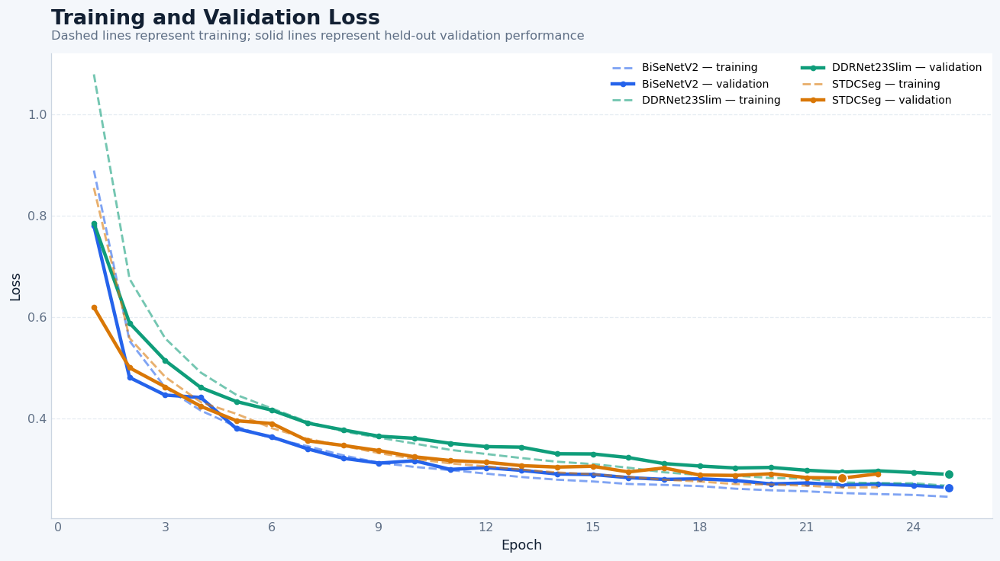

Saved figure: /kaggle/working/road_segmentation_outputs/figures/training_curve_loss.png


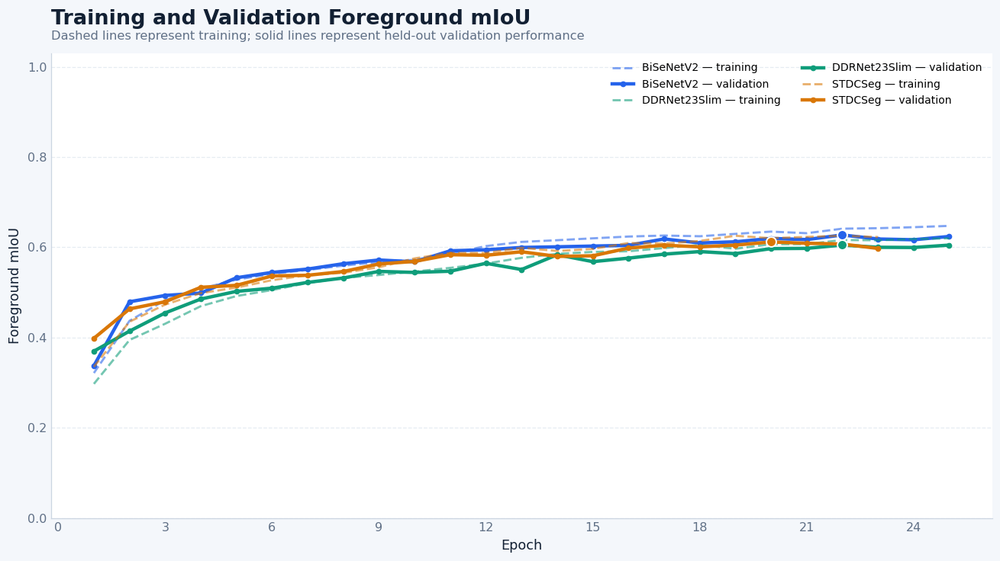

Saved figure: /kaggle/working/road_segmentation_outputs/figures/training_curve_mIoU_foreground.png


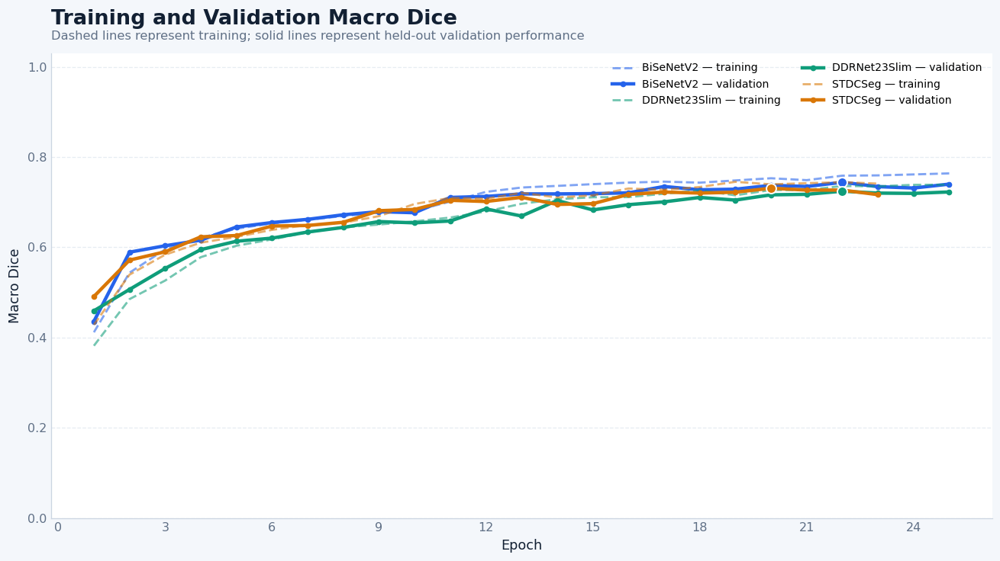

Saved figure: /kaggle/working/road_segmentation_outputs/figures/training_curve_macro_dice.png


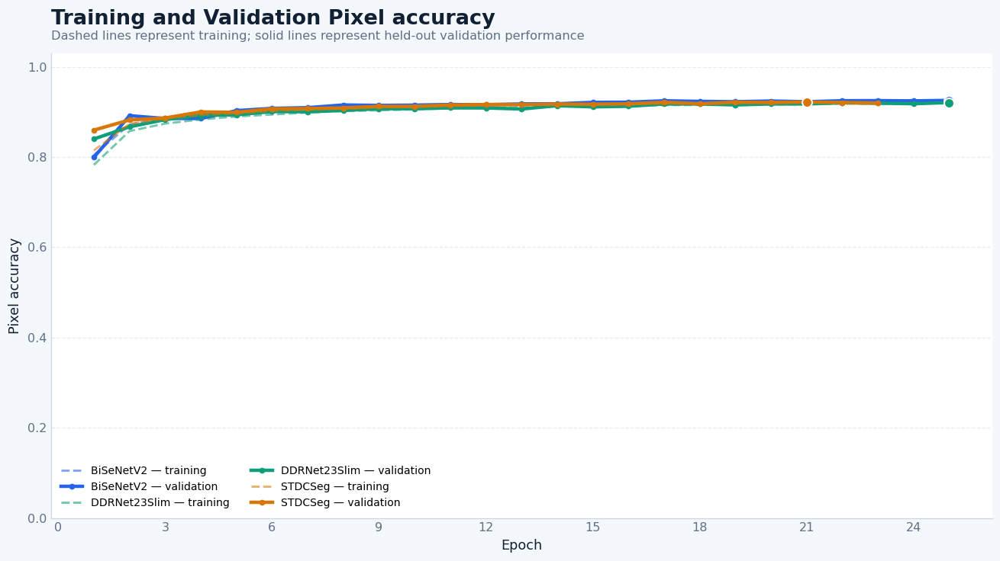

Saved figure: /kaggle/working/road_segmentation_outputs/figures/training_curve_pixel_accuracy.png


In [30]:
metric_pairs = [
    ("loss", "Loss"),
    ("mIoU_foreground", "Foreground mIoU"),
    ("macro_dice", "Macro Dice"),
    ("pixel_accuracy", "Pixel accuracy"),
]

for metric_key, metric_label in metric_pairs:
    fig, ax = plt.subplots(figsize=(11.5, 6.5))
    for model_name, group in combined_history.groupby("model"):
        group = group.sort_values("epoch")
        colour = MODEL_COLORS.get(model_name, THEME["accent"])
        ax.plot(
            group["epoch"],
            group[f"train_{metric_key}"],
            color=colour,
            linestyle="--",
            linewidth=1.8,
            alpha=0.58,
            label=f"{model_name} — training",
        )
        ax.plot(
            group["epoch"],
            group[f"val_{metric_key}"],
            color=colour,
            linewidth=2.8,
            marker="o",
            markersize=3.8,
            label=f"{model_name} — validation",
        )

        if metric_key != "loss":
            best_index = group[f"val_{metric_key}"].idxmax()
        else:
            best_index = group[f"val_{metric_key}"].idxmin()
        best_row = group.loc[best_index]
        ax.scatter(
            best_row["epoch"],
            best_row[f"val_{metric_key}"],
            s=65,
            color=colour,
            edgecolor="white",
            linewidth=1.2,
            zorder=5,
        )

    add_chart_heading(
        ax,
        f"Training and Validation {metric_label}",
        "Dashed lines represent training; solid lines represent held-out validation performance",
    )
    ax.set_xlabel("Epoch")
    ax.set_ylabel(metric_label)
    ax.xaxis.set_major_locator(MaxNLocator(integer=True))
    if metric_key != "loss":
        ax.set_ylim(0, 1.03)
    style_axis(ax)
    ax.legend(loc="best", ncol=2, fontsize=8.8)
    fig.tight_layout()
    save_research_figure(fig, f"training_curve_{metric_key}.png")

## 12. Load best checkpoints and evaluate validation/test sets

The locked test set is evaluated after training. Per-class tables and confusion matrices are saved for each model.

In [31]:
def load_trained_model(checkpoint_path: str):
    checkpoint = safe_torch_load(checkpoint_path, map_location=DEVICE)
    model = build_model(checkpoint["model_name"], checkpoint["num_classes"])
    model.load_state_dict(checkpoint["model_state_dict"], strict=True)
    model.eval()
    return model, checkpoint

validation_rows = []
test_rows = []
per_class_test_tables = {}
confusion_matrices = {}

for model_name in CFG.model_names:
    model, checkpoint = load_trained_model(checkpoint_paths[model_name])
    val_metrics, _, _ = run_epoch(model, validation_loader, training=False)
    test_metrics, test_per_class, test_confusion = run_epoch(model, test_loader, training=False)
    validation_rows.append({"model": model_name, **val_metrics})
    test_rows.append({"model": model_name, **test_metrics})
    per_class_test_tables[model_name] = test_per_class
    confusion_matrices[model_name] = test_confusion
    test_per_class.to_csv(TABLE_DIR / f"{model_name}_test_per_class_metrics.csv", index=False)
    np.save(TABLE_DIR / f"{model_name}_test_confusion.npy", test_confusion)
    del model
    gc.collect()
    if DEVICE.type == "cuda":
        torch.cuda.empty_cache()

validation_results_df = pd.DataFrame(validation_rows).sort_values("mIoU_foreground", ascending=False)
test_results_df = pd.DataFrame(test_rows).sort_values("mIoU_foreground", ascending=False)
validation_results_df.to_csv(TABLE_DIR / "validation_model_metrics.csv", index=False)
test_results_df.to_csv(TABLE_DIR / "test_model_metrics.csv", index=False)

print("Validation comparison")
display(validation_results_df)
print("Test comparison")
display(test_results_df)

Validation comparison


,model,pixel_accuracy,mean_class_accuracy,mIoU_all,mIoU_foreground,fwIoU,macro_precision,macro_recall,macro_specificity,macro_f1,macro_dice,loss,cross_entropy,dice_loss
0,BiSeNetV2,0.924744,0.829022,0.648458,0.627224,0.877769,0.706836,0.821915,0.993623,0.744047,0.744047,0.269510,0.249090,0.330770
2,STDCSeg,0.920869,0.818034,0.634060,0.611710,0.871072,0.688619,0.810005,0.993315,0.730821,0.730821,0.291364,0.272359,0.348379
1,DDRNet23Slim,0.920132,0.814695,0.627580,0.604848,0.870616,0.683423,0.806505,0.993254,0.724238,0.724238,0.294716,0.276231,0.350173


Test comparison


,model,pixel_accuracy,mean_class_accuracy,mIoU_all,mIoU_foreground,fwIoU,macro_precision,macro_recall,macro_specificity,macro_f1,macro_dice,loss,cross_entropy,dice_loss
0,BiSeNetV2,0.924617,0.842714,0.657229,0.636702,0.877451,0.710174,0.836723,0.993611,0.754093,0.754093,0.269375,0.248496,0.332013
2,STDCSeg,0.920523,0.825755,0.639723,0.617837,0.870547,0.693643,0.818350,0.993288,0.737481,0.737481,0.294372,0.275586,0.350729
1,DDRNet23Slim,0.919695,0.815608,0.628589,0.605931,0.869990,0.685368,0.807468,0.993222,0.725773,0.725773,0.298655,0.280895,0.351934


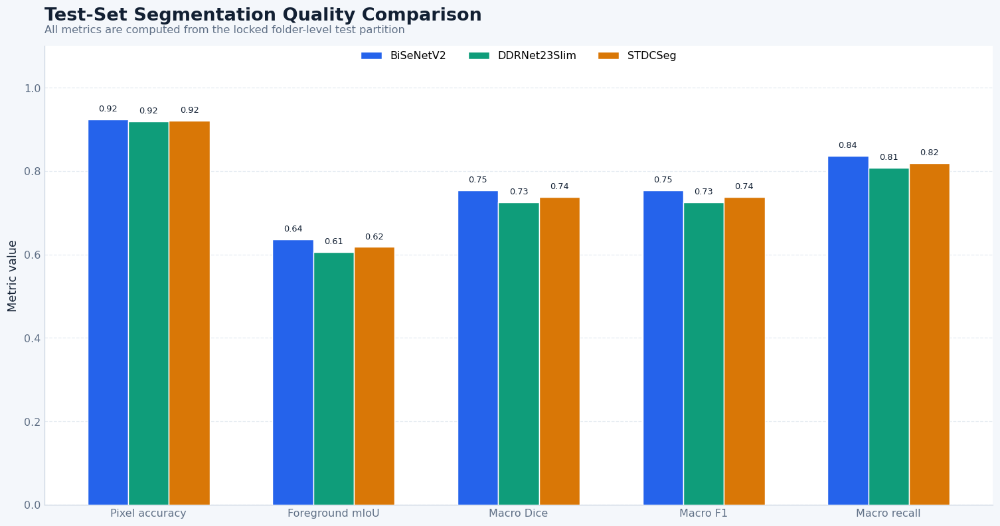

Saved figure: /kaggle/working/road_segmentation_outputs/figures/10_test_metric_comparison.png


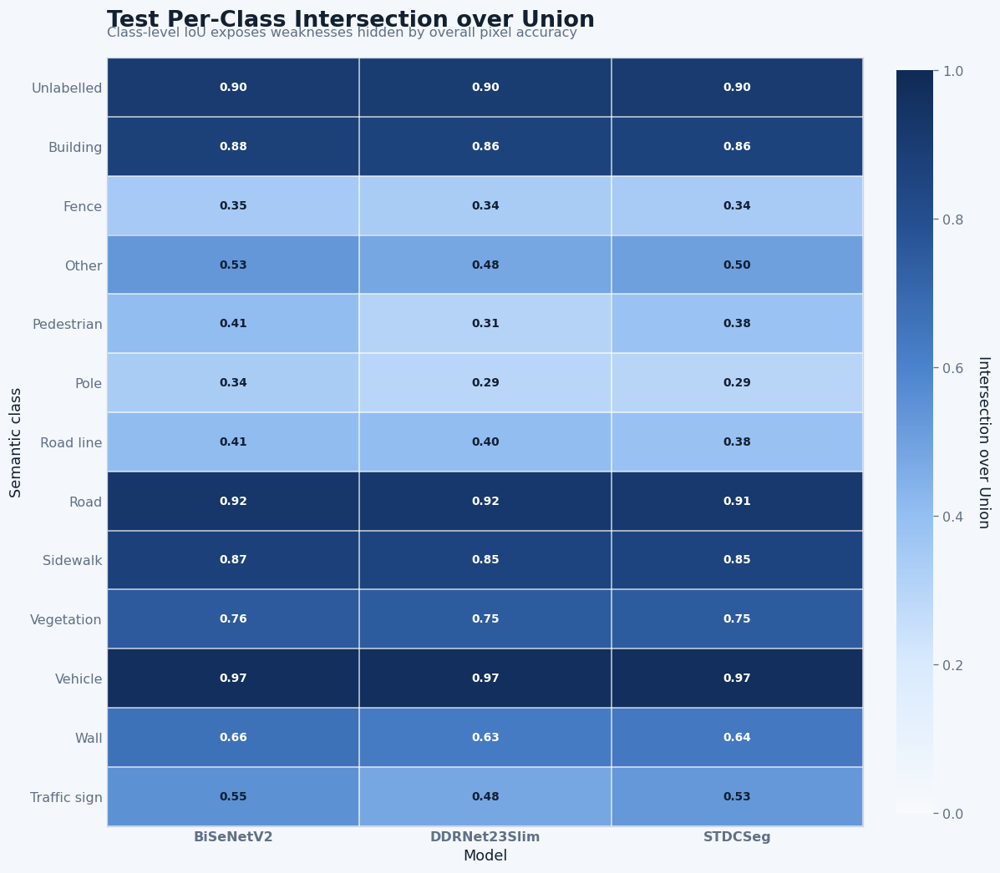

Saved figure: /kaggle/working/road_segmentation_outputs/figures/11_per_class_iou_heatmap.png


In [32]:

# Overall test metric comparison

plot_metrics = ["pixel_accuracy", "mIoU_foreground", "macro_dice", "macro_f1", "macro_recall"]
metric_labels = ["Pixel accuracy", "Foreground mIoU", "Macro Dice", "Macro F1", "Macro recall"]
comparison = test_results_df.set_index("model").loc[list(CFG.model_names), plot_metrics]

fig, ax = plt.subplots(figsize=(13.2, 7.0))
x = np.arange(len(plot_metrics))
models = list(comparison.index)
bar_width = 0.22

for model_index, model_name in enumerate(models):
    offset = (model_index - (len(models) - 1) / 2) * bar_width
    values = comparison.loc[model_name].to_numpy(dtype=float)
    bars = ax.bar(
        x + offset,
        values,
        width=bar_width,
        color=MODEL_COLORS.get(model_name, THEME["accent"]),
        label=model_name,
        edgecolor="white",
        linewidth=0.9,
        zorder=3,
    )
    for bar, value in zip(bars, values):
        ax.text(
            bar.get_x() + bar.get_width() / 2,
            value + 0.015,
            f"{value:.2f}",
            ha="center",
            va="bottom",
            fontsize=8.1,
            color=THEME["ink"],
        )

add_chart_heading(
    ax,
    "Test-Set Segmentation Quality Comparison",
    "All metrics are computed from the locked folder-level test partition",
)
ax.set_ylabel("Metric value")
ax.set_xticks(x)
ax.set_xticklabels(metric_labels)
ax.set_ylim(0, 1.10)
style_axis(ax)
ax.legend(loc="upper center", bbox_to_anchor=(0.5, 1.01), ncol=len(models))
fig.tight_layout()
save_research_figure(fig, "10_test_metric_comparison.png")



# Per-class IoU heatmap
# Matplotlib compatibility fix: set tick positions and labels separately.

per_class_iou = pd.DataFrame({
    model_name: table.set_index("class_name")["iou"]
    for model_name, table in per_class_test_tables.items()
})
per_class_iou = per_class_iou.loc[CLASS_NAMES, list(CFG.model_names)]

fig, ax = plt.subplots(figsize=(10.5, 9.2))
im = ax.imshow(
    per_class_iou.values,
    aspect="auto",
    vmin=0,
    vmax=1,
    cmap=HEATMAP_CMAP,
    interpolation="nearest",
)
ax.set_xticks(np.arange(len(per_class_iou.columns)))
ax.set_xticklabels(per_class_iou.columns, rotation=0, fontweight="semibold")
ax.set_yticks(np.arange(len(per_class_iou.index)))
ax.set_yticklabels(per_class_iou.index)
ax.set_xlabel("Model")
ax.set_ylabel("Semantic class")
add_chart_heading(
    ax,
    "Test Per-Class Intersection over Union",
    "Class-level IoU exposes weaknesses hidden by overall pixel accuracy",
)

ax.set_xticks(np.arange(-0.5, len(per_class_iou.columns), 1), minor=True)
ax.set_yticks(np.arange(-0.5, len(per_class_iou.index), 1), minor=True)
ax.grid(which="minor", color="white", linestyle="-", linewidth=1.0, alpha=0.75)
ax.tick_params(which="minor", bottom=False, left=False)
ax.tick_params(which="major", length=0)

for row_index in range(per_class_iou.shape[0]):
    for column_index in range(per_class_iou.shape[1]):
        value = float(per_class_iou.iloc[row_index, column_index])
        ax.text(
            column_index,
            row_index,
            f"{value:.2f}",
            ha="center",
            va="center",
            fontsize=8.6,
            color="#FFFFFF" if value >= 0.58 else THEME["ink"],
            fontweight="semibold",
        )

colour_bar = fig.colorbar(im, ax=ax, fraction=0.045, pad=0.04)
colour_bar.set_label("Intersection over Union", rotation=270, labelpad=20)
colour_bar.outline.set_visible(False)
fig.tight_layout()
save_research_figure(fig, "11_per_class_iou_heatmap.png")

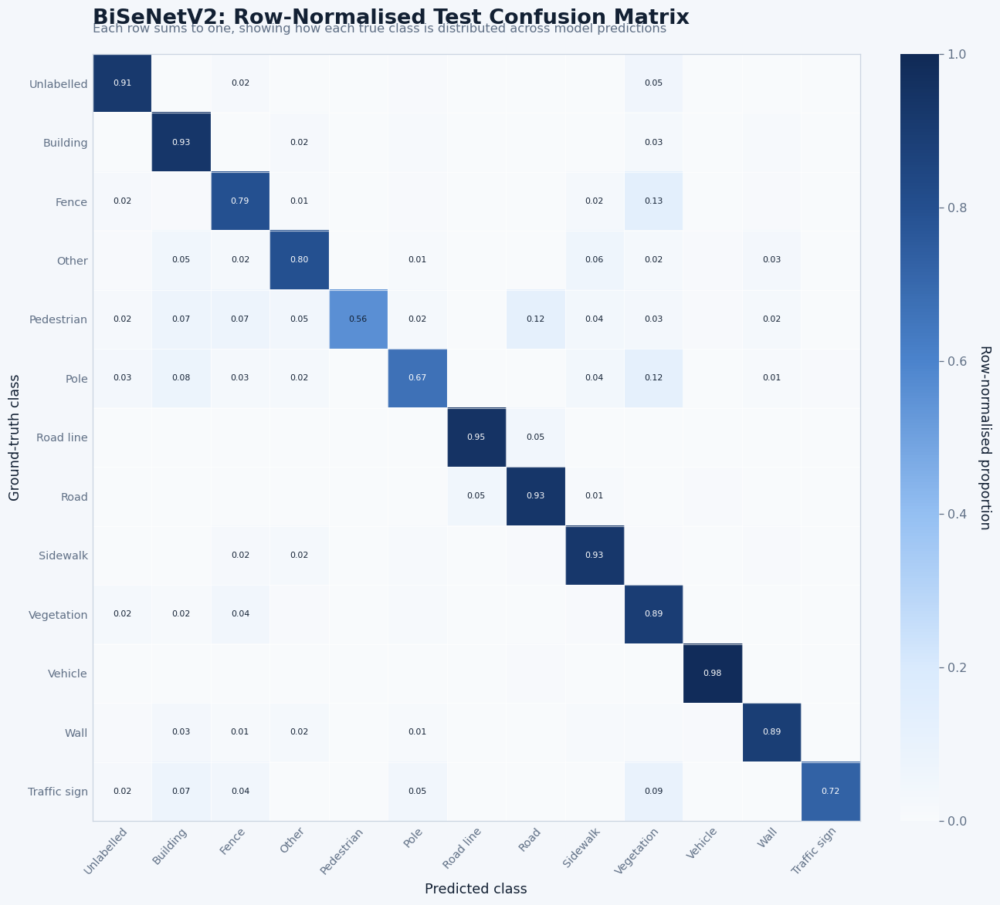

Saved figure: /kaggle/working/road_segmentation_outputs/figures/12_BiSeNetV2_confusion_matrix.png


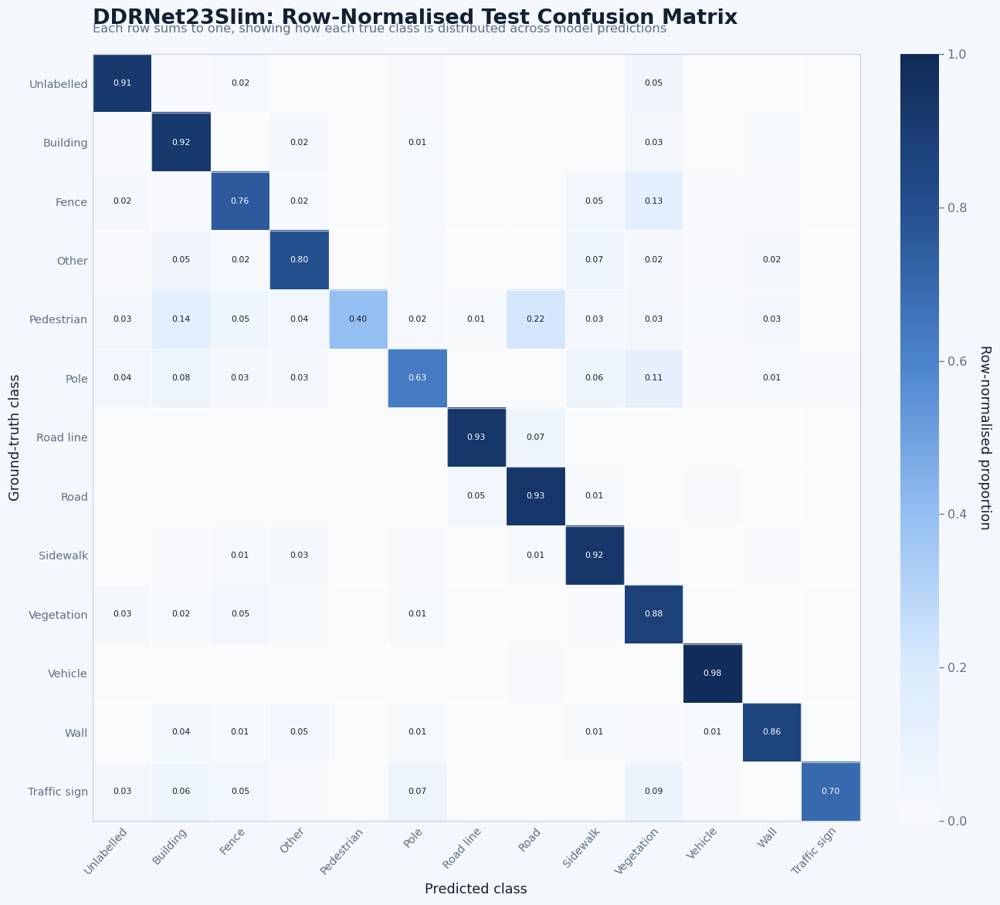

Saved figure: /kaggle/working/road_segmentation_outputs/figures/12_DDRNet23Slim_confusion_matrix.png


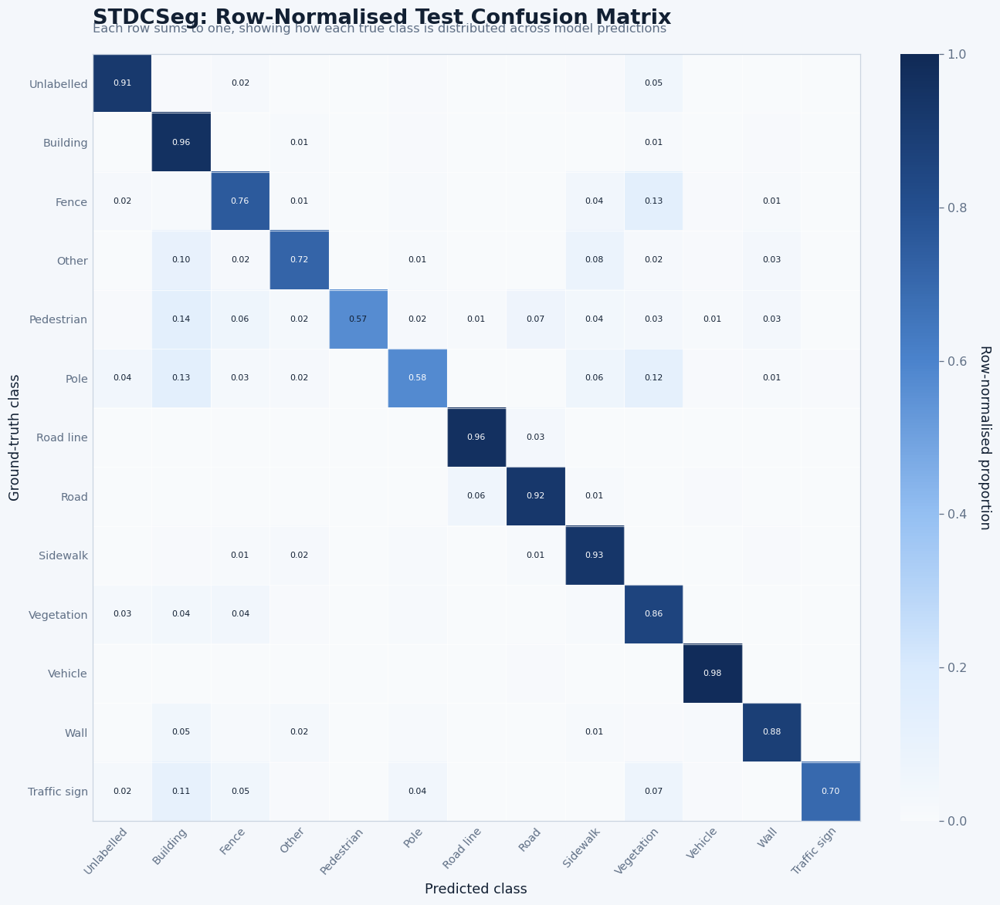

Saved figure: /kaggle/working/road_segmentation_outputs/figures/12_STDCSeg_confusion_matrix.png


In [33]:
# Row-normalised test confusion matrix for each model
for model_name, confusion in confusion_matrices.items():
    row_sums = confusion.sum(axis=1, keepdims=True)
    normalised = confusion / np.maximum(row_sums, 1)

    fig, ax = plt.subplots(figsize=(12.3, 10.3))
    im = ax.imshow(
        normalised,
        cmap=HEATMAP_CMAP,
        vmin=0,
        vmax=1,
        interpolation="nearest",
        aspect="equal",
    )
    ax.set_xticks(np.arange(CFG.num_classes))
    ax.set_xticklabels(CLASS_NAMES, rotation=48, ha="right", rotation_mode="anchor", fontsize=9)
    ax.set_yticks(np.arange(CFG.num_classes))
    ax.set_yticklabels(CLASS_NAMES, fontsize=9)
    ax.set_xlabel("Predicted class")
    ax.set_ylabel("Ground-truth class")
    add_chart_heading(
        ax,
        f"{model_name}: Row-Normalised Test Confusion Matrix",
        "Each row sums to one, showing how each true class is distributed across model predictions",
    )

    ax.set_xticks(np.arange(-0.5, CFG.num_classes, 1), minor=True)
    ax.set_yticks(np.arange(-0.5, CFG.num_classes, 1), minor=True)
    ax.grid(which="minor", color="white", linestyle="-", linewidth=0.75, alpha=0.65)
    ax.tick_params(which="minor", bottom=False, left=False)
    ax.tick_params(which="major", length=0)

    for row_index in range(CFG.num_classes):
        for column_index in range(CFG.num_classes):
            value = float(normalised[row_index, column_index])
            if value >= 0.01:
                ax.text(
                    column_index,
                    row_index,
                    f"{value:.2f}",
                    ha="center",
                    va="center",
                    fontsize=6.9,
                    color="#FFFFFF" if value >= 0.57 else THEME["ink"],
                )

    colour_bar = fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
    colour_bar.set_label("Row-normalised proportion", rotation=270, labelpad=20)
    colour_bar.outline.set_visible(False)
    fig.tight_layout()
    save_research_figure(fig, f"12_{model_name}_confusion_matrix.png")

## 13. Efficiency benchmarking: parameters, size, MACs, latency, FPS and memory

Latency uses batch size 1, a fixed input resolution, warm-up passes, CUDA synchronisation and repeated timed runs. Published FPS values from papers are not directly compared with these measurements because hardware and input settings differ.

In [34]:
from thop import profile


class TensorOutputWrapper(nn.Module):
    def __init__(self, model):
        super().__init__()
        self.model = model

    def forward(self, x):
        return self.model(x)["out"]


def state_dict_size_mb(model: nn.Module) -> float:
    size_bytes = 0
    for tensor in model.state_dict().values():
        size_bytes += tensor.numel() * tensor.element_size()
    return size_bytes / (1024 ** 2)


def benchmark_model(model: nn.Module):
    model.eval()
    wrapper = TensorOutputWrapper(model).to(DEVICE).eval()
    dummy = torch.randn(1, 3, CFG.image_height, CFG.image_width, device=DEVICE)
    total_params, trainable_params = count_parameters(model)

    try:
        macs, thop_params = profile(wrapper, inputs=(dummy,), verbose=False)
    except Exception as exc:
        print("THOP warning:", exc)
        macs, thop_params = np.nan, total_params

    if DEVICE.type == "cuda":
        torch.cuda.empty_cache()
        torch.cuda.reset_peak_memory_stats()

    with torch.no_grad():
        for _ in range(CFG.benchmark_warmup):
            _ = wrapper(dummy)
        if DEVICE.type == "cuda":
            torch.cuda.synchronize()

        timings_ms = []
        for _ in range(CFG.benchmark_runs):
            start = time.perf_counter()
            _ = wrapper(dummy)
            if DEVICE.type == "cuda":
                torch.cuda.synchronize()
            timings_ms.append((time.perf_counter() - start) * 1000)

    mean_latency = float(np.mean(timings_ms))
    median_latency = float(np.median(timings_ms))
    p95_latency = float(np.percentile(timings_ms, 95))
    peak_memory = (
        torch.cuda.max_memory_allocated() / (1024 ** 2)
        if DEVICE.type == "cuda" else np.nan
    )
    return {
        "total_parameters": total_params,
        "trainable_parameters": trainable_params,
        "model_size_mb": state_dict_size_mb(model),
        "macs_g": float(macs / 1e9) if np.isfinite(macs) else np.nan,
        "approx_flops_g": float(2 * macs / 1e9) if np.isfinite(macs) else np.nan,
        "mean_latency_ms": mean_latency,
        "median_latency_ms": median_latency,
        "p95_latency_ms": p95_latency,
        "fps": 1000.0 / mean_latency,
        "peak_gpu_memory_mb": peak_memory,
        "benchmark_device": str(DEVICE),
    }

efficiency_rows = []
for model_name in CFG.model_names:
    model, _ = load_trained_model(checkpoint_paths[model_name])
    efficiency_rows.append({"model": model_name, **benchmark_model(model)})
    del model
    gc.collect()
    if DEVICE.type == "cuda":
        torch.cuda.empty_cache()

efficiency_df = pd.DataFrame(efficiency_rows)
efficiency_df.to_csv(TABLE_DIR / "model_efficiency_metrics.csv", index=False)
display(efficiency_df)

combined_results_df = test_results_df.merge(efficiency_df, on="model", how="left")
combined_results_df.to_csv(TABLE_DIR / "final_accuracy_efficiency_comparison.csv", index=False)
display(combined_results_df)

,model,total_parameters,trainable_parameters,model_size_mb,macs_g,approx_flops_g,mean_latency_ms,median_latency_ms,p95_latency_ms,fps,peak_gpu_memory_mb,benchmark_device
0,BiSeNetV2,2088257,2088257,8.012897,1.701748,3.403496,4.571247,4.523437,4.860762,218.758681,57.309082,cuda
1,DDRNet23Slim,2305370,2305370,8.824074,0.804486,1.608972,6.093969,6.047307,6.469075,164.096678,53.091309,cuda
2,STDCSeg,8263815,8263815,31.562893,1.149723,2.299445,4.380167,4.333950,4.728623,228.301823,110.060059,cuda


,model,pixel_accuracy,mean_class_accuracy,mIoU_all,mIoU_foreground,fwIoU,macro_precision,macro_recall,macro_specificity,macro_f1,macro_dice,loss,cross_entropy,dice_loss,total_parameters,trainable_parameters,model_size_mb,macs_g,approx_flops_g,mean_latency_ms,median_latency_ms,p95_latency_ms,fps,peak_gpu_memory_mb,benchmark_device
0,BiSeNetV2,0.924617,0.842714,0.657229,0.636702,0.877451,0.710174,0.836723,0.993611,0.754093,0.754093,0.269375,0.248496,0.332013,2088257,2088257,8.012897,1.701748,3.403496,4.571247,4.523437,4.860762,218.758681,57.309082,cuda
1,STDCSeg,0.920523,0.825755,0.639723,0.617837,0.870547,0.693643,0.818350,0.993288,0.737481,0.737481,0.294372,0.275586,0.350729,8263815,8263815,31.562893,1.149723,2.299445,4.380167,4.333950,4.728623,228.301823,110.060059,cuda
2,DDRNet23Slim,0.919695,0.815608,0.628589,0.605931,0.869990,0.685368,0.807468,0.993222,0.725773,0.725773,0.298655,0.280895,0.351934,2305370,2305370,8.824074,0.804486,1.608972,6.093969,6.047307,6.469075,164.096678,53.091309,cuda


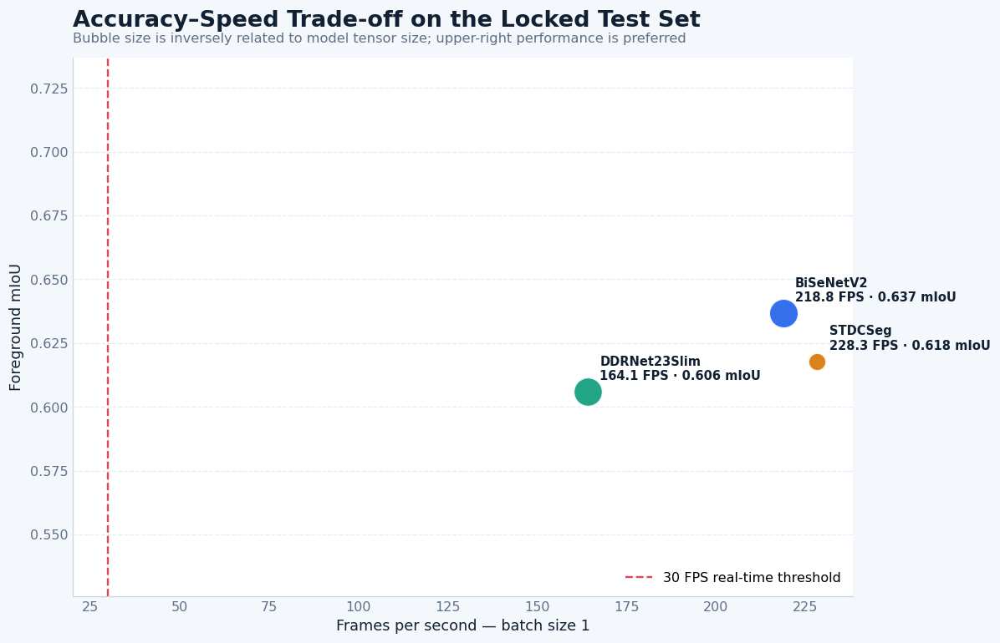

Saved figure: /kaggle/working/road_segmentation_outputs/figures/13_accuracy_speed_tradeoff.png


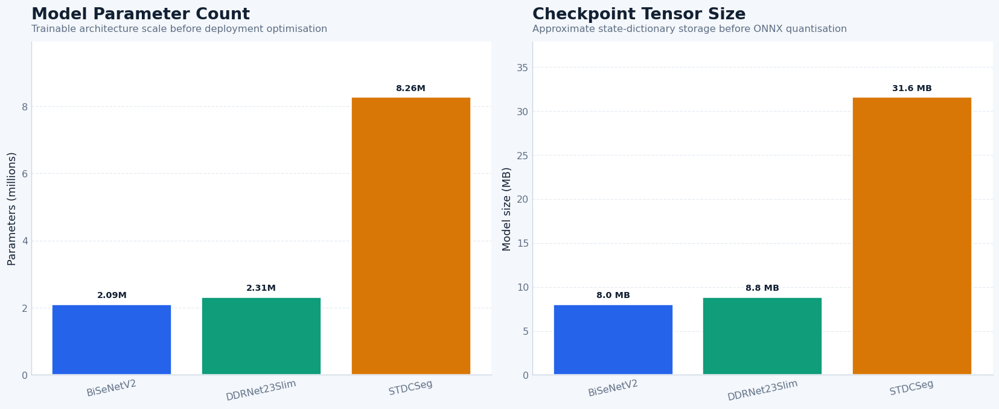

Saved figure: /kaggle/working/road_segmentation_outputs/figures/14_model_complexity.png


In [35]:
# -----------------------------------------------------------------------------
# Accuracy–speed trade-off
# -----------------------------------------------------------------------------
fig, ax = plt.subplots(figsize=(10.5, 6.8))
model_sizes = combined_results_df["model_size_mb"].to_numpy(dtype=float)
max_size = max(float(np.nanmax(model_sizes)), 1.0)

for row in combined_results_df.itertuples(index=False):
    colour = MODEL_COLORS.get(row.model, THEME["accent"])
    bubble_size = 190 + 420 * (1.0 - min(float(row.model_size_mb) / max_size, 1.0))
    ax.scatter(
        row.fps,
        row.mIoU_foreground,
        s=bubble_size,
        color=colour,
        edgecolor="white",
        linewidth=1.8,
        alpha=0.92,
        zorder=4,
    )
    ax.annotate(
        f"{row.model}\n{row.fps:.1f} FPS · {row.mIoU_foreground:.3f} mIoU",
        (row.fps, row.mIoU_foreground),
        xytext=(9, 9),
        textcoords="offset points",
        fontsize=9.2,
        color=THEME["ink"],
        fontweight="semibold",
    )

ax.axvline(
    30,
    color=THEME["danger"],
    linestyle="--",
    linewidth=1.5,
    label="30 FPS real-time threshold",
)
add_chart_heading(
    ax,
    "Accuracy–Speed Trade-off on the Locked Test Set",
    "Bubble size is inversely related to model tensor size; upper-right performance is preferred",
)
ax.set_xlabel("Frames per second — batch size 1")
ax.set_ylabel("Foreground mIoU")
ax.set_ylim(max(0, combined_results_df["mIoU_foreground"].min() - 0.08),
            min(1.0, combined_results_df["mIoU_foreground"].max() + 0.10))
style_axis(ax)
ax.legend(loc="lower right")
fig.tight_layout()
save_research_figure(fig, "13_accuracy_speed_tradeoff.png")



# Model parameter count and tensor size

complexity = efficiency_df.set_index("model").loc[list(CFG.model_names)].reset_index()
colours = [MODEL_COLORS.get(name, THEME["accent"]) for name in complexity["model"]]

fig, axes = plt.subplots(1, 2, figsize=(14.5, 6.0))
fig.patch.set_facecolor(THEME["page"])

parameter_values = complexity["total_parameters"].to_numpy(dtype=float) / 1e6
axes[0].bar(complexity["model"], parameter_values, color=colours, edgecolor="white", linewidth=1.0, zorder=3)
add_chart_heading(axes[0], "Model Parameter Count", "Trainable architecture scale before deployment optimisation")
axes[0].set_ylabel("Parameters (millions)")
axes[0].set_ylim(0, max(parameter_values) * 1.20)
style_axis(axes[0])
add_vertical_labels(axes[0], parameter_values, lambda value: f"{value:.2f}M")

size_values = complexity["model_size_mb"].to_numpy(dtype=float)
axes[1].bar(complexity["model"], size_values, color=colours, edgecolor="white", linewidth=1.0, zorder=3)
add_chart_heading(axes[1], "Checkpoint Tensor Size", "Approximate state-dictionary storage before ONNX quantisation")
axes[1].set_ylabel("Model size (MB)")
axes[1].set_ylim(0, max(size_values) * 1.20)
style_axis(axes[1])
add_vertical_labels(axes[1], size_values, lambda value: f"{value:.1f} MB")

for axis in axes:
    axis.tick_params(axis="x", rotation=12)

fig.tight_layout()
save_research_figure(fig, "14_model_complexity.png")

## 14. Qualitative test predictions and error maps

The error map highlights every incorrectly classified pixel. These visualisations should be used alongside numerical metrics to inspect boundary quality and rare-class failure cases.

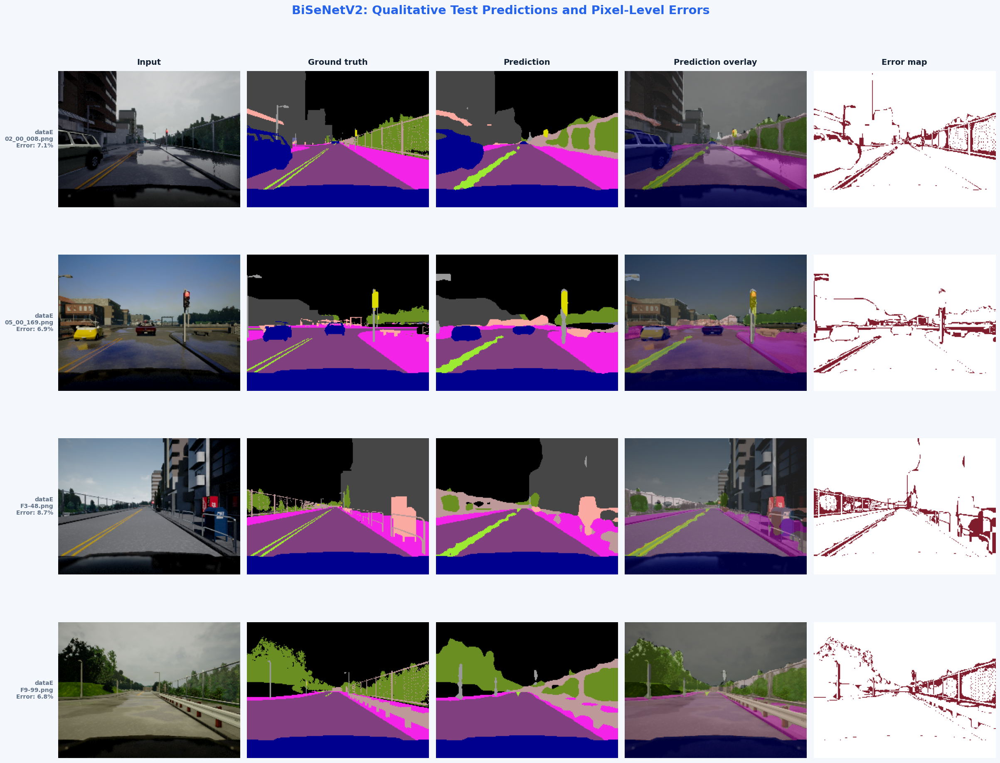

Saved figure: /kaggle/working/road_segmentation_outputs/figures/15_BiSeNetV2_qualitative_predictions.png


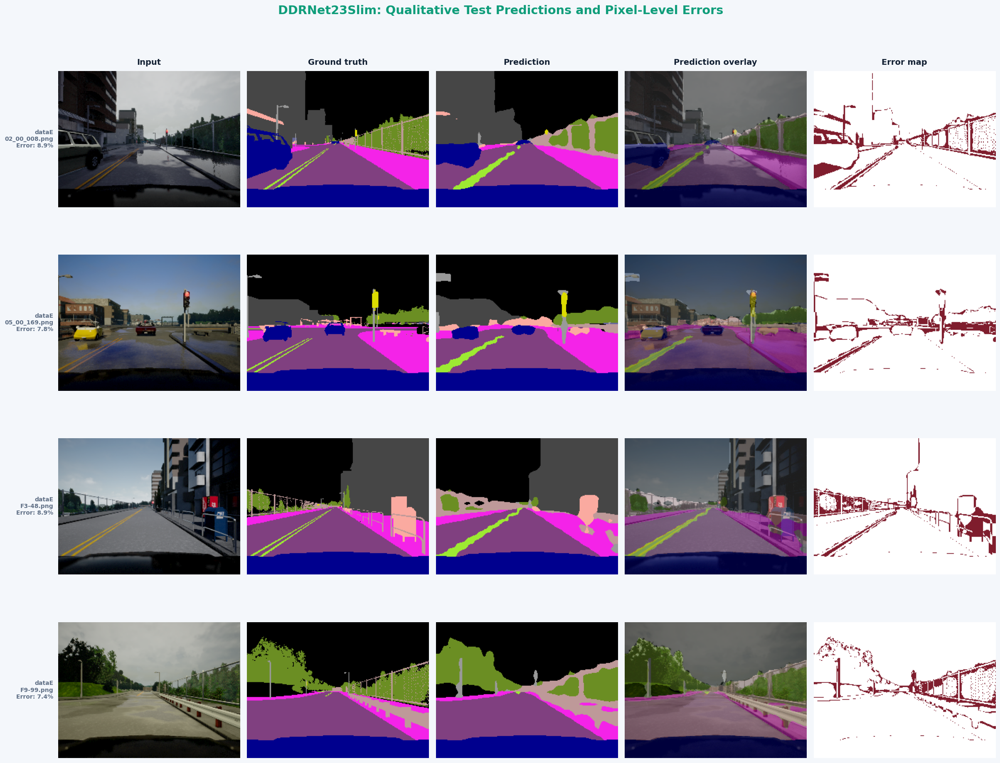

Saved figure: /kaggle/working/road_segmentation_outputs/figures/15_DDRNet23Slim_qualitative_predictions.png


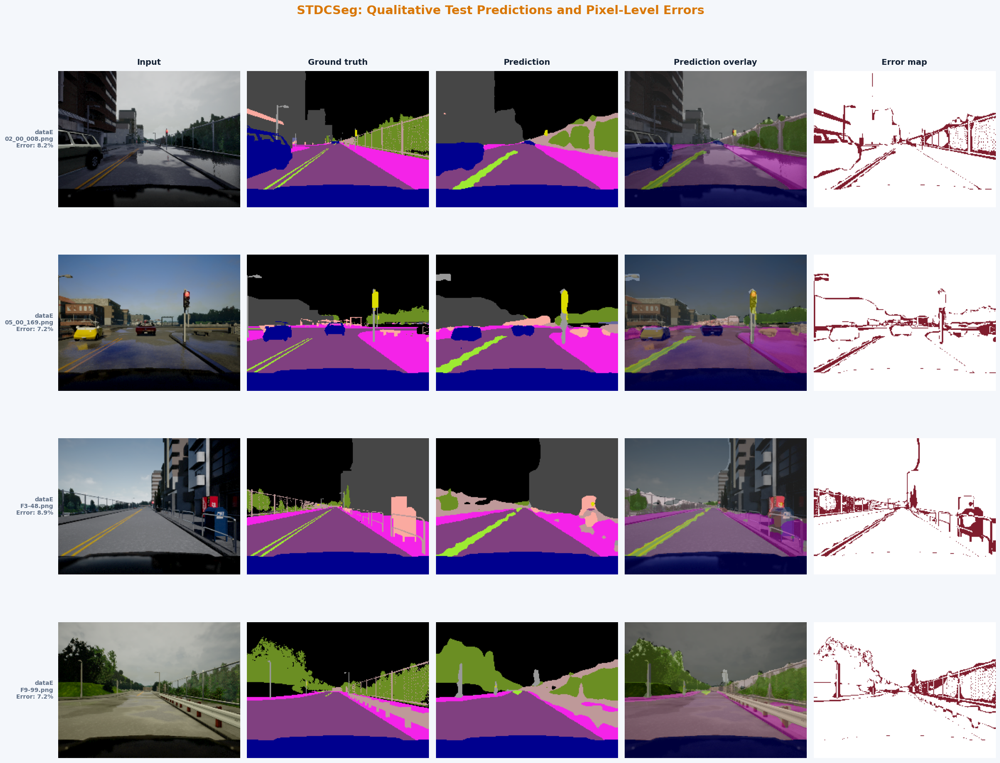

Saved figure: /kaggle/working/road_segmentation_outputs/figures/15_STDCSeg_qualitative_predictions.png


In [36]:
def predict_sample(model: nn.Module, item: Dict):
    image_tensor = item["image"].unsqueeze(0).to(DEVICE)
    with torch.no_grad():
        prediction = model(image_tensor)["out"].argmax(1)[0].cpu().numpy()
    image = item["image"].permute(1, 2, 0).numpy()
    image = np.clip(image * np.asarray(STD) + np.asarray(MEAN), 0, 1)
    target = item["mask"].numpy()
    return image, target, prediction

sample_indices = np.linspace(0, len(test_dataset) - 1, num=min(4, len(test_dataset)), dtype=int)
for model_name in CFG.model_names:
    model, _ = load_trained_model(checkpoint_paths[model_name])
    fig, axes = plt.subplots(len(sample_indices), 5, figsize=(21, 4.15 * len(sample_indices)))
    axes = np.atleast_2d(axes)
    fig.patch.set_facecolor(THEME["page"])
    column_titles = ["Input", "Ground truth", "Prediction", "Prediction overlay", "Error map"]

    for row_index, dataset_index in enumerate(sample_indices):
        item = test_dataset[int(dataset_index)]
        image, target, prediction = predict_sample(model, item)
        prediction_colour = colorize_mask(prediction)
        target_colour = colorize_mask(target)
        overlay = cv2.addWeighted((image * 255).astype(np.uint8), 0.58, prediction_colour, 0.42, 0)
        error_map = (prediction != target).astype(np.uint8)
        views = [image, target_colour, prediction_colour, overlay, error_map]

        for column_index, view in enumerate(views):
            axes[row_index, column_index].imshow(
                view,
                cmap=ERROR_CMAP if column_index == 4 else None,
                vmin=0 if column_index == 4 else None,
                vmax=1 if column_index == 4 else None,
            )
            axes[row_index, column_index].axis("off")
            if row_index == 0:
                axes[row_index, column_index].set_title(
                    column_titles[column_index],
                    fontsize=12.2,
                    fontweight="bold",
                    pad=9,
                )
            for spine in axes[row_index, column_index].spines.values():
                spine.set_visible(True)
                spine.set_color("#E2E8F0")
                spine.set_linewidth(1.0)

        error_percentage = 100.0 * error_map.mean()
        axes[row_index, 0].text(
            -0.025,
            0.5,
            f"{item['folder']}\n{item['filename']}\nError: {error_percentage:.1f}%",
            transform=axes[row_index, 0].transAxes,
            ha="right",
            va="center",
            fontsize=8.8,
            color=THEME["muted"],
            fontweight="semibold",
        )

    fig.suptitle(
        f"{model_name}: Qualitative Test Predictions and Pixel-Level Errors",
        fontsize=18,
        fontweight="bold",
        color=MODEL_COLORS.get(model_name, THEME["ink"]),
        y=1.005,
    )
    fig.tight_layout()
    save_research_figure(fig, f"15_{model_name}_qualitative_predictions.png")
    del model
    gc.collect()
    if DEVICE.type == "cuda":
        torch.cuda.empty_cache()

## 15. Select the final model and export deployment artefacts

The selected model maximises validation foreground mIoU. Test performance is reported for comparison but does not determine selection. The export includes:

- full PyTorch research checkpoint;
- fixed-shape ONNX model for local inference;
- deployment metadata with class labels, colours and preprocessing values;
- ONNX numerical validation against PyTorch.

## 15. Validation-based final model selection and ONNX export

The final architecture is selected using **validation foreground mIoU only**. The locked test set is not used to choose or tune the model.

The selected PyTorch checkpoint is exported to ONNX opset 12, structurally validated, and compared numerically with ONNX Runtime.


In [40]:

# SELECT FINAL VALIDATION MODEL AND EXPORT TO ONNX


validation_metrics_path = (
    TABLE_DIR
    / "validation_model_metrics.csv"
)

test_metrics_path = (
    TABLE_DIR
    / "test_model_metrics.csv"
)



# 1. LOAD VALIDATION METRICS


if (
    "validation_results_df" not in globals()
    or validation_results_df is None
    or len(validation_results_df) == 0
):
    if not validation_metrics_path.exists():
        raise FileNotFoundError(
            "Validation metrics are missing. "
            "Run the model-evaluation section first."
        )

    validation_results_df = pd.read_csv(
        validation_metrics_path
    )



# 2. LOAD TEST METRICS


if (
    "test_results_df" not in globals()
    or test_results_df is None
    or len(test_results_df) == 0
):
    if not test_metrics_path.exists():
        raise FileNotFoundError(
            "Test metrics are missing. "
            "Run the model-evaluation section first."
        )

    test_results_df = pd.read_csv(
        test_metrics_path
    )



# 3. RECOVER CHECKPOINT PATHS


if (
    "checkpoint_paths" not in globals()
    or not checkpoint_paths
):
    checkpoint_paths = {}

    for model_name in CFG.model_names:

        candidate = (
            CHECKPOINT_DIR
            / f"{model_name}_best.pt"
        )

        if candidate.exists():
            checkpoint_paths[
                model_name
            ] = str(
                candidate
            )


missing_checkpoints = [
    model_name
    for model_name in CFG.model_names
    if model_name not in checkpoint_paths
]

if missing_checkpoints:
    raise FileNotFoundError(
        "Missing trained checkpoints: "
        + ", ".join(
            missing_checkpoints
        )
    )



# 4. SELECT BEST MODEL USING VALIDATION FOREGROUND mIoU


required_validation_columns = {
    "model",
    "mIoU_foreground",
}

missing_validation_columns = (
    required_validation_columns
    - set(validation_results_df.columns)
)

if missing_validation_columns:
    raise KeyError(
        "Validation metrics table is missing required columns: "
        + ", ".join(
            sorted(missing_validation_columns)
        )
    )


selection_table = (
    validation_results_df
    .sort_values(
        "mIoU_foreground",
        ascending=False,
    )
    .reset_index(
        drop=True
    )
)

if len(selection_table) == 0:
    raise RuntimeError(
        "Validation metrics table is empty."
    )


selected_model_name = str(
    selection_table.iloc[0][
        "model"
    ]
)

selected_validation_miou = float(
    selection_table.iloc[0][
        "mIoU_foreground"
    ]
)

if selected_model_name not in checkpoint_paths:
    raise FileNotFoundError(
        "The selected validation model does not have "
        f"a checkpoint: {selected_model_name}"
    )


selected_checkpoint_path = (
    checkpoint_paths[
        selected_model_name
    ]
)


print(
    "Selected model:",
    selected_model_name,
)

print(
    "Validation foreground mIoU:",
    selected_validation_miou,
)

print(
    "Checkpoint:",
    selected_checkpoint_path,
)



# 5. LOAD SELECTED CHECKPOINT ON CPU


selected_checkpoint = safe_torch_load(
    selected_checkpoint_path,
    map_location="cpu",
)

print(
    "\nCheckpoint loaded successfully."
)



# 6. VALIDATE CHECKPOINT CONTENTS


required_checkpoint_keys = {
    "model_name",
    "num_classes",
    "model_state_dict",
}

missing_checkpoint_keys = (
    required_checkpoint_keys
    - set(selected_checkpoint.keys())
)

if missing_checkpoint_keys:
    raise KeyError(
        "Selected checkpoint is missing required keys: "
        + ", ".join(
            sorted(missing_checkpoint_keys)
        )
    )


checkpoint_model_name = str(
    selected_checkpoint[
        "model_name"
    ]
)

checkpoint_num_classes = int(
    selected_checkpoint[
        "num_classes"
    ]
)

print(
    "Checkpoint model:",
    checkpoint_model_name,
)

print(
    "Checkpoint classes:",
    checkpoint_num_classes,
)



# 7. REBUILD SELECTED MODEL DIRECTLY ON CPU

#
# We deliberately do NOT use build_model() here because
# build_model() may perform a validation tensor operation on
# DEVICE, which could be CUDA/P100.
#
# ONNX export itself does not require GPU.


selected_model = RealTimeSegmentationModel(
    model_name=checkpoint_model_name,
    num_classes=checkpoint_num_classes,
    use_auxiliary=False,
)

selected_model = (
    selected_model
    .cpu()
)

selected_model.load_state_dict(
    selected_checkpoint[
        "model_state_dict"
    ],
    strict=True,
)

selected_model.eval()

print(
    "Selected model rebuilt successfully on CPU."
)



# 8. COPY BEST PYTORCH CHECKPOINT TO DEPLOYMENT DIRECTORY


DEPLOY_DIR.mkdir(
    parents=True,
    exist_ok=True,
)

best_checkpoint_deployment_path = (
    DEPLOY_DIR
    / "best_model_checkpoint.pt"
)

shutil.copy2(
    selected_checkpoint_path,
    best_checkpoint_deployment_path,
)

print(
    "Best checkpoint copied to:",
    best_checkpoint_deployment_path,
)



# 9. CREATE ONNX OUTPUT WRAPPER

#
# IMPORTANT:
#
# Python constructors must use exactly:
#
#     def __init__(...):
#
# and:
#
#     super().__init__()
#
# with TWO underscores before and after "init".
#
# The wrapper ensures that ONNX receives a single tensor
# rather than a dictionary or other model-specific structure.
# ============================================================

class ONNXTensorWrapper(nn.Module):

    def __init__(
        self,
        model,
    ):
        super().__init__()

        self.model = model

    def forward(
        self,
        image,
    ):
        output = self.model(
            image
        )

        if isinstance(
            output,
            dict,
        ):
            if "out" not in output:
                raise KeyError(
                    "Model returned a dictionary but "
                    "the expected 'out' key was not found."
                )

            return output[
                "out"
            ]

        return output



# 10. INITIALISE ONNX WRAPPER


onnx_wrapper = ONNXTensorWrapper(
    selected_model
)

onnx_wrapper = (
    onnx_wrapper
    .cpu()
    .eval()
)

print(
    "ONNX wrapper created successfully."
)



# 11. DEFINE ONNX OUTPUT PATH


onnx_path = (
    DEPLOY_DIR
    / "best_model.onnx"
)

ONNX_OPSET = 12


# Delete an incomplete previous export if one exists.

if onnx_path.exists():
    onnx_path.unlink()



# 12. CREATE CPU DUMMY INPUT


dummy_input = torch.randn(
    1,
    3,
    CFG.image_height,
    CFG.image_width,
    dtype=torch.float32,
    device="cpu",
)

print(
    "\nDummy input shape:",
    tuple(
        dummy_input.shape
    ),
)

print(
    "Dummy input device:",
    dummy_input.device,
)



# 13. TEST PYTORCH FORWARD PASS BEFORE EXPORT


with torch.no_grad():
    test_output = onnx_wrapper(
        dummy_input
    )


if not isinstance(
    test_output,
    torch.Tensor,
):
    raise TypeError(
        "ONNX wrapper must return a torch.Tensor. "
        f"Received: {type(test_output)}"
    )


expected_output_shape = (
    1,
    checkpoint_num_classes,
    CFG.image_height,
    CFG.image_width,
)


print(
    "PyTorch test output shape:",
    tuple(
        test_output.shape
    ),
)


if tuple(
    test_output.shape
) != expected_output_shape:
    raise RuntimeError(
        "Unexpected model output shape.\n"
        f"Observed: {tuple(test_output.shape)}\n"
        f"Expected: {expected_output_shape}"
    )


if not torch.isfinite(
    test_output
).all():
    raise RuntimeError(
        "PyTorch forward pass produced "
        "NaN or infinite values."
    )


print(
    "PyTorch forward-pass check passed."
)



# 14. EXPORT MODEL TO ONNX

#
# dynamo=False is important.
#
# Newer PyTorch versions may otherwise attempt to use the
# Dynamo exporter, which can require additional dependencies
# such as onnxscript.
#
# The legacy exporter is sufficient for this deployment.


print(
    "\n"
    + "=" * 70
)

print(
    "EXPORTING SELECTED MODEL TO ONNX"
)

print(
    "=" * 70
)

print(
    "Model:",
    selected_model_name,
)

print(
    "Export device: CPU"
)

print(
    "ONNX opset:",
    ONNX_OPSET,
)


with torch.no_grad():
    torch.onnx.export(
        onnx_wrapper,
        dummy_input,
        str(
            onnx_path
        ),
        export_params=True,
        opset_version=ONNX_OPSET,
        do_constant_folding=True,
        input_names=[
            "image"
        ],
        output_names=[
            "logits"
        ],
        dynamic_axes={
            "image": {
                0: "batch"
            },
            "logits": {
                0: "batch"
            },
        },
        dynamo=False,
    )



# 15. VERIFY ONNX FILE EXISTS


if not onnx_path.exists():
    raise RuntimeError(
        "ONNX export failed because "
        "best_model.onnx was not created."
    )


onnx_size_mb = (
    onnx_path.stat().st_size
    / (1024 ** 2)
)


if onnx_path.stat().st_size == 0:
    raise RuntimeError(
        "ONNX export created an empty file."
    )


print(
    "\nONNX model created successfully."
)

print(
    "ONNX path:",
    onnx_path,
)

print(
    "ONNX size:",
    f"{onnx_size_mb:.2f} MB",
)



# 16. IMPORT AND VALIDATE ONNX MODEL


try:
    import onnx

except ModuleNotFoundError as exc:
    raise ModuleNotFoundError(
        "\nThe 'onnx' package is not installed.\n"
        "Run the dependency installation cell "
        "at the beginning of the notebook."
    ) from exc


onnx_graph = onnx.load(
    str(
        onnx_path
    )
)

onnx.checker.check_model(
    onnx_graph
)

print(
    "ONNX structural validation passed."
)



# 17. LOAD ONNX RUNTIME


try:
    import onnxruntime as ort

except ModuleNotFoundError as exc:
    raise ModuleNotFoundError(
        "\nThe 'onnxruntime' package is not installed.\n"
        "Run the dependency installation cell "
        "at the beginning of the notebook."
    ) from exc



# 18. CREATE ONNX RUNTIME SESSION


session = ort.InferenceSession(
    str(
        onnx_path
    ),
    providers=[
        "CPUExecutionProvider"
    ],
)


input_name = (
    session
    .get_inputs()[0]
    .name
)

output_name = (
    session
    .get_outputs()[0]
    .name
)


print(
    "\nONNX Runtime input:",
    input_name,
)

print(
    "ONNX Runtime output:",
    output_name,
)

print(
    "ONNX Runtime providers:",
    session.get_providers(),
)



# 19. PREPARE TEST INPUT FOR ONNX RUNTIME


dummy_numpy = (
    dummy_input
    .detach()
    .cpu()
    .numpy()
    .astype(
        np.float32,
        copy=False,
    )
)



# 20. PYTORCH INFERENCE


with torch.no_grad():

    pytorch_output = (
        onnx_wrapper(
            dummy_input
        )
        .detach()
        .cpu()
        .numpy()
    )



# 21. ONNX RUNTIME INFERENCE


onnx_output = session.run(
    [
        output_name
    ],
    {
        input_name:
        dummy_numpy
    },
)[0]



# 22. COMPARE OUTPUT SHAPES


print(
    "\nPyTorch output shape:",
    pytorch_output.shape,
)

print(
    "ONNX output shape:",
    onnx_output.shape,
)


if (
    pytorch_output.shape
    != onnx_output.shape
):
    raise RuntimeError(
        "PyTorch and ONNX output "
        "shapes do not match.\n"
        f"PyTorch: {pytorch_output.shape}\n"
        f"ONNX: {onnx_output.shape}"
    )


print(
    "PyTorch and ONNX output shapes match."
)



# 23. NUMERICAL PYTORCH VS ONNX VALIDATION


absolute_difference = np.abs(
    pytorch_output
    - onnx_output
)


max_absolute_difference = float(
    np.max(
        absolute_difference
    )
)

mean_absolute_difference = float(
    np.mean(
        absolute_difference
    )
)


print(
    "\nMaximum PyTorch-ONNX absolute difference:",
    max_absolute_difference,
)

print(
    "Mean PyTorch-ONNX absolute difference:",
    mean_absolute_difference,
)


if not np.isfinite(
    max_absolute_difference
):
    raise RuntimeError(
        "The ONNX numerical comparison "
        "produced a non-finite maximum value."
    )


if not np.isfinite(
    mean_absolute_difference
):
    raise RuntimeError(
        "The ONNX numerical comparison "
        "produced a non-finite mean value."
    )


# A small floating-point difference is normal between
# PyTorch and ONNX Runtime.

NUMERICAL_TOLERANCE = 1e-3


if max_absolute_difference > NUMERICAL_TOLERANCE:
    print(
        "\nWARNING:"
    )

    print(
        "The maximum PyTorch-ONNX difference "
        f"({max_absolute_difference:.8f}) is greater than "
        f"the reference tolerance ({NUMERICAL_TOLERANCE})."
    )

    print(
        "The export is structurally valid, but the numerical "
        "difference should be reviewed."
    )

else:
    print(
        "PyTorch-ONNX numerical validation passed."
    )



# 24. GET SELECTED MODEL TEST METRICS


if "model" not in test_results_df.columns:
    raise KeyError(
        "Test metrics table does not contain "
        "the required 'model' column."
    )


selected_test_rows = (
    test_results_df[
        test_results_df[
            "model"
        ]
        == selected_model_name
    ]
)


if len(
    selected_test_rows
) > 0:

    selected_test_metrics = (
        selected_test_rows
        .iloc[0]
        .to_dict()
    )

else:

    selected_test_metrics = {}

    print(
        "\nWARNING:"
    )

    print(
        "No matching test-metrics row was found for:",
        selected_model_name,
    )



# 25. JSON-SAFE CONVERSION FUNCTION


def json_safe(
    value,
):

    if isinstance(
        value,
        np.ndarray,
    ):
        return value.tolist()

    if isinstance(
        value,
        np.generic,
    ):
        return value.item()

    if isinstance(
        value,
        dict,
    ):
        return {
            str(key):
            json_safe(item)

            for key, item
            in value.items()
        }

    if isinstance(
        value,
        (
            list,
            tuple,
        ),
    ):
        return [
            json_safe(item)
            for item in value
        ]

    return value



# 26. CREATE DEPLOYMENT METADATA


metadata = {

    "project_title": (
        "Real-Time Road Scene Semantic Segmentation "
        "for Autonomous Driving Using Lightweight Deep Learning"
    ),

    "model_name":
    selected_model_name,

    "num_classes":
    checkpoint_num_classes,

    "class_names":
    list(
        CLASS_NAMES
    ),

    "class_colors": (
        np.asarray(
            CLASS_COLORS
        )
        .astype(
            int
        )
        .tolist()
    ),

    "image_height":
    int(
        CFG.image_height
    ),

    "image_width":
    int(
        CFG.image_width
    ),

    "mean": [
        float(value)

        for value
        in np.asarray(
            MEAN
        ).reshape(
            -1
        )
    ],

    "std": [
        float(value)

        for value
        in np.asarray(
            STD
        ).reshape(
            -1
        )
    ],

    "dataset_name": (
        "Lyft Udacity Challenge / "
        "CARLA semantic-segmentation dataset"
    ),

    "dataset_url": (
        "https://www.kaggle.com/datasets/"
        "kumaresanmanickavelu/"
        "lyft-udacity-challenge/data"
    ),

    "dataset_license":
    "CC0 1.0 Public Domain",

    "research_split": {

        "train": [
            "dataA",
            "dataB",
            "dataC",
        ],

        "validation": [
            "dataD"
        ],

        "test": [
            "dataE"
        ],

    },

    "selection_metric":
    "validation_mIoU_foreground",

    "best_validation_mIoU_foreground":
    selected_validation_miou,

    "test_metrics":
    json_safe(
        selected_test_metrics
    ),

    "preferred_pytorch_checkpoint":
    "best_model_checkpoint.pt",

    "preferred_onnx_file":
    "best_model.onnx",

    "onnx_opset":
    ONNX_OPSET,

    "onnx_exporter":
    "Legacy torch.onnx exporter (dynamo=False)",

    "onnx_export_device":
    "CPU",

    "onnx_runtime_provider":
    "CPUExecutionProvider",

    "onnx_validation_max_difference":
    max_absolute_difference,

    "onnx_validation_mean_difference":
    mean_absolute_difference,

    "onnx_validation_tolerance":
    NUMERICAL_TOLERANCE,

    "onnx_model_size_mb":
    float(
        onnx_size_mb
    ),

}



# 27. SAVE DEPLOYMENT METADATA


metadata_path = (
    DEPLOY_DIR
    / "deployment_metadata.json"
)


with metadata_path.open(
    "w",
    encoding="utf-8",
) as file:

    json.dump(
        json_safe(
            metadata
        ),
        file,
        indent=2,
    )


if not metadata_path.exists():
    raise RuntimeError(
        "Deployment metadata JSON "
        "was not created successfully."
    )


print(
    "\nDeployment metadata saved successfully."
)



# 28. FINAL SUMMARY


print(
    "\n"
    + "=" * 72
)

print(
    "ONNX EXPORT COMPLETED SUCCESSFULLY"
)

print(
    "=" * 72
)

print(
    f"Selected model: {selected_model_name}"
)

print(
    "Validation foreground mIoU:",
    f"{selected_validation_miou:.6f}",
)

print(
    f"ONNX opset: {ONNX_OPSET}"
)

print(
    "Export device: CPU"
)

print(
    "ONNX model:",
    onnx_path,
)

print(
    "ONNX model size:",
    f"{onnx_size_mb:.2f} MB",
)

print(
    "PyTorch checkpoint:",
    best_checkpoint_deployment_path,
)

print(
    "Deployment metadata:",
    metadata_path,
)

print(
    "Maximum PyTorch-ONNX difference:",
    f"{max_absolute_difference:.10f}",
)

print(
    "Mean PyTorch-ONNX difference:",
    f"{mean_absolute_difference:.10f}",
)

print(
    "=" * 72
)

Selected model: BiSeNetV2
Validation foreground mIoU: 0.6272242179539443
Checkpoint: /kaggle/working/road_segmentation_outputs/checkpoints/BiSeNetV2_best.pt

Checkpoint loaded successfully.
Checkpoint model: BiSeNetV2
Checkpoint classes: 13
Selected model rebuilt successfully on CPU.
Best checkpoint copied to: /kaggle/working/road_segmentation_outputs/deployment/best_model_checkpoint.pt
ONNX wrapper created successfully.

Dummy input shape: (1, 3, 192, 256)
Dummy input device: cpu
PyTorch test output shape: (1, 13, 192, 256)
PyTorch forward-pass check passed.

EXPORTING SELECTED MODEL TO ONNX
Model: BiSeNetV2
Export device: CPU
ONNX opset: 12

ONNX model created successfully.
ONNX path: /kaggle/working/road_segmentation_outputs/deployment/best_model.onnx
ONNX size: 7.17 MB
ONNX structural validation passed.

ONNX Runtime input: image
ONNX Runtime output: logits
ONNX Runtime providers: ['CPUExecutionProvider']

PyTorch output shape: (1, 13, 192, 256)
ONNX output shape: (1, 13, 192, 256)

## 16. Generate the complete Flask academic prototype

This section packages the selected ONNX model, deployment metadata, Flask server, HTML interface, requirements and run instructions into one ZIP file.

The application accepts PNG/JPG/JPEG/WEBP road images, generates a semantic mask and overlay, and reports predicted pixel composition by class. It is an offline academic demonstration only.


In [41]:

# CREATE A COMPLETE LOCAL FLASK APPLICATION PACKAGE


flask_root = OUTPUT_DIR / 'flask_app'
flask_models = flask_root / 'models'
flask_templates = flask_root / 'templates'
flask_models.mkdir(parents=True, exist_ok=True)
flask_templates.mkdir(parents=True, exist_ok=True)

target_path = flask_root / 'requirements.txt'
target_path.parent.mkdir(parents=True, exist_ok=True)
target_path.write_text('Flask>=2.2,<4\nnumpy>=1.23,<3\nPillow>=9.5,<13\nonnxruntime>=1.14,<2\n', encoding='utf-8')

target_path = flask_root / 'run_linux.sh'
target_path.parent.mkdir(parents=True, exist_ok=True)
target_path.write_text('#!/usr/bin/env bash\npython3 app.py\n', encoding='utf-8')

target_path = flask_root / 'run_windows.bat'
target_path.parent.mkdir(parents=True, exist_ok=True)
target_path.write_text('@echo off\npython app.py\npause\n', encoding='utf-8')

target_path = flask_root / 'README.md'
target_path.parent.mkdir(parents=True, exist_ok=True)
target_path.write_text('# Local Flask Road-Scene Segmentation App\n\nThis package is generated automatically by the Kaggle notebook after model training and ONNX optimisation.\n\n## Run on Windows\n\n```bat\npython -m venv .venv\n.venv\\Scripts\\activate\npython -m pip install --upgrade pip\npip install -r requirements.txt\npython app.py\n```\n\n## Run on macOS/Linux\n\n```bash\npython3 -m venv .venv\nsource .venv/bin/activate\npython -m pip install --upgrade pip\npip install -r requirements.txt\npython app.py\n```\n\nOpen `http://127.0.0.1:5000`.\n\nThe `models` directory contains the selected ONNX model and `deployment_metadata.json`.\n\n## Research limitation\n\nThe dataset contains synthetic CARLA simulator imagery. This application is an academic demonstration and is not a safety-certified autonomous-driving component.\n', encoding='utf-8')

target_path = flask_root / 'app.py'
target_path.parent.mkdir(parents=True, exist_ok=True)
target_path.write_text('from __future__ import annotations\n\nimport base64\nimport io\nimport json\nimport os\nfrom pathlib import Path\n\nimport numpy as np\nimport onnxruntime as ort\nfrom flask import Flask, jsonify, render_template, request\nfrom PIL import Image, UnidentifiedImageError\n\ntry:\n    BILINEAR = Image.Resampling.BILINEAR\n    NEAREST = Image.Resampling.NEAREST\nexcept AttributeError:\n    BILINEAR = Image.BILINEAR\n    NEAREST = Image.NEAREST\n\nBASE_DIR = Path(__file__).resolve().parent\nMODEL_DIR = BASE_DIR / "models"\nMETADATA_PATH = MODEL_DIR / "deployment_metadata.json"\nONNX_PATH = MODEL_DIR / "best_model.onnx"\n\napp = Flask(__name__)\napp.config["MAX_CONTENT_LENGTH"] = 12 * 1024 * 1024\nALLOWED_EXTENSIONS = {"png", "jpg", "jpeg", "webp"}\n\nsession = None\nmetadata = None\ninput_name = None\n\n\ndef initialise_model() -> None:\n    global session, metadata, input_name\n    if not METADATA_PATH.exists():\n        return\n    with METADATA_PATH.open("r", encoding="utf-8") as file:\n        metadata = json.load(file)\n    preferred_name = metadata.get("preferred_onnx_file", "best_model.onnx")\n    model_path = MODEL_DIR / preferred_name\n    if not model_path.exists():\n        model_path = MODEL_DIR / "best_model.onnx"\n    if not model_path.exists():\n        return\n    providers = ["CPUExecutionProvider"]\n    session = ort.InferenceSession(str(model_path), providers=providers)\n    input_name = session.get_inputs()[0].name\n    metadata["loaded_onnx_file"] = model_path.name\n\n\ndef allowed_file(filename: str) -> bool:\n    return "." in filename and filename.rsplit(".", 1)[1].lower() in ALLOWED_EXTENSIONS\n\n\ndef image_to_data_uri(image: Image.Image, image_format: str = "PNG") -> str:\n    buffer = io.BytesIO()\n    image.save(buffer, format=image_format)\n    encoded = base64.b64encode(buffer.getvalue()).decode("ascii")\n    return f"data:image/{image_format.lower()};base64,{encoded}"\n\n\ndef preprocess(image: Image.Image) -> np.ndarray:\n    image = image.convert("RGB")\n    width = int(metadata["image_width"])\n    height = int(metadata["image_height"])\n    resized = image.resize((width, height), BILINEAR)\n    array = np.asarray(resized, dtype=np.float32) / 255.0\n    mean = np.asarray(metadata["mean"], dtype=np.float32)\n    std = np.asarray(metadata["std"], dtype=np.float32)\n    array = (array - mean) / std\n    return np.transpose(array, (2, 0, 1))[None, ...].astype(np.float32)\n\n\ndef colourise(mask: np.ndarray) -> np.ndarray:\n    colours = np.asarray(metadata["class_colors"], dtype=np.uint8)\n    mask = np.clip(mask.astype(np.int64), 0, len(colours) - 1)\n    return colours[mask]\n\n\ndef predict(image: Image.Image):\n    original = image.convert("RGB")\n    original_size = original.size\n    model_input = preprocess(original)\n    logits = session.run(None, {input_name: model_input})[0]\n    mask = np.argmax(logits, axis=1)[0].astype(np.uint8)\n    mask_image = Image.fromarray(colourise(mask), mode="RGB")\n    mask_original_size = mask_image.resize(original_size, NEAREST)\n    overlay = Image.blend(original, mask_original_size, alpha=0.42)\n\n    class_ids, counts = np.unique(mask, return_counts=True)\n    total = int(counts.sum())\n    class_summary = []\n    for class_id, count in sorted(zip(class_ids.tolist(), counts.tolist()), key=lambda x: x[1], reverse=True):\n        class_summary.append({\n            "id": class_id,\n            "name": metadata["class_names"][class_id],\n            "percentage": round(count / max(total, 1) * 100, 2),\n        })\n    return mask_original_size, overlay, class_summary\n\n\ninitialise_model()\n\n\n@app.route("/", methods=["GET", "POST"])\ndef index():\n    context = {\n        "ready": session is not None,\n        "metadata": metadata,\n        "error": None,\n        "original_uri": None,\n        "mask_uri": None,\n        "overlay_uri": None,\n        "class_summary": None,\n    }\n    if request.method == "POST":\n        if session is None:\n            context["error"] = "Model files are missing. Copy best_model.onnx and deployment_metadata.json into the models folder."\n            return render_template("index.html", **context), 503\n        uploaded = request.files.get("image")\n        if uploaded is None or uploaded.filename == "":\n            context["error"] = "Choose an image before submitting."\n            return render_template("index.html", **context), 400\n        if not allowed_file(uploaded.filename):\n            context["error"] = "Supported formats: PNG, JPG, JPEG and WEBP."\n            return render_template("index.html", **context), 400\n        try:\n            image = Image.open(uploaded.stream).convert("RGB")\n        except (UnidentifiedImageError, OSError):\n            context["error"] = "The uploaded file is not a valid image."\n            return render_template("index.html", **context), 400\n\n        mask, overlay, class_summary = predict(image)\n        context.update({\n            "original_uri": image_to_data_uri(image),\n            "mask_uri": image_to_data_uri(mask),\n            "overlay_uri": image_to_data_uri(overlay),\n            "class_summary": class_summary,\n        })\n    return render_template("index.html", **context)\n\n\n@app.get("/health")\ndef health():\n    return jsonify({\n        "status": "ready" if session is not None else "model_missing",\n        "model_name": metadata.get("model_name") if metadata else None,\n    })\n\n\n@app.errorhandler(413)\ndef too_large(_error):\n    return render_template(\n        "index.html", ready=session is not None, metadata=metadata,\n        error="The uploaded image is larger than 12 MB.",\n        original_uri=None, mask_uri=None, overlay_uri=None, class_summary=None,\n    ), 413\n\n\nif __name__ == "__main__":\n    port = int(os.environ.get("PORT", "5000"))\n    app.run(host="127.0.0.1", port=port, debug=False)\n', encoding='utf-8')

target_path = flask_root / 'templates/index.html'
target_path.parent.mkdir(parents=True, exist_ok=True)
target_path.write_text('<!doctype html>\n<html lang="en">\n<head>\n  <meta charset="utf-8">\n  <meta name="viewport" content="width=device-width, initial-scale=1">\n  <title>Road Scene Semantic Segmentation</title>\n  <style>\n    :root { color-scheme: light; --ink:#172033; --muted:#62708a; --panel:#ffffff; --line:#dde4ef; --accent:#315efb; --bg:#f4f7fb; }\n    * { box-sizing: border-box; }\n    body { margin:0; font-family:Inter,Segoe UI,Arial,sans-serif; background:var(--bg); color:var(--ink); }\n    header { padding:36px 22px 28px; background:linear-gradient(120deg,#111a31,#243d77); color:white; }\n    header .wrap, main { max-width:1180px; margin:auto; }\n    h1 { margin:0 0 10px; font-size:clamp(28px,4vw,44px); }\n    header p { margin:0; max-width:850px; line-height:1.55; color:#dbe5ff; }\n    main { padding:28px 20px 50px; }\n    .card { background:var(--panel); border:1px solid var(--line); border-radius:16px; padding:22px; box-shadow:0 10px 30px rgba(27,45,85,.07); margin-bottom:22px; }\n    .status { display:inline-flex; align-items:center; gap:8px; padding:7px 11px; border-radius:999px; font-size:14px; background:#e8f7ee; color:#176b3b; }\n    .status.missing { background:#fff1ee; color:#9b2f20; }\n    form { display:flex; flex-wrap:wrap; gap:12px; align-items:center; margin-top:18px; }\n    input[type=file] { flex:1; min-width:260px; padding:12px; border:1px dashed #9aaccc; border-radius:10px; background:#f9fbff; }\n    button { border:0; border-radius:10px; padding:13px 20px; background:var(--accent); color:white; font-weight:700; cursor:pointer; }\n    button:hover { filter:brightness(.94); }\n    .error { margin-top:14px; padding:12px 14px; border-radius:10px; background:#fff0ed; color:#8c2f22; }\n    .grid { display:grid; grid-template-columns:repeat(3,1fr); gap:18px; }\n    .result img { width:100%; display:block; border-radius:12px; border:1px solid var(--line); }\n    .result h3 { margin:0 0 9px; }\n    table { width:100%; border-collapse:collapse; }\n    th,td { text-align:left; padding:10px 12px; border-bottom:1px solid var(--line); }\n    th { color:var(--muted); font-size:13px; text-transform:uppercase; letter-spacing:.04em; }\n    .note { color:var(--muted); line-height:1.55; }\n    code { background:#edf1f8; padding:2px 6px; border-radius:5px; }\n    @media (max-width:850px) { .grid { grid-template-columns:1fr; } }\n  </style>\n</head>\n<body>\n<header>\n  <div class="wrap">\n    <h1>Road Scene Semantic Segmentation</h1>\n    <p>Upload a road-scene image to generate a semantic mask and overlay using the ONNX model selected by validation mIoU in the Kaggle experiment.</p>\n  </div>\n</header>\n<main>\n  <section class="card">\n    {% if ready %}\n      <span class="status">Model ready{% if metadata %}: {{ metadata.model_name }}{% endif %}</span>\n    {% else %}\n      <span class="status missing">Model files missing</span>\n    {% endif %}\n    <form method="post" enctype="multipart/form-data">\n      <input type="file" name="image" accept="image/png,image/jpeg,image/webp" required>\n      <button type="submit">Run segmentation</button>\n    </form>\n    {% if error %}<div class="error">{{ error }}</div>{% endif %}\n    {% if not ready %}\n      <p class="note">Copy <code>best_model.onnx</code> and <code>deployment_metadata.json</code> from the Kaggle notebook\'s deployment folder into this application\'s <code>models</code> folder, then restart Flask.</p>\n    {% endif %}\n  </section>\n\n  {% if original_uri %}\n  <section class="grid">\n    <article class="card result"><h3>Original image</h3><img src="{{ original_uri }}" alt="Original road scene"></article>\n    <article class="card result"><h3>Semantic mask</h3><img src="{{ mask_uri }}" alt="Predicted semantic mask"></article>\n    <article class="card result"><h3>Overlay</h3><img src="{{ overlay_uri }}" alt="Segmentation overlay"></article>\n  </section>\n  {% endif %}\n\n  {% if class_summary %}\n  <section class="card">\n    <h2>Predicted pixel composition</h2>\n    <table>\n      <thead><tr><th>Class</th><th>Pixels (%)</th></tr></thead>\n      <tbody>\n        {% for item in class_summary %}\n        <tr><td>{{ item.name }}</td><td>{{ item.percentage }}</td></tr>\n        {% endfor %}\n      </tbody>\n    </table>\n  </section>\n  {% endif %}\n\n  <section class="card note">\n    <strong>Research limitation:</strong> the training dataset contains synthetic CARLA scenes. This application is an offline academic prototype and must not be used to control a vehicle or make safety-critical decisions.\n  </section>\n</main>\n</body>\n</html>\n', encoding='utf-8')

# Copy deployment metadata and available ONNX files.
deployment_metadata_path = DEPLOY_DIR / 'deployment_metadata.json'

if not deployment_metadata_path.exists():
    raise FileNotFoundError(
        'deployment_metadata.json was not found. '
        'Run the ONNX export cell before packaging Flask.'
    )

with deployment_metadata_path.open('r', encoding='utf-8') as file:
    flask_deployment_metadata = json.load(file)

preferred_onnx_file = flask_deployment_metadata.get(
    'preferred_onnx_file',
    'best_model.onnx',
)

shutil.copy2(
    deployment_metadata_path,
    flask_models / 'deployment_metadata.json',
)

copied_models = []

for model_filename in (
    'best_model.onnx',
    'best_model_int8.onnx',
):
    source_model = DEPLOY_DIR / model_filename

    if source_model.exists():
        shutil.copy2(
            source_model,
            flask_models / model_filename,
        )
        copied_models.append(model_filename)

if 'best_model.onnx' not in copied_models:
    raise FileNotFoundError(
        'best_model.onnx was not found. '
        'Run the ONNX export cell before packaging Flask.'
    )

if preferred_onnx_file not in copied_models:
    preferred_onnx_file = 'best_model.onnx'
    flask_deployment_metadata[
        'preferred_onnx_file'
    ] = preferred_onnx_file

    with (
        flask_models
        / 'deployment_metadata.json'
    ).open('w', encoding='utf-8') as file:
        json.dump(
            flask_deployment_metadata,
            file,
            indent=2,
        )

flask_archive = shutil.make_archive(
    '/kaggle/working/Road_Scene_Flask_App_Trained',
    'zip',
    root_dir=flask_root,
)

print(
    'Flask application directory:',
    flask_root,
)
print(
    'Models copied:',
    copied_models,
)
print(
    'Preferred model:',
    preferred_onnx_file,
)
print(
    'Download trained Flask package:',
    flask_archive,
)





Flask application directory: /kaggle/working/road_segmentation_outputs/flask_app
Models copied: ['best_model.onnx']
Preferred model: best_model.onnx
Download trained Flask package: /kaggle/working/Road_Scene_Flask_App_Trained.zip


## 17. Final reporting safeguards

Use `final_accuracy_efficiency_comparison.csv` as the principal comparative table.

Report:

1. validation and locked-test foreground mIoU for all three models;
2. pixel accuracy alongside mIoU to show the effect of class imbalance;
3. class-wise weaknesses, especially pedestrians, poles, road lines and traffic signs;
4. parameter count, model size, MACs/FLOPs, latency, FPS and GPU memory;
5. the validation-based reason for selecting the final model;
6. qualitative predictions and pixel-level error maps;
7. ONNX conversion validation;
8. the synthetic-to-real domain gap;
9. the fact that the Flask app is not safety-certified.

Do not claim a preselected accuracy target; report the experiment's actual metrics.


In [42]:

# CREATE FINAL RESULTS ZIP


results_zip_path = Path(
    "/kaggle/working/road_segmentation_outputs.zip"
)

if results_zip_path.exists():
    results_zip_path.unlink()

shutil.make_archive(
    str(results_zip_path.with_suffix("")),
    "zip",
    root_dir="/kaggle/working",
    base_dir="road_segmentation_outputs",
)

print("Results ZIP:", results_zip_path)
print(
    "Results ZIP size:",
    f"{results_zip_path.stat().st_size / (1024 ** 2):.2f} MB",
)


Results ZIP: /kaggle/working/road_segmentation_outputs.zip
Results ZIP size: 79.74 MB


## 18. UREC1 compliance checklist

- [x] No human participants or new human data collection
- [x] Public synthetic secondary dataset only
- [x] CC0 1.0 Public Domain dataset
- [x] 5,000 paired RGB/mask samples
- [x] dataA–dataC training, dataD validation, dataE locked test
- [x] Filename-safe image/mask pairing
- [x] 192 × 256 image processing
- [x] Nearest-neighbour mask resizing
- [x] Training augmentation
- [x] Class-imbalance handling
- [x] Weighted cross-entropy + multiclass Dice loss
- [x] BiSeNetV2
- [x] DDRNet-23-Slim
- [x] STDC-Seg
- [x] Pixel accuracy and class-sensitive segmentation metrics
- [x] Class-wise IoU and confusion matrices
- [x] Model complexity and real-time efficiency benchmarking
- [x] Validation-based model selection
- [x] Locked test evaluation
- [x] ONNX export
- [x] Flask academic prototype


In [43]:

# FINAL UREC1 ARTEFACT VERIFICATION


import zipfile

required_files = {
    "paired manifest":
        TABLE_DIR / "paired_file_manifest.csv",
    "validation metrics":
        TABLE_DIR / "validation_model_metrics.csv",
    "test metrics":
        TABLE_DIR / "test_model_metrics.csv",
    "accuracy-efficiency table":
        TABLE_DIR / "final_accuracy_efficiency_comparison.csv",
    "best checkpoint":
        DEPLOY_DIR / "best_model_checkpoint.pt",
    "ONNX model":
        DEPLOY_DIR / "best_model.onnx",
    "deployment metadata":
        DEPLOY_DIR / "deployment_metadata.json",
    "results ZIP":
        Path("/kaggle/working/road_segmentation_outputs.zip"),
    "Flask ZIP":
        Path("/kaggle/working/Road_Scene_Flask_App_Trained.zip"),
}

print("Final UREC1 artefact verification")
print("=" * 78)

all_ok = True

for label, path in required_files.items():
    exists = path.exists()
    all_ok = all_ok and exists

    size_mb = (
        path.stat().st_size / (1024 ** 2)
        if exists and path.is_file()
        else 0.0
    )

    print(
        f"{'OK' if exists else 'MISSING':8s} | "
        f"{label:26s} | "
        f"{size_mb:8.2f} MB | "
        f"{path}"
    )

manifest_path = TABLE_DIR / "paired_file_manifest.csv"

if manifest_path.exists() and not CFG.debug_run:
    manifest_check = pd.read_csv(manifest_path)

    expected_split_counts = {
        "train": 3000,
        "validation": 1000,
        "test": 1000,
    }

    observed_split_counts = (
        manifest_check["split"]
        .value_counts()
        .to_dict()
    )

    if len(manifest_check) != 5000:
        all_ok = False
        print(
            "\nERROR: manifest rows:",
            len(manifest_check),
            "(expected 5000)",
        )

    if observed_split_counts != expected_split_counts:
        all_ok = False
        print(
            "\nERROR: split counts:",
            observed_split_counts,
        )
        print(
            "Expected:",
            expected_split_counts,
        )

flask_zip = Path(
    "/kaggle/working/Road_Scene_Flask_App_Trained.zip"
)

if flask_zip.exists():
    with zipfile.ZipFile(flask_zip, "r") as archive:
        zip_members = set(archive.namelist())

    required_members = {
        "app.py",
        "requirements.txt",
        "templates/index.html",
        "models/best_model.onnx",
        "models/deployment_metadata.json",
    }

    missing_members = required_members - zip_members

    if missing_members:
        all_ok = False
        print("\nMissing Flask ZIP members:")
        for member in sorted(missing_members):
            print(" -", member)

if not all_ok:
    raise RuntimeError(
        "Final verification failed. Review the MISSING/ERROR lines above."
    )

print(
    "\nFINAL STATUS: all UREC1 research and deployment artefacts are present."
)


Final UREC1 artefact verification
OK       | paired manifest            |     1.09 MB | /kaggle/working/road_segmentation_outputs/tables/paired_file_manifest.csv
OK       | validation metrics         |     0.00 MB | /kaggle/working/road_segmentation_outputs/tables/validation_model_metrics.csv
OK       | test metrics               |     0.00 MB | /kaggle/working/road_segmentation_outputs/tables/test_model_metrics.csv
OK       | accuracy-efficiency table  |     0.00 MB | /kaggle/working/road_segmentation_outputs/tables/final_accuracy_efficiency_comparison.csv
OK       | best checkpoint            |     8.12 MB | /kaggle/working/road_segmentation_outputs/deployment/best_model_checkpoint.pt
OK       | ONNX model                 |     7.17 MB | /kaggle/working/road_segmentation_outputs/deployment/best_model.onnx
OK       | deployment metadata        |     0.00 MB | /kaggle/working/road_segmentation_outputs/deployment/deployment_metadata.json
OK       | results ZIP                |    79.74 